# SIIM-ISIC Melanoma Classification

## Description


Skin cancer is the most prevalent type of cancer. Melanoma, specifically, is responsible for 75% of skin cancer deaths, despite being the least common skin cancer. The American Cancer Society estimates over 100,000 new melanoma cases will be diagnosed in 2020. It's also expected that almost 7,000 people will die from the disease. As with other cancers, early and accurate detection—potentially aided by data science—can make treatment more effective.

Currently, dermatologists evaluate every one of a patient's moles to identify outlier lesions or “ugly ducklings” that are most likely to be melanoma. Existing AI approaches have not adequately considered this clinical frame of reference. Dermatologists could enhance their diagnostic accuracy if detection algorithms take into account “contextual” images within the same patient to determine which images represent a melanoma. If successful, classifiers would be more accurate and could better support dermatological clinic work.

### Accuracy: 





# 1.- Imports

Vamos a definir todas las librerías necesarias que van a ser utilizadas dentro del código.

Instalamos las librerías.

In [1]:
!pip install kaggle
!pip install wget

  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=5007f36cad5e77dd187bf5d69bb43f0036e7299f314e5e763b88ebd2b49fc38c
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget


Realizamos imports de todas aquellas que necesitamos.

In [2]:
# Imports generarles
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb


from PIL import Image
from tqdm import tqdm
from keras.models import model_from_json
from scipy.stats import normaltest

import glob
import math
import re
import os
import zipfile
import wget
import joblib

# Imports sklearn
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, roc_auc_score, precision_recall_curve
from sklearn.metrics import roc_curve, auc, precision_score, recall_score, f1_score, classification_report, confusion_matrix
from sklearn.utils.multiclass import unique_labels
from sklearn.model_selection import StratifiedKFold, train_test_split, cross_val_score, cross_validate, GridSearchCV

# Imports tensorflow
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers

import tensorflow.keras.backend as K

from tensorflow.keras.applications import Xception, ResNet50, DenseNet121, EfficientNetB5


# Imports Google Colab
from google.colab import auth
from google.colab import files

# Imports Google Cloud
from google.cloud import storage

#2.- Configuración

## 2.1.- Conexión con TPU

Escribimos el código necesario para obtener la conexión con la TPU, así como AUTO y el número de réplicas disponibles que tenemos para nuestro modelo de entrenamiento.

In [3]:
# DEVICE toma los siguiente valores: GPU y TPU
DEVICE = 'TPU'

if DEVICE == "TPU":
    print("Conectando a la TPU...")
    try:
        tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
        print('Corriendo en TPU ', tpu.master())
    except ValueError:
        print("No es posible conectar a la TPU")
        tpu = None

    if tpu:
        try:
            print("Iniciando la TPU..")
            tf.config.experimental_connect_to_cluster(tpu)
            tf.tpu.experimental.initialize_tpu_system(tpu)
            strategy = tf.distribute.experimental.TPUStrategy(tpu)
            print("TPU iniciado")
        except _:
            print("Fallo en la iniciación de la TPU")
    else:
        DEVICE = "GPU"

if DEVICE != "TPU":
    print("Usamos la estrategia predeterminada CPU y GPU")
    strategy = tf.distribute.get_strategy()

if DEVICE == "GPU":
    print("Número de GPUs disponibles: ", len(tf.config.experimental.list_physical_devices('GPU')))

# Toma de decisiones automáticas en tiempo de ejecución para optimizar el rendimiento.
AUTO = tf.data.experimental.AUTOTUNE
REPLICAS = strategy.num_replicas_in_sync
# Las réplicas en sincronía se utilizan comúnmente en el entrenamiento distribuido de modelos de
# aprendizaje automático, donde varias copias del modelo se ejecutan simultáneamente en diferentes
# dispositivos o máquinas para acelerar el entrenamiento.

REPLICAS = strategy.num_replicas_in_sync
print(f'REPLICAS: {REPLICAS}')

print("Versión de Tensorflow: " + tf.__version__)

Conectando a la TPU...
Corriendo en TPU  grpc://10.111.135.26:8470
Iniciando la TPU..


TPU iniciado
REPLICAS: 8
Versión de Tensorflow: 2.12.0


## 2.2.- Autentificación de GCP. Credenciales de GCP y Kaggle

Con el siguiente código, nos autenticamos con nuestra cuenta de Google para poder utilizar la conexión a GCP

In [4]:
 auth.authenticate_user()

Ahora procedemos con la subida de las credenciales de Kaggle y GCP, para poder descargar y subir el conjunto de datos que vamos a utilizar en nuestro proyecto.

In [ ]:
# Cargamos el archivo .json de Kaggle
files.upload()
# Configuramos las credenciales de Kaggle
os.environ['KAGGLE_CONFIG_DIR'] = '/content'
# Cargamos el archivo .json de GCP
files.upload()
# Configuramos las credenciales de GCP
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "/content"

Para evitar que las credenciales sean leídas dentro del sistema de carpetas de Google Colab, ejecutamos el siguiente código

## 2.3.- Descarga y Subida del Conjunto de Datos

Procedemos con la descarga y subida de todos los archivos que vamos a utilizar para nuestro modelo.

In [7]:
# Descarga de los archivos .csv del train y test.
!kaggle competitions download -c siim-isic-melanoma-classification -f test.csv -p /content/DatasetMelanoma
!kaggle competitions download -c siim-isic-melanoma-classification -f train.csv -p /content/DatasetMelanoma

# Descarga de los archivos .tfrec del test.
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test06-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test13-687.tfrec  -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test10-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test04-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test12-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test14-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test02-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test07-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test11-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test03-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test15-677.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test08-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test01-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test09-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test00-687.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/test05-687.tfrec -p /content/melanoma -q

# Descarga de los archivos .tfrec del train.
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train00-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train01-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train02-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train03-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train04-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train05-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train06-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train07-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train08-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train09-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train10-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train11-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train12-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train13-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train14-2071.tfrec -p /content/melanoma -q
!kaggle competitions download -c siim-isic-melanoma-classification -f tfrecords/train15-2061.tfrec -p /content/melanoma -q


  0% 0.00/479k [00:00<?, ?B/s]
100% 479k/479k [00:00<00:00, 5.12MB/s]
  0% 0.00/339k [00:00<?, ?B/s]
100% 339k/339k [00:00<00:00, 95.3MB/s]


Realizamos la descompresión del archivo train.csv.zip y lo guardamos en la misma ruta.

In [8]:
# Ruta del archivo zip
archivo_zip = "/content/DatasetMelanoma/train.csv.zip"

# Ruta donde guardar el archivo CSV descomprimido
archivo_csv = "/content/DatasetMelanoma/train.csv"

# Descomprimir el archivo zip
with zipfile.ZipFile(archivo_zip, 'r') as zip_ref:
    zip_ref.extractall("/content/DatasetMelanoma/")

# Eliminar el archivo zip original
os.remove(archivo_zip)

print(f"Archivo {archivo_csv} descomprimido y archivo zip eliminado.")


Archivo /content/DatasetMelanoma/train.csv descomprimido y archivo zip eliminado.


Ahora vamos a realizar la descompresión de los archivos zip. Para ello, los guardamos en la nueva ruta de "/content/DatasetMelanoma" dentro de Google Colab. Ya en dicha ruta hemos guardado los archivos .csv de train y test del conjunto de datos.

También eliminamos las carpetas antiguas que contienen los archivos zip.

In [9]:
# Rutas de entrada y salida en local
input_folder = '/content/melanoma'
output_folder = '/content/DatasetMelanoma'

# Crear la carpeta de salida si no existe
os.makedirs(output_folder, exist_ok=True)

# Obtener la lista de archivos .zip en la carpeta de entrada
zip_files = [f for f in os.listdir(input_folder) if f.endswith('.zip')]

# Descomprimir los archivos .zip y mover los .tfrec a la carpeta de salida
for zip_file in zip_files:
    zip_path = os.path.join(input_folder, zip_file)
    # Descomprimir el archivo .zip
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        for file_info in zip_ref.infolist():
            if file_info.filename.endswith('.tfrec'):
                # Extraer el archivo .tfrec al directorio de salida
                zip_ref.extract(file_info, output_folder)

    print(f'{zip_file} descomprimido y archivo .tfrec movido a {output_folder}')

print("Descompresión y movimiento de .tfrec completados.")

# Eliminar archivos dentro de la carpeta
for root, dirs, files in os.walk(input_folder, topdown=False):
    for file in files:
        os.remove(os.path.join(root, file))

# Eliminar la carpeta vacía
os.rmdir(input_folder)

print(f'Carpeta {input_folder} eliminada.')

train05-2071.tfrec.zip descomprimido y archivo .tfrec movido a /content/DatasetMelanoma
test14-687.tfrec.zip descomprimido y archivo .tfrec movido a /content/DatasetMelanoma
test09-687.tfrec.zip descomprimido y archivo .tfrec movido a /content/DatasetMelanoma
train01-2071.tfrec.zip descomprimido y archivo .tfrec movido a /content/DatasetMelanoma
test04-687.tfrec.zip descomprimido y archivo .tfrec movido a /content/DatasetMelanoma
test05-687.tfrec.zip descomprimido y archivo .tfrec movido a /content/DatasetMelanoma
test08-687.tfrec.zip descomprimido y archivo .tfrec movido a /content/DatasetMelanoma
train11-2071.tfrec.zip descomprimido y archivo .tfrec movido a /content/DatasetMelanoma
test02-687.tfrec.zip descomprimido y archivo .tfrec movido a /content/DatasetMelanoma
train02-2071.tfrec.zip descomprimido y archivo .tfrec movido a /content/DatasetMelanoma
test12-687.tfrec.zip descomprimido y archivo .tfrec movido a /content/DatasetMelanoma
train06-2071.tfrec.zip descomprimido y archivo

Ahora procedemos con la subida de los archivos .tfrec a GCP de Cloud Storage. Para ello, creamos un bucket dentro de Cloud Storage y lo vamos a guardar en la ruta de "DataKaggleTFM/nombre_archivo".

In [10]:

# Crea una instancia del cliente de Google Cloud Storage
client = storage.Client()

# Ruta local donde se encuentran los archivos descomprimidos
ruta_local = '/content/DatasetMelanoma'

# Lista de archivos locales
archivos_locales = os.listdir(ruta_local)

# Sube cada archivo al bucket
for archivo in archivos_locales:
    ruta_archivo_local = os.path.join(ruta_local, archivo)
    ruta_archivo_bucket = f"DataKaggleTFM/{archivo}"
    bucket = client.get_bucket(bucket_name)
    blob = bucket.blob(ruta_archivo_bucket)
    blob.upload_from_filename(ruta_archivo_local)
    print(f"Archivo {archivo} subido a {ruta_archivo_bucket} en el bucket.")

print("Carga completada.")

Archivo test10-687.tfrec subido a DataKaggleTFM/test10-687.tfrec en el bucket.
Archivo train.csv subido a DataKaggleTFM/train.csv en el bucket.
Archivo train04-2071.tfrec subido a DataKaggleTFM/train04-2071.tfrec en el bucket.
Archivo train14-2071.tfrec subido a DataKaggleTFM/train14-2071.tfrec en el bucket.
Archivo test00-687.tfrec subido a DataKaggleTFM/test00-687.tfrec en el bucket.
Archivo test.csv subido a DataKaggleTFM/test.csv en el bucket.
Archivo test14-687.tfrec subido a DataKaggleTFM/test14-687.tfrec en el bucket.
Archivo train00-2071.tfrec subido a DataKaggleTFM/train00-2071.tfrec en el bucket.
Archivo train11-2071.tfrec subido a DataKaggleTFM/train11-2071.tfrec en el bucket.
Archivo train08-2071.tfrec subido a DataKaggleTFM/train08-2071.tfrec en el bucket.
Archivo test08-687.tfrec subido a DataKaggleTFM/test08-687.tfrec en el bucket.
Archivo train02-2071.tfrec subido a DataKaggleTFM/train02-2071.tfrec en el bucket.
Archivo train01-2071.tfrec subido a DataKaggleTFM/train01-

# 3.- Análisis Exploratorio y Preprocesado de los Datos

## 3.1.- Datos Tabulares

Realizamos la lectura de los datos tabulares de nuestro conjunto de datos del cáncer del melanoma. Mostraremos la información de ambos dataframe.

In [107]:
train = pd.read_csv("/content/DatasetMelanoma/train.csv")
test = pd.read_csv("/content/DatasetMelanoma/test.csv")

Veamos el número de filas que tiene cada dataframe.

In [108]:
print('El dataframe Train tiene {:} filas y el dataframe Test tiene {:} filas.'.format(len(train), len(test)))

El dataframe Train tiene 33126 filas y el dataframe Test tiene 10982 filas.


In [110]:
test.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge
0,ISIC_0052060,IP_3579794,male,70.0,NaN
1,ISIC_0052349,IP_7782715,male,40.0,lower extremity
2,ISIC_0058510,IP_7960270,female,55.0,torso
3,ISIC_0073313,IP_6375035,female,50.0,torso
4,ISIC_0073502,IP_0589375,female,45.0,lower extremity


Veamos ahora la información que tiene ambos dataframe, para poder ver sus variables, el conteo de valores no nulos y el tipo de datos que es (a partir de la lectura que ha realizado python).

In [13]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     33126 non-null  object 
 1   patient_id                     33126 non-null  object 
 2   sex                            33061 non-null  object 
 3   age_approx                     33058 non-null  float64
 4   anatom_site_general_challenge  32599 non-null  object 
 5   diagnosis                      33126 non-null  object 
 6   benign_malignant               33126 non-null  object 
 7   target                         33126 non-null  int64  
dtypes: float64(1), int64(1), object(6)
memory usage: 2.0+ MB


In [14]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10982 entries, 0 to 10981
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   image_name                     10982 non-null  object 
 1   patient_id                     10982 non-null  object 
 2   sex                            10982 non-null  object 
 3   age_approx                     10982 non-null  float64
 4   anatom_site_general_challenge  10631 non-null  object 
dtypes: float64(1), object(4)
memory usage: 429.1+ KB


Ahora vamos a utilizar únicamente el conjunto train para realizar el análisis de datos exploratorio, ya que el conjunto test sirve para realizar las predicciones dentro de Kaggle. Si realizamos alguna transformación o eliminación de alguna variable en train, también la aplicaremos al test.

Antes de nada, vamos a ver el número de valores distintos que tiene cada variable.

In [15]:
train.nunique()

image_name                       33126
patient_id                        2056
sex                                  2
age_approx                          18
anatom_site_general_challenge        6
diagnosis                            9
benign_malignant                     2
target                               2
dtype: int64

In [16]:
test.nunique()

image_name                       10982
patient_id                         690
sex                                  2
age_approx                          17
anatom_site_general_challenge        6
dtype: int64

Vemos que para las variables object de sex, anatom_site_general_challenge , diagnosis, benign_malignant y target, tienen menos de 10 valores diferentes, por tanto, vamos a proceder con la conversión del tipo de datos de todas las variables tanto del train como test.

Vamos a usar la función **loc** para filtrar sobre la condición de valores únicos de la variable.



In [17]:
listaCatTrain = train.select_dtypes(include = 'object').columns
listaCatTest = test.select_dtypes(include = 'object').columns

for col in listaCatTrain:
  train[col] = train[col].astype('category')

for col in listaCatTest:
  test[col] = test[col].astype('category')

Comprobamos que efectivamente se ha realizado el cambio de tipo de variable.

In [18]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   image_name                     33126 non-null  category
 1   patient_id                     33126 non-null  category
 2   sex                            33061 non-null  category
 3   age_approx                     33058 non-null  float64 
 4   anatom_site_general_challenge  32599 non-null  category
 5   diagnosis                      33126 non-null  category
 6   benign_malignant               33126 non-null  category
 7   target                         33126 non-null  int64   
dtypes: category(6), float64(1), int64(1)
memory usage: 2.2 MB


In [19]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10982 entries, 0 to 10981
Data columns (total 5 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   image_name                     10982 non-null  category
 1   patient_id                     10982 non-null  category
 2   sex                            10982 non-null  category
 3   age_approx                     10982 non-null  float64 
 4   anatom_site_general_challenge  10631 non-null  category
dtypes: category(4), float64(1)
memory usage: 516.0 KB


Vamos a obtener un descriptivos de los datos que tenemos en train.

In [20]:
train.describe()

,age_approx,target
count,33058.000000,33126.000000
mean,48.870016,0.017630
std,14.380360,0.131603
min,0.000000,0.000000
25%,40.000000,0.000000
50%,50.000000,0.000000
75%,60.000000,0.000000
max,90.000000,1.000000


In [21]:
train.describe(exclude = np.number)

,image_name,patient_id,sex,anatom_site_general_challenge,diagnosis,benign_malignant
count,33126,33126,33061,32599,33126,33126
unique,33126,2056,2,6,9,2
top,ISIC_0015719,IP_7279968,male,torso,unknown,benign
freq,1,115,17080,16845,27124,32542


### 3.1.1.- Sex

Vamos a ver la visualización de la variable sex de nuestro dataframe.

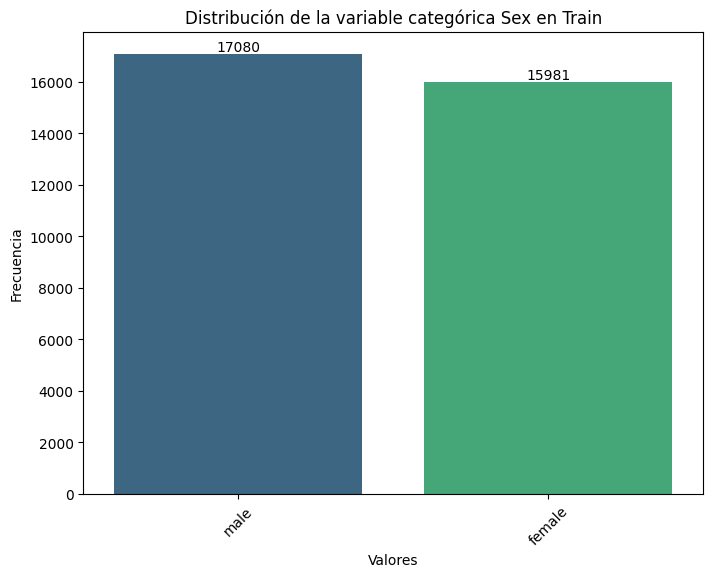

In [22]:
# Obtener conteo de categorías únicas en train
category_counts_train = train['sex'].value_counts()

# Crear una figura con un solo subgráfico
plt.figure(figsize=(8, 6))

# Subgráfico para train
sns.countplot(data=train, x='sex', order=category_counts_train.index, palette='viridis')
plt.xlabel('Valores')
plt.ylabel('Frecuencia')
plt.title('Distribución de la variable categórica Sex en Train')
plt.xticks(rotation=45)

# Agregar etiquetas de conteo en el gráfico de Train
for i, count in enumerate(category_counts_train):
    plt.text(i, count, str(count), ha='center', va='bottom')

plt.show()




Donde observamos que hay un número equilibrado de valores para ambas categorías, con una diferencia con algo más de 1000 valores entre los 33000 registros que hay para el caso de train.

Podemos enfrentar la variable sex con otra variable, por ejemplo la localización del cáncer del melanoma, anatom_site_general_challenge.

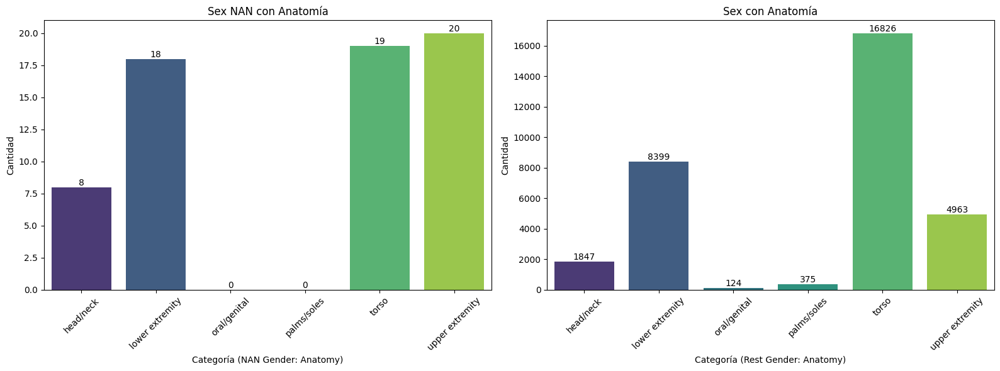


 Hay 65 valores NANs en total, donde 65 son benignos y 0 son malignos.


In [23]:

nan_sex = train[train['sex'].isna() == True]
is_sex = train[train['sex'].isna() == False]

# Calcular la cantidad de valores NaN en 'anatom_site_general_challenge' para nan_sex
nan_sex_counts = nan_sex['anatom_site_general_challenge'].value_counts()

# Calcular la cantidad de valores NaN en 'anatom_site_general_challenge' para is_sex
is_sex_counts = is_sex['anatom_site_general_challenge'].value_counts()
# Crear una figura con dos subgráficos uno al lado del otro
plt.figure(figsize=(16, 6))

# Subgráfico para nan_sex
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.countplot(data=nan_sex, x='anatom_site_general_challenge', palette='viridis')
plt.xlabel('Categoría (NAN Gender: Anatomy)')
plt.ylabel('Cantidad')
plt.title('Sex NAN con Anatomía')
plt.xticks(rotation=45)

# Agregar etiquetas de conteo encima de las barras en nan_sex
for p in ax1.patches:
    ax1.annotate(format(p.get_height(), '.0f'),
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha = 'center', va = 'bottom')

# Subgráfico para is_sex
ax2 = plt.subplot(1, 2, 2)
ax2 = sns.countplot(data=is_sex, x='anatom_site_general_challenge', palette='viridis')
plt.xlabel('Categoría (Rest Gender: Anatomy)')
plt.ylabel('Cantidad')
plt.title('Sex con Anatomía')
plt.xticks(rotation=45)

# Agregar etiquetas de conteo encima de las barras en is_sex
for p in ax2.patches:
    ax2.annotate(format(p.get_height(), '.0f'),
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha = 'center', va = 'bottom')

# Ajustar el espacio entre los subgráficos
plt.tight_layout()

plt.show()

# Chequeo de benignos/malignos.
print('\n Hay 65 valores NANs en total, donde {} son benignos y {} son malignos.'.format(nan_sex['benign_malignant'].value_counts()[0], nan_sex['benign_malignant'].value_counts()[1]))

Todos los valores faltantes son benignos. Para dichos valores faltantes de la variable sex, vemos que se concentran en la extremidad superior (upper extremity), el torso y extremidad inferior (lower extremity).


In [24]:
# Chequeo de cuántos hombres y mujeres hay por la anatomía
anatomy = ['lower extremity', 'upper extremity', 'torso']
train[(train['anatom_site_general_challenge'].isin(anatomy)) & (train['target'] == 0)]['sex'].value_counts()



male      15173
female    14523
Name: sex, dtype: int64

Ahora vamos a comprobar si existiera NANs en el dataframe Test.

In [25]:
# Conteo de NANs en test
conteo_nan_test = test['sex'].isna().sum()

print(f'Hay un total de {conteo_nan_test} en la variable sex del dataframe de test.')

Hay un total de 0 en la variable sex del dataframe de test.


Por tanto, solo vamos a imputar sobre el dataframe de train donde vamos a imputarlo como una categoría más, siendo ésta 'male'. Vamos a usar la función **fillna** para realizar la imputación.

In [26]:
# Llenar los valores faltantes con 'unknown'
train['sex'].fillna('male', inplace=True)


### 3.1.2.- Age_approx


Observamos en el siguiente histograma para la variable edad del dataframe train, que los datos se concentran sobre todo en torno a la edad de 50 años. Esto es normal, ya que el cáncer del melanoma suele tener más presencia en pacientes con dicha edad.

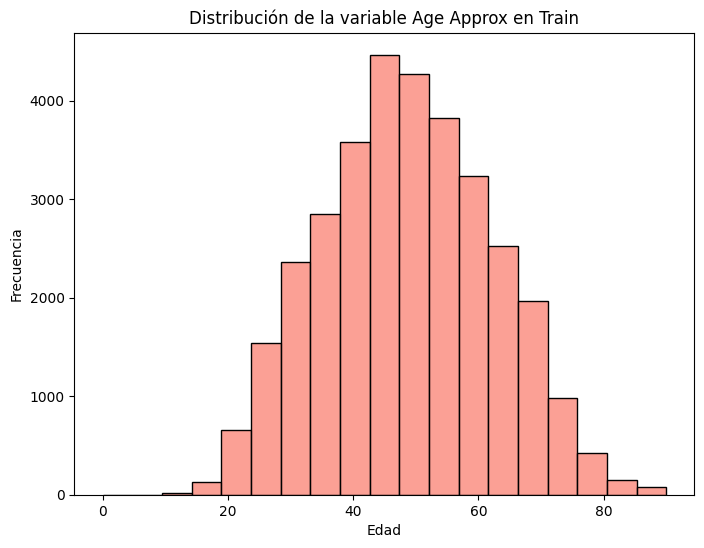

In [27]:
# Histograma de 'age_approx'
plt.figure(figsize=(8, 6))
sns.histplot(train['age_approx'], bins=19, kde=False, color='salmon')
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.title('Distribución de la variable Age Approx en Train')
plt.show()

Vamos a ver los valores NANs de la variable age_approx, y la enfrentamos contra la variable anatom_site_general_challenge para ver como se distribuyen los valores de edad con respecto a dicha variable.

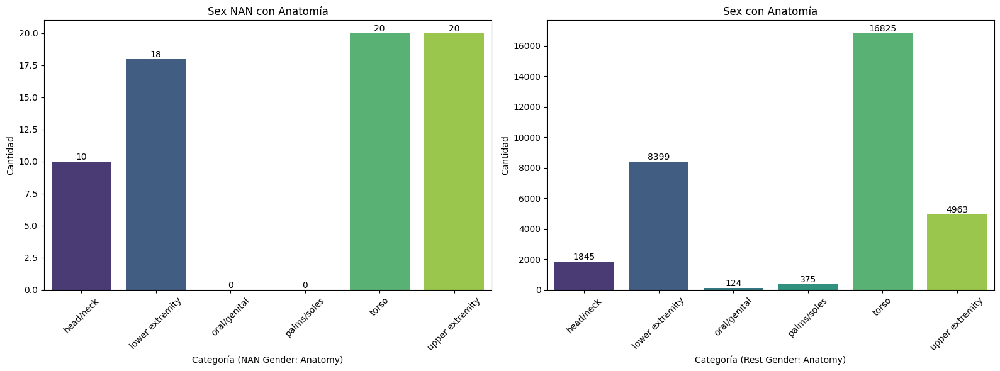


 Hay 68 valores NANs en total, donde 68 son benignos y 0 son malignos.


In [28]:

nan_age_approx = train[train['age_approx'].isna() == True]
is_age_approx = train[train['age_approx'].isna() == False]

# Calcular la cantidad de valores NaN en 'anatom_site_general_challenge' para nan_sex
nan_sex_counts = nan_age_approx['anatom_site_general_challenge'].value_counts()

# Calcular la cantidad de valores NaN en 'anatom_site_general_challenge' para is_sex
is_sex_counts = is_age_approx['anatom_site_general_challenge'].value_counts()
# Crear una figura con dos subgráficos uno al lado del otro
plt.figure(figsize=(16, 6))

# Subgráfico para nan_sex
ax1 = plt.subplot(1, 2, 1)
ax1 = sns.countplot(data=nan_age_approx, x='anatom_site_general_challenge', palette='viridis')
plt.xlabel('Categoría (NAN Gender: Anatomy)')
plt.ylabel('Cantidad')
plt.title('Sex NAN con Anatomía')
plt.xticks(rotation=45)

# Agregar etiquetas de conteo encima de las barras en nan_sex
for p in ax1.patches:
    ax1.annotate(format(p.get_height(), '.0f'),
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha = 'center', va = 'bottom')

# Subgráfico para is_sex
ax2 = plt.subplot(1, 2, 2)
ax2 = sns.countplot(data=is_age_approx, x='anatom_site_general_challenge', palette='viridis')
plt.xlabel('Categoría (Rest Gender: Anatomy)')
plt.ylabel('Cantidad')
plt.title('Sex con Anatomía')
plt.xticks(rotation=45)

# Agregar etiquetas de conteo encima de las barras en is_sex
for p in ax2.patches:
    ax2.annotate(format(p.get_height(), '.0f'),
                 (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha = 'center', va = 'bottom')

# Ajustar el espacio entre los subgráficos
plt.tight_layout()

plt.show()

# Chequeo de benignos/malignos.
print('\n Hay 68 valores NANs en total, donde {} son benignos y {} son malignos.'.format(nan_age_approx['benign_malignant'].value_counts()[0], nan_age_approx['benign_malignant'].value_counts()[1]))

Las distribuciones y valores son muy similares con los valores NANs en la variable sex. Donde más cantidad de NANs se encunetran en las extremidades superiores e inferiores con el torso.

Veamos un descriptivo de la variable edad para ver si podemos imputar los valores NANs con respecto a la media.

In [29]:
train['age_approx'].describe()

count    33058.000000
mean        48.870016
std         14.380360
min          0.000000
25%         40.000000
50%         50.000000
75%         60.000000
max         90.000000
Name: age_approx, dtype: float64

Observamos que la media y la mediana (cuartil 50) son muy similares, 48.8 y 50, respectivamente.

Tenemos que tener en cuenta una cosa, vemos que los valores de edad van de 5 en 5

In [30]:
train['age_approx']

0        45.0
1        45.0
2        50.0
3        45.0
4        55.0
         ... 
33121    50.0
33122    65.0
33123    20.0
33124    50.0
33125    45.0
Name: age_approx, Length: 33126, dtype: float64

Por tanto, vamos a realizar óla imputacin sobre la mediana, con valor 50.

In [31]:
train['age_approx'].fillna(50, inplace = True)

Verificamos que no hay valores NANs en train nuevamente.

In [32]:
train['age_approx'].isna().sum()

0

Por último, nos interesa saber si la variable edad sigue una distribución normal, ya que nos facilita la compresión de los datos y funcionan mucho mejor para los modelos de machine learning.

Por tanto, vemos que la variable sí que sigue una distribución normal.

In [33]:
# Verificar si la variable sigue una distribución normal
stat, p = normaltest(train['age_approx'])
if p < 0.05:
    print("La variable no sigue una distribución normal.")
else:
    print("La variable sigue una distribución normal.")
print(f'\n Tiene un estadístico {stat} y un p valor de {p}')



La variable no sigue una distribución normal.

 Tiene un estadístico 592.0043026003351 y un p valor de 2.804781659134844e-129


### 3.1.3.- anatom_site_general_challenge


Veamos en primer lugar el histograma de dicha variable.

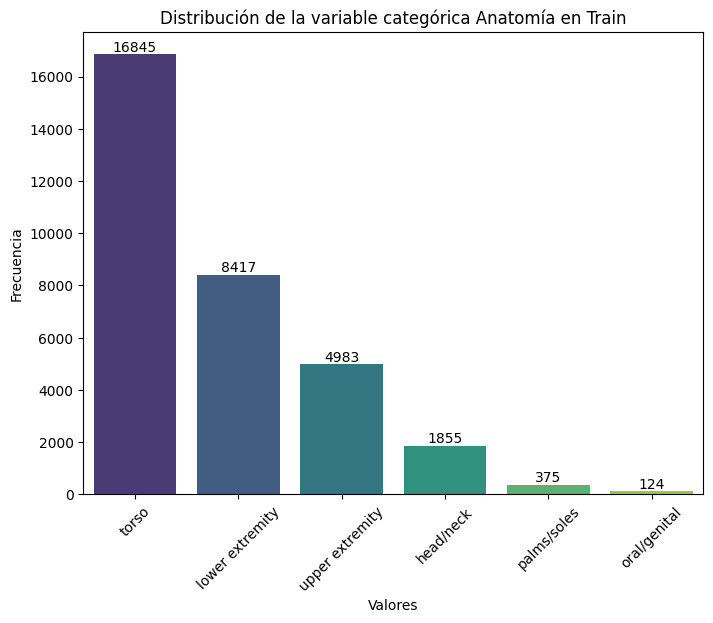

In [34]:
# Obtener conteo de categorías únicas en train
category_counts_train = train['anatom_site_general_challenge'].value_counts()

# Crear una figura con un solo subgráfico
plt.figure(figsize=(8, 6))

# Subgráfico para train
sns.countplot(data=train, x='anatom_site_general_challenge', order=category_counts_train.index, palette='viridis')
plt.xlabel('Valores')
plt.ylabel('Frecuencia')
plt.title('Distribución de la variable categórica Anatomía en Train')
plt.xticks(rotation=45)

# Agregar etiquetas de conteo en el gráfico de Train
for i, count in enumerate(category_counts_train):
    plt.text(i, count, str(count), ha='center', va='bottom')

plt.show()


En primer lugar, debemos tener en cuenta que entre los datos que faltan hay 9 casos malignos, por lo que debemos tratar la imputación por separado tanto para los benignos como para los malignos.

En términos de edad y género, tanto los datos faltantes como los no faltantes parecen comportarse más o menos de la misma manera.

Hay un total de 527, donde de todos los valores missing, 518 son benignos y 9 son malignos.




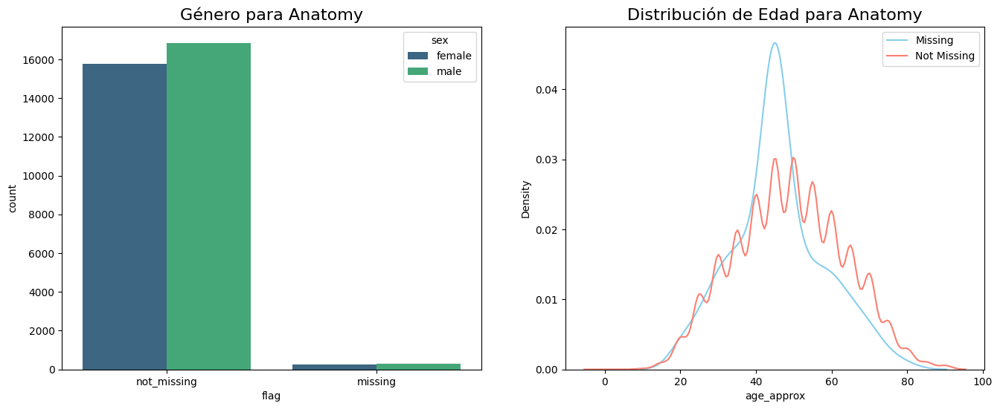

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear una copia del DataFrame train
anatomy = train.copy()

# Crear una columna 'flag' que indique si 'anatom_site_general_challenge' es missing o not_missing
anatomy['flag'] = np.where(anatomy['anatom_site_general_challenge'].isna(), 'missing', 'not_missing')

# Crear una figura con dos subgráficos uno al lado del otro
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Gráfico de barras para mostrar la distribución de género ('sex') en función de 'flag'
sns.countplot(data=anatomy, x='flag', hue='sex', ax=ax1, palette='viridis')

# Gráfico de líneas para mostrar la distribución de edades ('age') para 'missing' y 'not_missing'
sns.kdeplot(data=anatomy[anatomy['flag'] == 'missing']['age_approx'], color='skyblue', label='Missing')
sns.kdeplot(data=anatomy[anatomy['flag'] == 'not_missing']['age_approx'], color='salmon', label='Not Missing')

# Títulos de los subgráficos
ax1.set_title('Género para Anatomy', fontsize=16)
ax2.set_title('Distribución de Edad para Anatomy', fontsize=16)

# Cálculo de benignos y malignos para missing
nans = anatomy[anatomy['flag'] == 'missing'].shape[0]
ben_mal = anatomy[anatomy['flag'] == 'missing']['benign_malignant'].value_counts()
print('Hay un total de {}, donde de todos los valores missing, {} son benignos y {} son malignos.'.format(nans, ben_mal['benign'], ben_mal['malignant']))
print("\n")
# Mostrar la leyenda en el segundo subgráfico
ax2.legend()

plt.show()


Donde observamos que la mayor cantidad de NANs para el sexo es el masculino y para la edad es sobre 50 años.

Sin embargo, la anatomía más frecuente tanto para benignos como para malignos es el torso con un total de 16845, por lo que imputaremos este valor.

In [36]:
anatomy.groupby(['benign_malignant', 'anatom_site_general_challenge']).size()

benign_malignant  anatom_site_general_challenge
benign            head/neck                         1781
                  lower extremity                   8293
                  oral/genital                       120
                  palms/soles                        370
                  torso                            16588
                  upper extremity                   4872
malignant         head/neck                           74
                  lower extremity                    124
                  oral/genital                         4
                  palms/soles                          5
                  torso                              257
                  upper extremity                    111
dtype: int64

### 3.1.4.- Diagnosis

Esta variable no la vamos a utilizar para el modelo debido a que no aparece en el conjunto Test para predecir. Si que es cierto, que podemos realizar un análisis para ver como es la variable

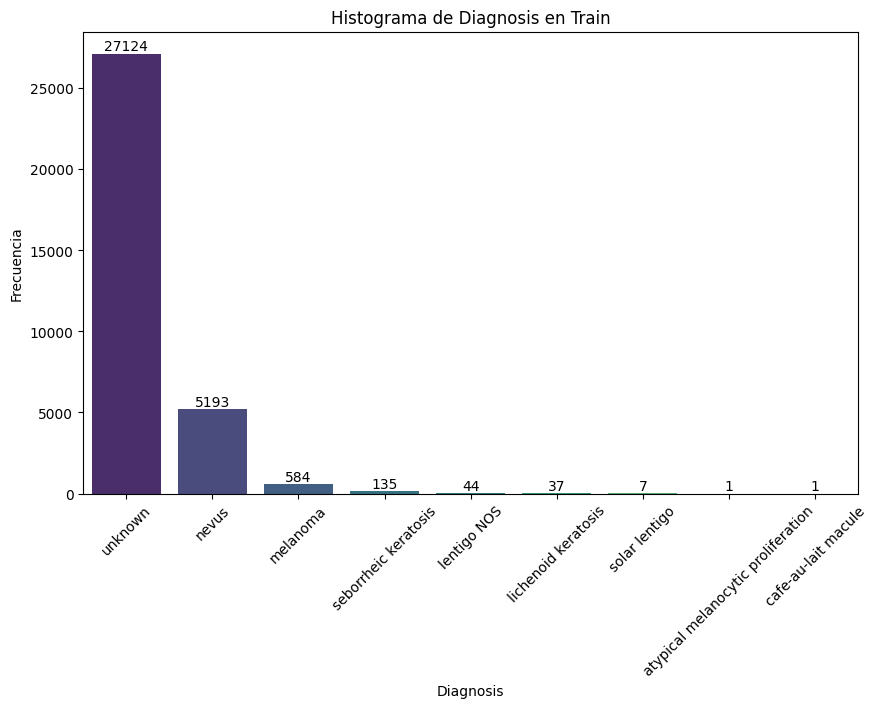

In [37]:
# Obtener el conteo de cada categoría en 'diagnosis' y ordenar de mayor a menor
diagnosis_counts = train['diagnosis'].value_counts().sort_values(ascending=False)

# Crear el histograma
plt.figure(figsize=(10, 6))
ax = sns.countplot(data=train, x='diagnosis', order=diagnosis_counts.index, palette='viridis')

# Configurar etiquetas y título
plt.xlabel('Diagnosis')
plt.ylabel('Frecuencia')
plt.title('Histograma de Diagnosis en Train')

# Rotar etiquetas en el eje x para mayor claridad
plt.xticks(rotation=45)

# Agregar etiquetas de conteo en el gráfico (valores enteros)
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='bottom')

# Mostrar el histograma
plt.show()


Donde observamos que la mayor cantidad se encuentra en un diagnostico desconocido, seguido de nevus que son los lunares y luego el melanoma, el cáncer.

Veamos una tabla de contingencia

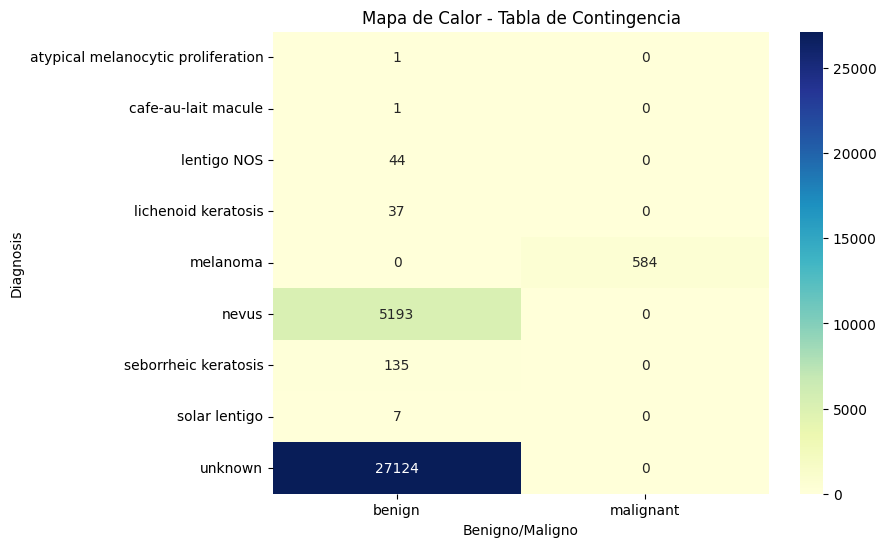

In [38]:
# Crear una tabla de contingencia
contingency_table = pd.crosstab(train["diagnosis"], train["benign_malignant"])

# Crear un mapa de calor con Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(contingency_table, annot=True, cmap='YlGnBu', fmt="d")
plt.title("Mapa de Calor - Tabla de Contingencia")
plt.xlabel("Benigno/Maligno")
plt.ylabel("Diagnosis")
plt.show()

Donde observamos que todos los valores malignos corresponden a la diagnosis de melanoma. Por otro lado, los valores benignos para todos los valores de diagnosis que no son melanoma, por tanto, está bien asignado dicha variable.

### 3.1.5.- Benign_malignant y Target

Las dos variables interpretan el mismo objetivo, nos dice si el paciente tiene el cáncer o no. Veamos la tabla de contingencia para comprobar que efectivamente ambos valores de cada par de variables son el mismo.

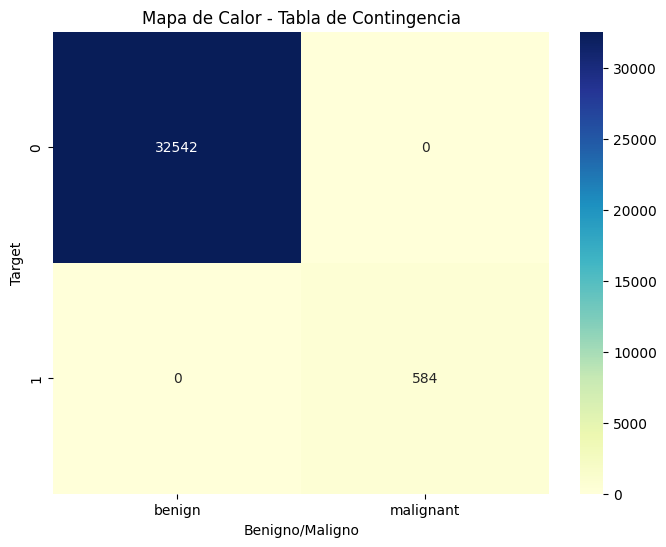

In [39]:
# Crear una tabla de contingencia
contingency_table = pd.crosstab(train['target'], train['benign_malignant'])

# Crear un mapa de calor con Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(contingency_table, annot=True, cmap='YlGnBu', fmt="d")
plt.title("Mapa de Calor - Tabla de Contingencia")
plt.xlabel("Benigno/Maligno")
plt.ylabel("Target")
plt.show()


Y vemos que efectivamente sí, donde para Target con valor 0 le corresponde el benigno. Por otro lado, para el valor 1 como el maligno, cáncer del melanoma.

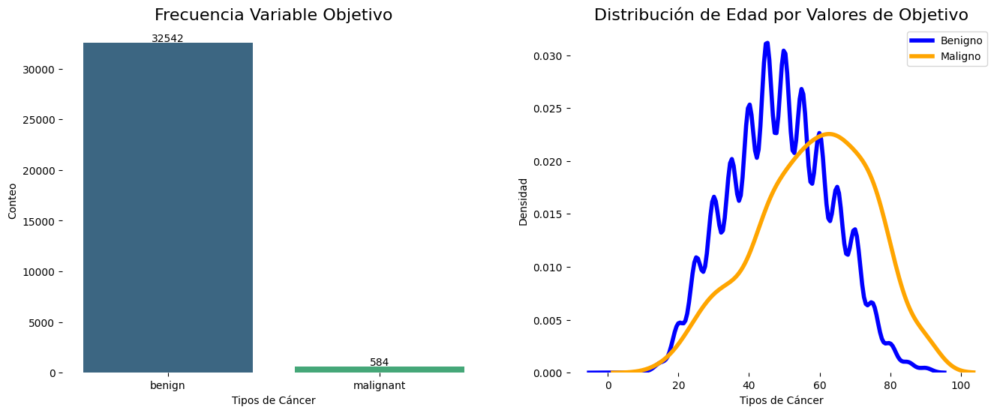

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define un nuevo color (por ejemplo, 'purple')
new_color = 'purple'

# Figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Gráfico de barras para 'benign_malignant' con el nuevo color
a = sns.countplot(data=train, x='benign_malignant', palette='viridis', ax=ax1)
# Agregar etiquetas de número de valores
for p in a.patches:
    a.annotate(format(int(p.get_height())),
               (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center',
               xytext=(0, 4), textcoords='offset points')
ax1.set_title('Frecuencia Variable Objetivo', fontsize=16)
ax1.set_ylabel("Conteo")
ax1.set_xlabel("Tipos de Cáncer")
# Gráfico de densidad para 'age_approx' con el nuevo color
sns.kdeplot(data=train[train['target'] == 0]['age_approx'], ax=ax2, color='blue',
            label='Benigno', linewidth=4)
sns.kdeplot(data=train[train['target'] == 1]['age_approx'], ax=ax2, color='orange',
            label='Maligno', linewidth=4)
ax2.set_title('Distribución de Edad por Valores de Objetivo', fontsize=16)
ax2.set_ylabel("Densidad")
ax2.set_xlabel("Tipos de Cáncer")
ax2.legend()
sns.despine(left=True, bottom=True)

plt.show()




Primeramente observamos el gran desbalanceo de datos, donde tenemos 584 malignos frente a los 32542 beningnos. Por otra parte, la distribución edad parece ser normal para los benignos, sin embargo, los malignos está un poco sesgado hacia la derecha, con el pico orientado hacia valores de edad más altos.

Observamos que no hay valores NANs en la variable Target.

In [41]:
nan = train['target'].isnull().sum()

print(f'Hay un total de {nan} en la variable objetivo.')

Hay un total de 0 en la variable objetivo.


Vamos a ver ahora la variable Targer frene al género de los pacientes, dividiéndolo en benignos y malignos.

Text(0, 0.5, 'Conteo')

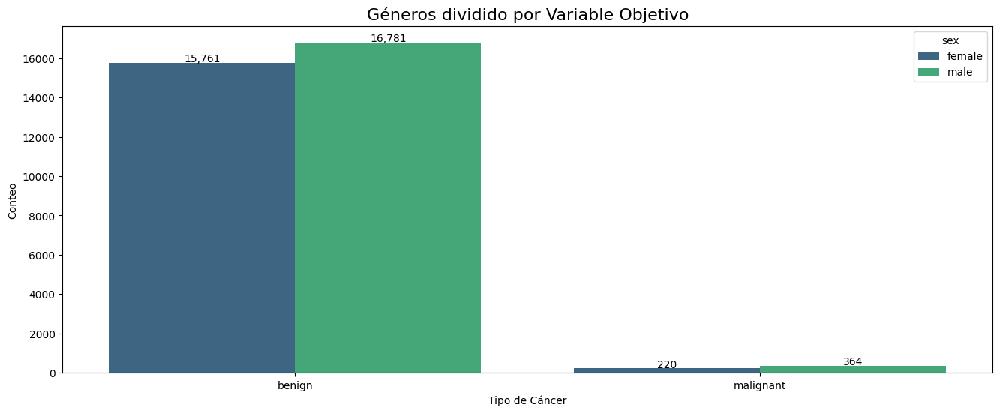

In [42]:
plt.figure(figsize=(16, 6))
a = sns.countplot(data=train, x='benign_malignant', hue='sex', palette='viridis')

for p in a.patches:
    a.annotate(format(int(p.get_height()), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

plt.title('Géneros dividido por Variable Objetivo', fontsize=16)
plt.xlabel("Tipo de Cáncer")
plt.ylabel("Conteo")


Observamos que hay más pacientes masculinos que femenimos en ambos casos de la variable objetivo.

Ahora veamos frente a la localización del melanomna

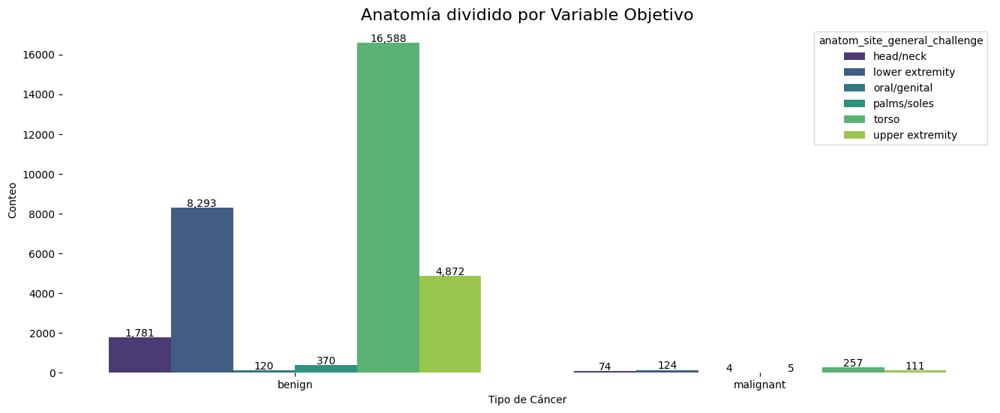

In [43]:
plt.figure(figsize=(16, 6))
a = sns.countplot(data=train, x='benign_malignant', hue='anatom_site_general_challenge', palette='viridis')

for p in a.patches:
    a.annotate(format(int(p.get_height()), ','),
           (p.get_x() + p.get_width() / 2.,
            p.get_height()), ha = 'center', va = 'center',
           xytext = (0, 4), textcoords = 'offset points')

plt.title('Anatomía dividido por Variable Objetivo', fontsize=16)
plt.xlabel("Tipo de Cáncer")
plt.ylabel("Conteo")
sns.despine(left=True, bottom=True);

Observamos que la mayor cantidad se encuentra en el torso, tanto para los malignos como benignos. Vemos también que las distribuciones son las mismas, teniendo la misma cantidad de valores de la localización del melanoma tanto para los casos malignos como benignos.

### 3.1.6 Análisis Test

Vamos a ver las distribuciones del conjunto Test.

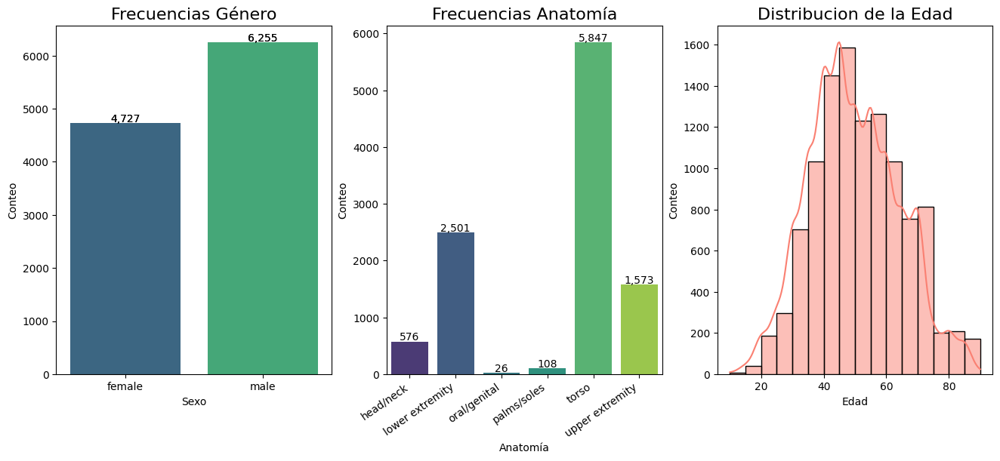

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# Figure
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))

# Gráfico de barras para 'sex' con paleta 'viridis'
a = sns.countplot(data=test, x='sex', palette='viridis', ax=ax1)

# Cambiar los colores de las barras manualmente
bar_colors = sns.color_palette('viridis', len(test['sex'].unique()))
a = sns.countplot(data=test, x='sex', ax=ax1, palette=bar_colors)

b = sns.countplot(data=test, x='anatom_site_general_challenge', ax=ax2, palette='viridis')
c = sns.histplot(data=test, x='age_approx', color='salmon', ax=ax3, kde=True, bins=16)

for p in a.patches:
    a.annotate(format(int(p.get_height()), ','),
               (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center',
               xytext=(0, 4), textcoords='offset points')

for p in b.patches:
    b.annotate(format(int(p.get_height()), ','),
               (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center',
               xytext=(0, 4), textcoords='offset points')

b.set_xticklabels(b.get_xticklabels(), rotation=35, ha="right")

ax1.set_title('Frecuencias Género', fontsize=16)
ax1.set_xlabel("Sexo")
ax1.set_ylabel("Conteo")

ax2.set_title('Frecuencias Anatomía', fontsize=16)
ax2.set_xlabel("Anatomía")
ax2.set_ylabel("Conteo")

ax3.set_title('Distribucion de la Edad', fontsize=16)
ax3.set_xlabel("Edad")
ax3.set_ylabel("Conteo")

plt.show()


En las tres gráficas anteriores, vemos las distribuciones del género, anatomía y edad de los pacientes en el conjunto de datos test. De la misma forma que en el entrenamiento, sigue destacando que los hombres y el torso son los valores más predominantes en sus categorías.

De la misma manera, la edad también tiene una distribución parecida donde se concentra la mayoría de los pacientes en una edad en torno a 50 años. Además, para la edad, probamos si su variable sigue una distribución, donde igual que en el train no lo es con un p-valor de 1.94e-39.

In [45]:
# Verificar si la variable sigue una distribución normal
stat, p = normaltest(test['age_approx'])
if p < 0.05:
    print("La variable no sigue una distribución normal.")
else:
    print("La variable sigue una distribución normal.")
print(f'\n Tiene un estadístico {stat} y un p valor de {p}')


La variable no sigue una distribución normal.

 Tiene un estadístico 178.27354187377603 y un p valor de 1.942639644778791e-39


### 3.1.7 Transformaciones para el Modelo


Vamos a realizar una transformación de los valores que tiene la variable **sex** en una categoría numérica, para que sea mejor interpretado por el modelo de machine learning.

Para ello, vamos a realizar la siguiente conversión:

- male: 0
- female: 1
- unknown: 2

Lo realizamos tanto para el Train como Test

In [46]:
mapeo = {'male': 0, 'female': 1}

train['sex'] = train['sex'].map(mapeo)
test['sex'] = test['sex'].map(mapeo)

train.head()

,image_name,patient_id,sex,age_approx,anatom_site_general_challenge,diagnosis,benign_malignant,target
0,ISIC_2637011,IP_7279968,0,45.0,head/neck,unknown,benign,0
1,ISIC_0015719,IP_3075186,1,45.0,upper extremity,unknown,benign,0
2,ISIC_0052212,IP_2842074,1,50.0,lower extremity,nevus,benign,0
3,ISIC_0068279,IP_6890425,1,45.0,head/neck,unknown,benign,0
4,ISIC_0074268,IP_8723313,1,55.0,upper extremity,unknown,benign,0


Realizamos ahora la imputación de los valores nulos de la anatomía sobre el valor torso.

In [47]:
train['anatom_site_general_challenge'].fillna('torso', inplace = True)
test['anatom_site_general_challenge'].fillna('torso', inplace = True)

Ademas, realizamos la transforamción para **anatom_site_general_challenge**. Vamos a convertir esta variable a dummie, usando el siguiente código. Usamos un prefijo llamado "zona", ya que trata de la localización del melanoma.


Lo realizamos tanto para el Train como el Test.

In [48]:
concat = pd.concat([train['anatom_site_general_challenge'], test['anatom_site_general_challenge']], ignore_index=True)
dummies = pd.get_dummies(concat, dummy_na=True, dtype=np.uint8, prefix='zona')

train = pd.concat([train, dummies.iloc[:train.shape[0]]], axis=1)
test = pd.concat([test, dummies.iloc[train.shape[0]:].reset_index(drop=True)], axis=1)


Mostramos la cabecera de los datos para ver las variables dummies generadas. La variable antigua de anatom_site_general_challenge la eliminamos de ambos dataframes.

In [49]:
train.drop('anatom_site_general_challenge', axis = 1, inplace = True)
test.drop('anatom_site_general_challenge', axis = 1, inplace = True)

train.head()

,image_name,patient_id,sex,age_approx,diagnosis,benign_malignant,target,zona_head/neck,zona_lower extremity,zona_oral/genital,zona_palms/soles,zona_torso,zona_upper extremity,zona_nan
0,ISIC_2637011,IP_7279968,0,45.0,unknown,benign,0,1,0,0,0,0,0,0
1,ISIC_0015719,IP_3075186,1,45.0,unknown,benign,0,0,0,0,0,0,1,0
2,ISIC_0052212,IP_2842074,1,50.0,nevus,benign,0,0,1,0,0,0,0,0
3,ISIC_0068279,IP_6890425,1,45.0,unknown,benign,0,1,0,0,0,0,0,0
4,ISIC_0074268,IP_8723313,1,55.0,unknown,benign,0,0,0,0,0,0,1,0


## 3.2.- Imágenes

En este apartado vamos a realizar una visualización de las imágenes guardadas en los archivos .tfrec en Google Storage de GCP. Veamos la dimensión que tienen las imágenes.



In [11]:

# Ruta al archivo TFRecord
archivo_tfred = 'gs://manu-ucmbucket/DataKaggleTFM/train00-2071.tfrec'

# Función para obtener la dimensión de una imagen decodificada
def get_image_dimension(encoded_image):
    image = tf.image.decode_image(encoded_image, channels=3)  # Cambia channels según tus imágenes
    return image.shape[0], image.shape[1]

# Cargar el primer registro del archivo TFRecord
raw_record = next(iter(tf.data.TFRecordDataset(archivo_tfred)))

example = tf.train.Example()
example.ParseFromString(raw_record.numpy())

image_encoded = example.features.feature['image'].bytes_list.value[0]
image_height, image_width = get_image_dimension(image_encoded)

print(f"Dimensiones de la imagen: Altura = {image_height}, Ancho = {image_width}")

Dimensiones de la imagen: Altura = 1024, Ancho = 1024


Donde vemos que la dimesión es de **1024 x 1024 px**. Esto es una dimensión bastante grande y que puede ser perjudical para el modelo de deep learning. Es por ello, que vamos a realizar un preprocesado de las imágenes convirtiéndolas a una dimensión de **256 x 256 px** para que podamos utilizar de una forma más eficiente las imágenes.

Es por ello, que realizamos el siguiente código para la conversión de las imágenes.

Cabe destacar que, se realizará una conexión a GCP con Cloud Storage, se realizará la conversión de los archivos tfrec uno a uno, donde mostraremos una barra de progreso gracias a la librería **tqdm**.

Por último, lo subimos a una nueva carpeta dentro del bucket llamada **DatasetKaggleTFM_resized** y donde eliminaremos los antiguos archivos de la ruta de DataKaggleTFM así como de Google Colab con ruta **/content/DatasetMelanoma**.

El nombre de los archivos .tfrec serán los mismos.

In [12]:
# FUNCIONA PARA CONVERTIR DE 1024 A 256
# Configuración de GCP

os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "/content/plucky-bulwark-387218-f84be5255719.json"
bucket_name = "manu-ucmbucket"
ruta_local = '/content/DatasetMelanoma'
ruta_final = 'DatasetKaggleTFM_resized/'
archivos_locales = os.listdir(ruta_local)

# Función para redimensionar una imagen usando PIL
def resize_image(image, new_size):
    pil_image = Image.fromarray(image.numpy())
    resized_image = pil_image.resize(new_size)
    return resized_image

# Crear un cliente de GCP Storage
client = storage.Client()
bucket = client.get_bucket(bucket_name)

# Lista de archivos locales
archivos_locales = os.listdir(ruta_local)

for archivo in tqdm(archivos_locales, desc="Processing TFRecord files"):

    if archivo.endswith(".tfrec"):  # Verifica si el archivo termina en .tfrec
        ruta_archivo_local = os.path.join(ruta_local, archivo)
        ruta_gcs = f'gs://manu-ucmbucket/DataKaggleTFM/{archivo}'

        with tf.io.TFRecordWriter(archivo) as writer:
            for raw_record in tf.data.TFRecordDataset(ruta_gcs):
                example = tf.train.Example()
                example.ParseFromString(raw_record.numpy())

                image_encoded = example.features.feature['image'].bytes_list.value[0]
                image = tf.image.decode_image(image_encoded, channels=3)

                # Redimensionar la imagen
                new_size = (256, 256)
                resized_image = resize_image(image, new_size)

                # Convertir la imagen redimensionada a JPEG
                resized_image_jpeg = tf.image.encode_jpeg(tf.convert_to_tensor(resized_image))

                # Crear un nuevo ejemplo con la imagen redimensionada
                new_example = tf.train.Example(features=tf.train.Features(feature={
                    'image': tf.train.Feature(bytes_list=tf.train.BytesList(value=[resized_image_jpeg.numpy()])),
                    'image_name': example.features.feature['image_name'],
                    'target': example.features.feature['target']
                }))

                # Escribir el nuevo ejemplo en el archivo TFRecord
                writer.write(new_example.SerializeToString())

        ruta_archivo_bucket = f'DatasetKaggleTFM_resized/{archivo}'
        blob = bucket.blob(ruta_archivo_bucket)
        blob.upload_from_filename(archivo)
        print(f"Archivo {archivo} subido a {ruta_archivo_bucket} en el bucket.")
        os.remove(archivo)
    else:
        print(f"El archivo {archivo} no tiene la extensión .tfrec, se omitirá.")


Processing TFRecord files:   0%|          | 0/34 [00:00<?, ?it/s]Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:   3%|▎         | 1/34 [01:51<1:01:22, 111.58s/it]

Archivo train05-2071.tfrec subido a DatasetKaggleTFM_resized/train05-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:   6%|▌         | 2/34 [02:30<36:44, 68.88s/it]   

Archivo test09-687.tfrec subido a DatasetKaggleTFM_resized/test09-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:   9%|▉         | 3/34 [04:20<45:20, 87.77s/it]

Archivo train15-2061.tfrec subido a DatasetKaggleTFM_resized/train15-2061.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  12%|█▏        | 4/34 [06:11<48:26, 96.88s/it]

Archivo train14-2071.tfrec subido a DatasetKaggleTFM_resized/train14-2071.tfrec en el bucket.
El archivo test.csv no tiene la extensión .tfrec, se omitirá.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  18%|█▊        | 6/34 [07:48<33:15, 71.27s/it]

Archivo train00-2071.tfrec subido a DatasetKaggleTFM_resized/train00-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  21%|██        | 7/34 [08:26<27:57, 62.12s/it]

Archivo test03-687.tfrec subido a DatasetKaggleTFM_resized/test03-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  24%|██▎       | 8/34 [10:13<32:24, 74.80s/it]

Archivo train08-2071.tfrec subido a DatasetKaggleTFM_resized/train08-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  26%|██▋       | 9/34 [10:52<26:52, 64.49s/it]

Archivo test07-687.tfrec subido a DatasetKaggleTFM_resized/test07-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  29%|██▉       | 10/34 [12:41<30:56, 77.37s/it]

Archivo train10-2071.tfrec subido a DatasetKaggleTFM_resized/train10-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  32%|███▏      | 11/34 [13:19<25:16, 65.95s/it]

Archivo test00-687.tfrec subido a DatasetKaggleTFM_resized/test00-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  35%|███▌      | 12/34 [13:58<21:12, 57.84s/it]

Archivo test08-687.tfrec subido a DatasetKaggleTFM_resized/test08-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  38%|███▊      | 13/34 [14:36<18:12, 52.04s/it]

Archivo test15-677.tfrec subido a DatasetKaggleTFM_resized/test15-677.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  41%|████      | 14/34 [15:15<15:59, 47.97s/it]

Archivo test06-687.tfrec subido a DatasetKaggleTFM_resized/test06-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  44%|████▍     | 15/34 [15:53<14:17, 45.11s/it]

Archivo test12-687.tfrec subido a DatasetKaggleTFM_resized/test12-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  47%|████▋     | 16/34 [16:31<12:51, 42.84s/it]

Archivo test02-687.tfrec subido a DatasetKaggleTFM_resized/test02-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  50%|█████     | 17/34 [18:20<17:46, 62.76s/it]

Archivo train02-2071.tfrec subido a DatasetKaggleTFM_resized/train02-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  53%|█████▎    | 18/34 [18:58<14:44, 55.27s/it]

Archivo test04-687.tfrec subido a DatasetKaggleTFM_resized/test04-687.tfrec en el bucket.
El archivo train.csv no tiene la extensión .tfrec, se omitirá.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  59%|█████▉    | 20/34 [19:35<08:58, 38.47s/it]

Archivo test01-687.tfrec subido a DatasetKaggleTFM_resized/test01-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  62%|██████▏   | 21/34 [21:27<12:14, 56.53s/it]

Archivo train06-2071.tfrec subido a DatasetKaggleTFM_resized/train06-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  65%|██████▍   | 22/34 [23:15<13:59, 70.00s/it]

Archivo train09-2071.tfrec subido a DatasetKaggleTFM_resized/train09-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  68%|██████▊   | 23/34 [25:03<14:44, 80.37s/it]

Archivo train03-2071.tfrec subido a DatasetKaggleTFM_resized/train03-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  71%|███████   | 24/34 [26:52<14:44, 88.50s/it]

Archivo train04-2071.tfrec subido a DatasetKaggleTFM_resized/train04-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  74%|███████▎  | 25/34 [27:32<11:10, 74.54s/it]

Archivo test10-687.tfrec subido a DatasetKaggleTFM_resized/test10-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  76%|███████▋  | 26/34 [29:21<11:15, 84.48s/it]

Archivo train12-2071.tfrec subido a DatasetKaggleTFM_resized/train12-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  79%|███████▉  | 27/34 [29:59<08:16, 70.93s/it]

Archivo test11-687.tfrec subido a DatasetKaggleTFM_resized/test11-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  82%|████████▏ | 28/34 [31:50<08:16, 82.75s/it]

Archivo train07-2071.tfrec subido a DatasetKaggleTFM_resized/train07-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  85%|████████▌ | 29/34 [33:37<07:30, 90.06s/it]

Archivo train01-2071.tfrec subido a DatasetKaggleTFM_resized/train01-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  88%|████████▊ | 30/34 [34:15<04:57, 74.49s/it]

Archivo test14-687.tfrec subido a DatasetKaggleTFM_resized/test14-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  91%|█████████ | 31/34 [34:53<03:10, 63.49s/it]

Archivo test13-687.tfrec subido a DatasetKaggleTFM_resized/test13-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  94%|█████████▍| 32/34 [35:31<01:51, 55.82s/it]

Archivo test05-687.tfrec subido a DatasetKaggleTFM_resized/test05-687.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files:  97%|█████████▋| 33/34 [37:22<01:12, 72.37s/it]

Archivo train11-2071.tfrec subido a DatasetKaggleTFM_resized/train11-2071.tfrec en el bucket.


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence
Processing TFRecord files: 100%|██████████| 34/34 [39:10<00:00, 69.13s/it]

Archivo train13-2071.tfrec subido a DatasetKaggleTFM_resized/train13-2071.tfrec en el bucket.


Verificamos con el código anterior, que las imágenes se han convertido a una dimensión de **256 x 256 px**

In [13]:

# Ruta al archivo TFRecord
archivo_tfred = 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train10-2071.tfrec'

# Función para obtener la dimensión de una imagen decodificada
def get_image_dimension(encoded_image):
    image = tf.image.decode_image(encoded_image, channels=3)  # Cambia channels según tus imágenes
    return image.shape[0], image.shape[1]

# Cargar el primer registro del archivo TFRecord
raw_record = next(iter(tf.data.TFRecordDataset(archivo_tfred)))

example = tf.train.Example()
example.ParseFromString(raw_record.numpy())

image_encoded = example.features.feature['image'].bytes_list.value[0]
image_height, image_width = get_image_dimension(image_encoded)

print(f"Dimensiones de la imagen: Altura = {image_height}, Ancho = {image_width}")

Dimensiones de la imagen: Altura = 256, Ancho = 256


Donde podemos comporbar que efectivamente se ha realizado el redmensionamiento de las imágenes.

Mostramos ahora imágenes de tanto de cáncer benignos y malignos (melanoma).


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence


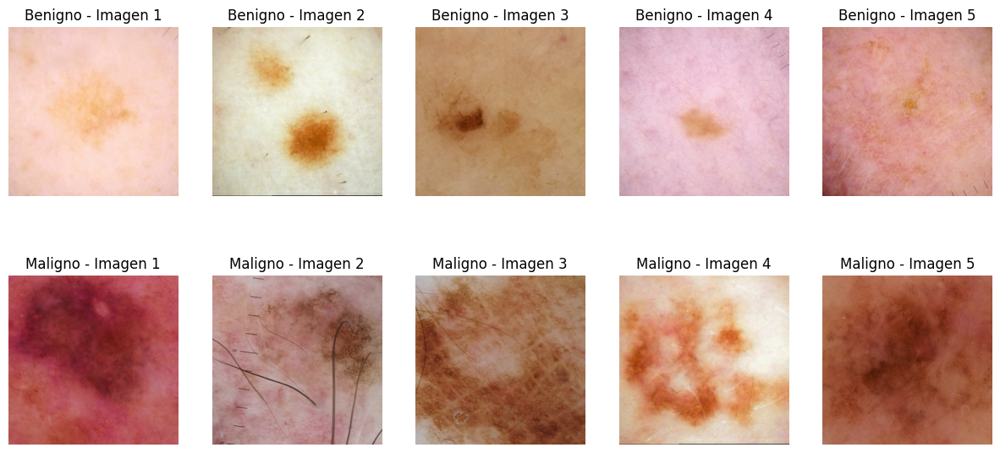

In [30]:
def decode_example(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.int64),
    }
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, [256, 256])  # Ajusta el tamaño según tus necesidades
    label = tf.cast(example['target'], tf.int32)
    return image, label

# Ruta del archivo .tfrec
tfrec_path = "gs://manu-ucmbucket/DatasetKaggleTFM_resized/train06-2071.tfrec"

# Mostrar 5 imágenes con target = 0 (benigno) y 5 imágenes con target = 1 (maligno)
num_images_to_read = 10
dataset = tf.data.TFRecordDataset(tfrec_path, num_parallel_reads=AUTO)

# Aplica la función de decodificación y filtra por target
dataset = dataset.map(decode_example, num_parallel_calls=AUTO)
dataset = dataset.filter(lambda image, label: label == 0 or label == 1)

# Crea dos listas para almacenar las imágenes según el target
images_target_0 = []
images_target_1 = []

for image, label in dataset:
    if label == 0 and len(images_target_0) < 5:
        images_target_0.append(image)
    elif label == 1 and len(images_target_1) < 5:
        images_target_1.append(image)

# Muestra las imágenes en dos filas (benigno y maligno)
plt.figure(figsize=(15, 7))
for i, image in enumerate(images_target_0):
    plt.subplot(2, 5, i + 1)
    plt.title(f"Benigno - Imagen {i + 1}")
    plt.imshow(image.numpy())
    plt.axis('off')

for i, image in enumerate(images_target_1):
    plt.subplot(2, 5, 5 + i + 1)
    plt.title(f"Maligno - Imagen {i + 1}")
    plt.imshow(image.numpy())
    plt.axis('off')

plt.show()


Por otra parte, cuando realicemos la lectura de la imagenes desde los archivos tfrec, realizaremos una normalización en los pixeles y un data augmentation a las imágenes obtenidas.

Con ello, podemos mejorar el modelo de aprendizaje profundo a la hora de predecir el cáncer del melanoma.

Con el siguiente código podemos ver la diferencia cuando se aplica estas dos técnicas, a la derecha, y cuando no, a la izquierda.

In [14]:
IMAGE_SIZE = [256, 256]
def data_augment(image):
    original_image = image

    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_hue(image, 0.01)
    image = tf.image.random_saturation(image, 0.7, 1.3)
    image = tf.image.random_contrast(image, 0.8, 1.2)
    image = tf.image.random_brightness(image, 0.2)
    return image

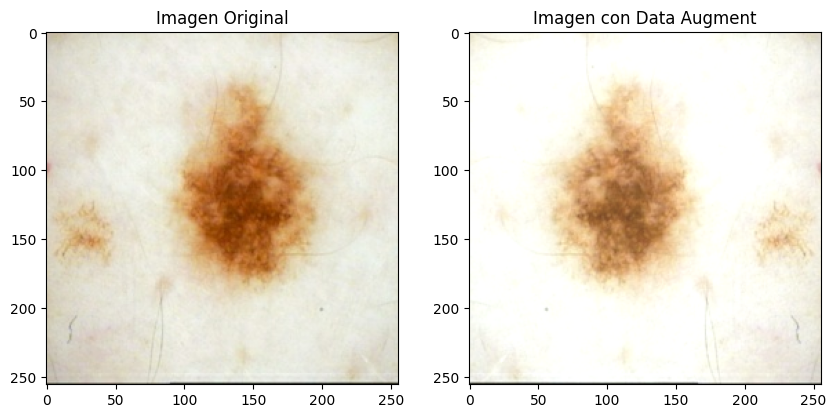

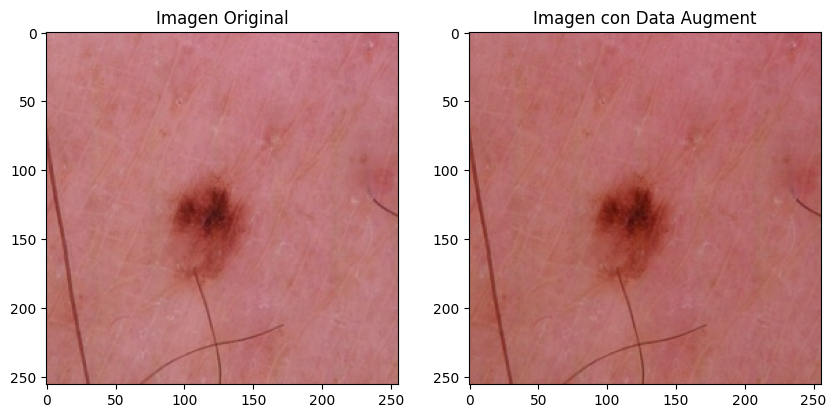

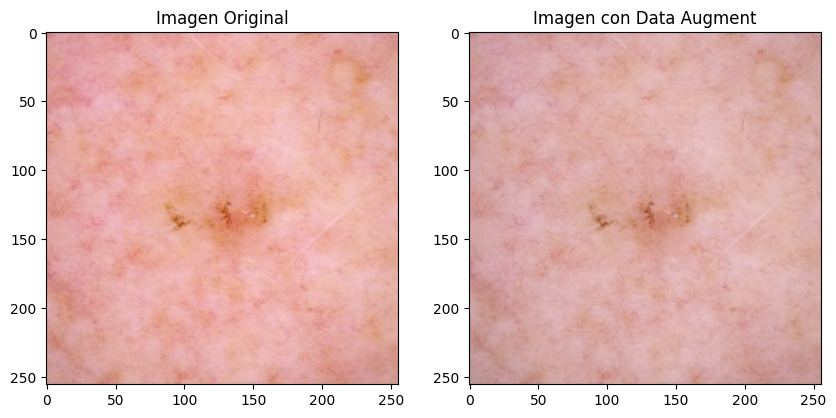

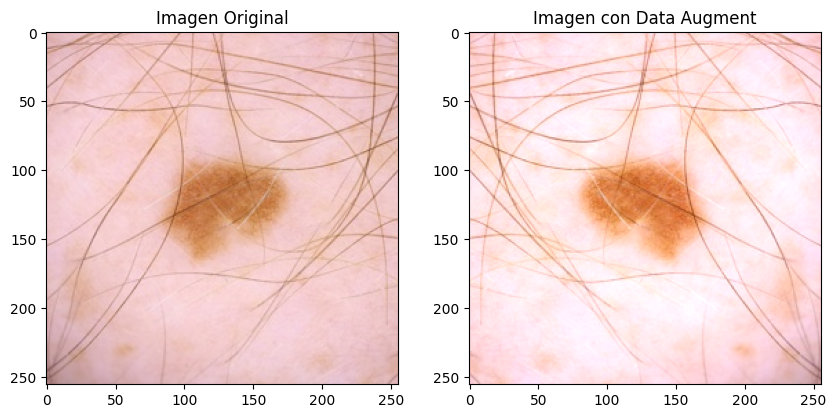

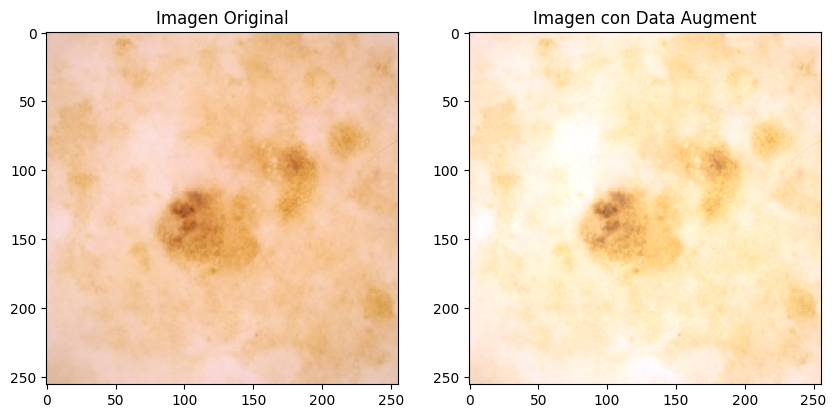

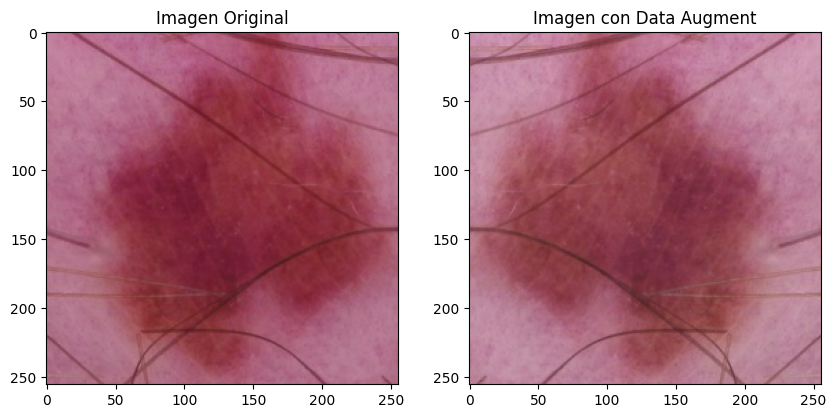

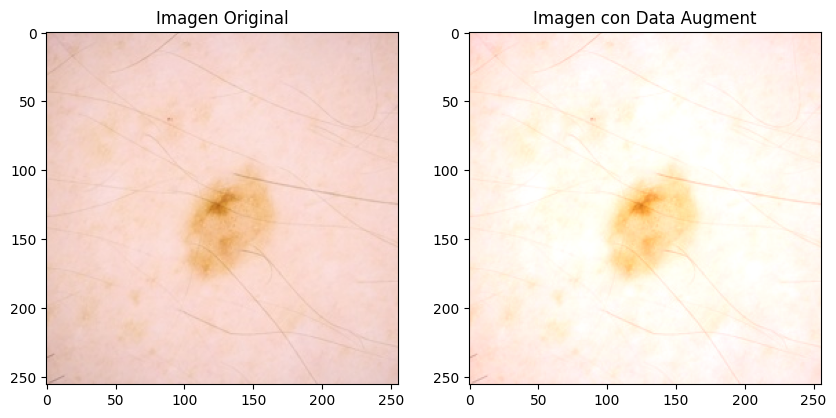

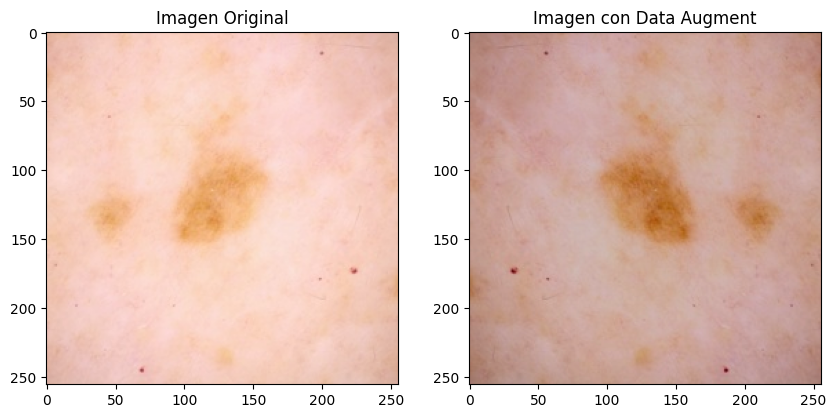

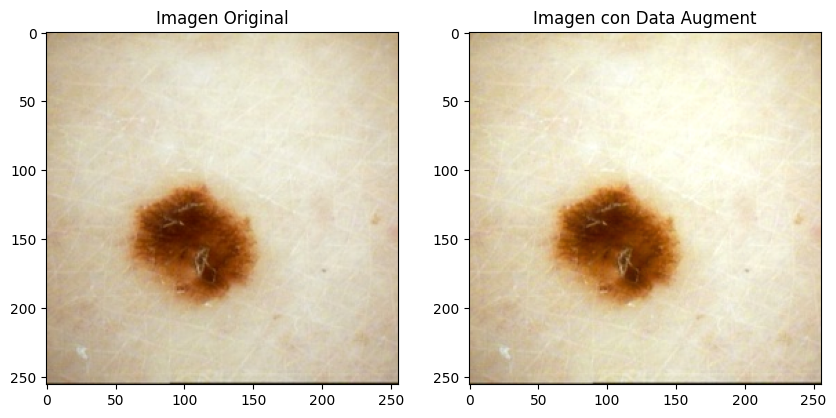

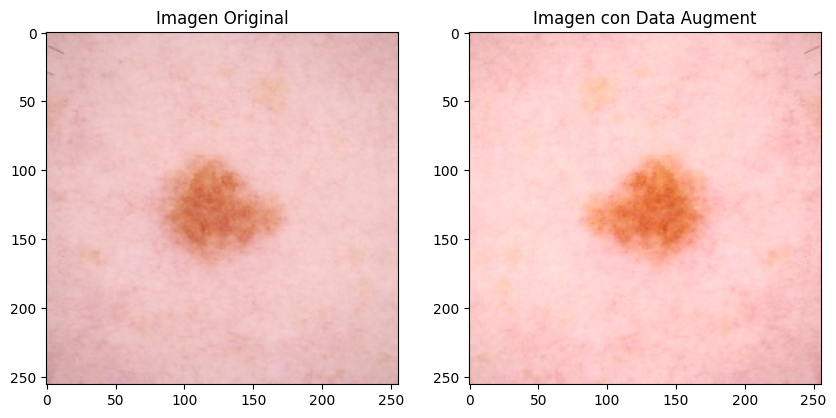

Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence


In [25]:
# Función para decodificar y procesar un ejemplo de un archivo .tfrec
def read_and_process_tfrecord(example):
    image, label = decode_example(example)

    # Aplica la función de dropout a la imagen
    image_aug = data_augment(image)

    return image, image_aug, label

# Ruta de la imagen
tfrec_path = "gs://manu-ucmbucket/DatasetKaggleTFM_resized/train02-2071.tfrec"

# Mostrar 5 imágenes diferentes y sus transformaciones en un formato más grande y cercano
# Lee el archivo .tfrec y aplica la función de dropout a 10 imágenes
num_images_to_read = 10
dataset = tf.data.TFRecordDataset(tfrec_path, num_parallel_reads=AUTO)

# Aplica la función de decodificación y dropout
dataset = dataset.map(decode_example, num_parallel_calls=AUTO)

# Muestra las imágenes originales y las imágenes con dropout
for i, (original_image, label) in enumerate(dataset.take(num_images_to_read)):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f"Imagen Original")
    plt.imshow(original_image.numpy())

    # Aplica la función de dropout a la imagen original
    image_aug = data_augment(original_image)

    plt.subplot(1, 2, 2)
    plt.title(f"Imagen con Data Augment")
    plt.imshow(image_aug.numpy())

    plt.show()




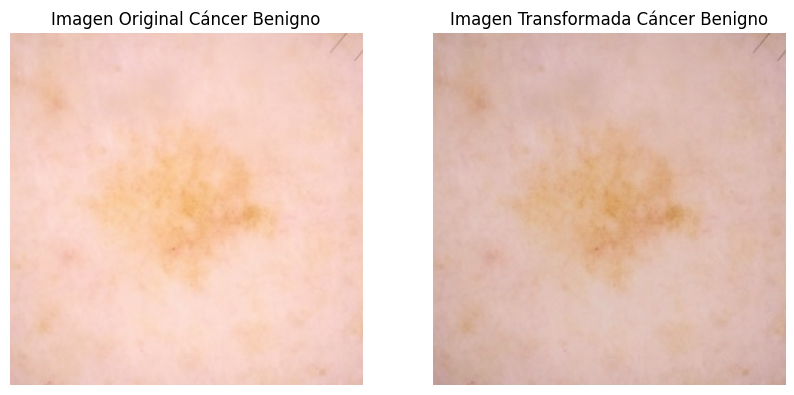

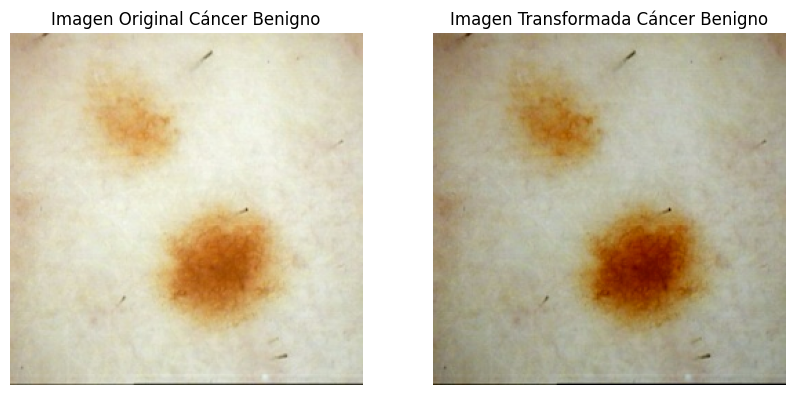

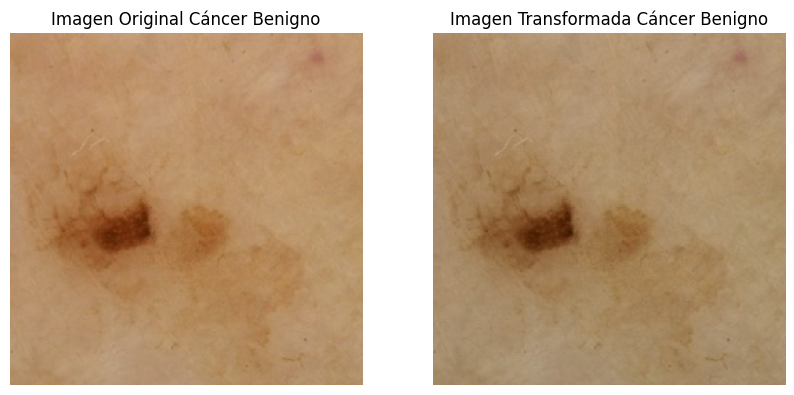

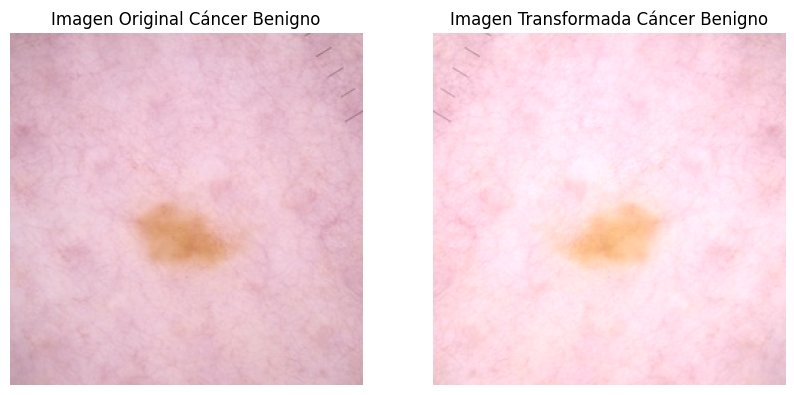

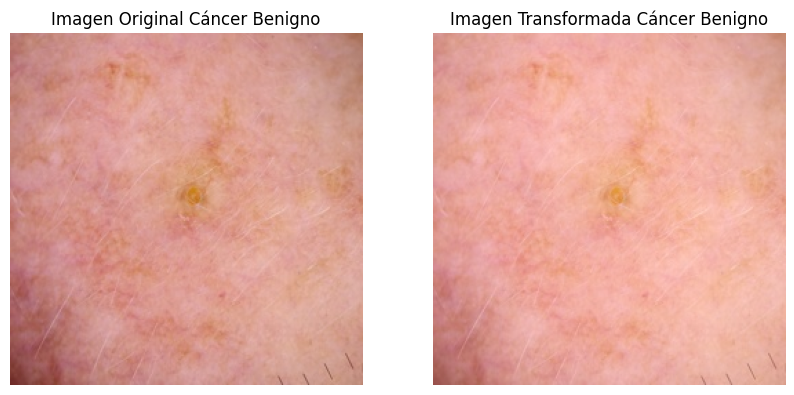

Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence


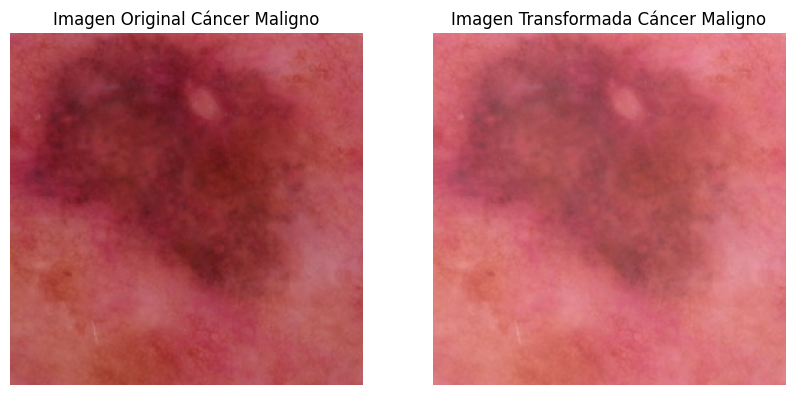

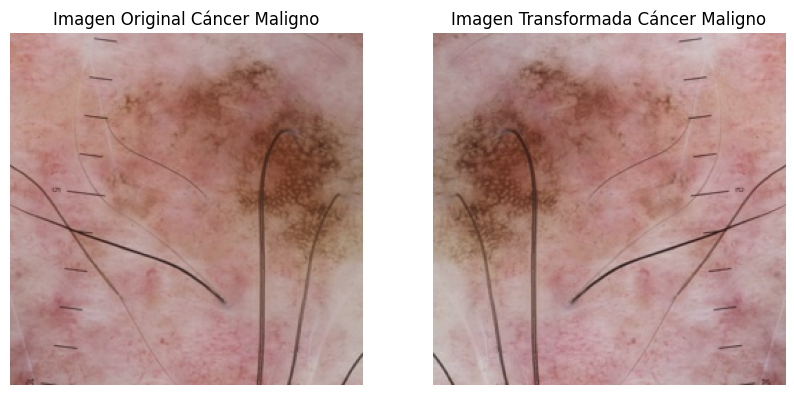

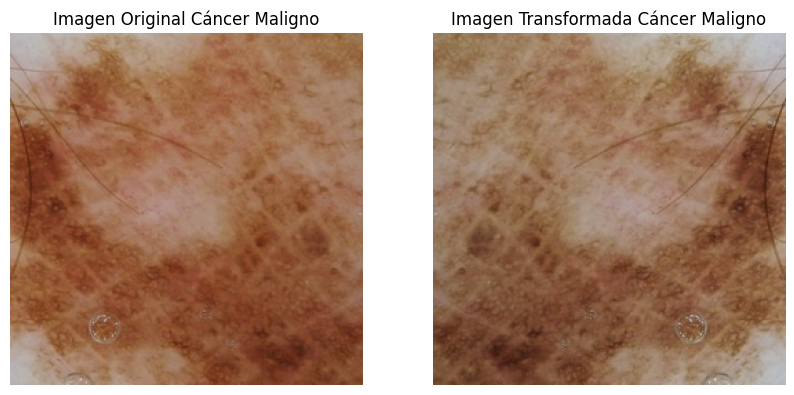

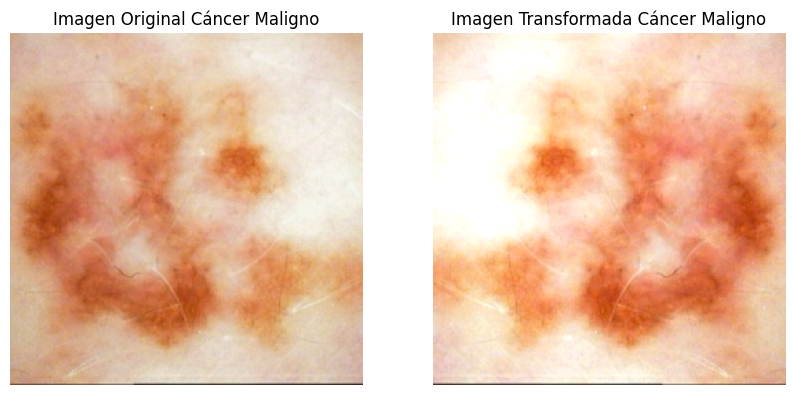

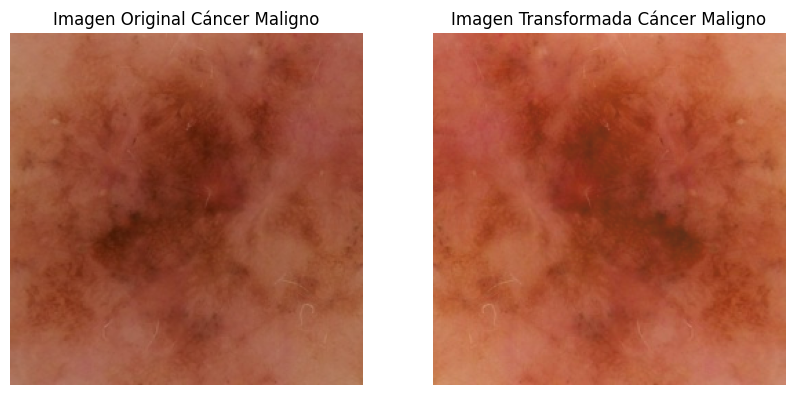

Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence


In [78]:
# Filtra el dataset para obtener imágenes con target = 0
filtered_dataset_0 = dataset.filter(lambda image, label: label == 0)

# Filtra el dataset para obtener imágenes con target = 1
filtered_dataset_1 = dataset.filter(lambda image, label: label == 1)

# Aplica la función de data_augment a las imágenes en cada dataset
augmented_dataset_0 = filtered_dataset_0.map(lambda image, label: (image, data_augment(image), label))
augmented_dataset_1 = filtered_dataset_1.map(lambda image, label: (image, data_augment(image), label))

# Toma 5 ejemplos de cada dataset
num_images_to_show = 5
augmented_dataset_0 = augmented_dataset_0.take(num_images_to_show)
augmented_dataset_1 = augmented_dataset_1.take(num_images_to_show)

# Muestra las imágenes originales y aumentadas con target = 0
for i, (original_image, augmented_image, label) in enumerate(augmented_dataset_0):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f"Imagen Original Cáncer Benigno")
    plt.imshow(original_image.numpy())
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(f"Imagen Transformada Cáncer Benigno")
    plt.imshow(augmented_image.numpy())
    plt.axis('off')

    plt.show()

# Muestra las imágenes originales y aumentadas con target = 1
for i, (original_image, augmented_image, label) in enumerate(augmented_dataset_1):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f"Imagen Original Cáncer Maligno")
    plt.imshow(original_image.numpy())
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title(f"Imagen Transformada Cáncer Maligno")
    plt.imshow(augmented_image.numpy())
    plt.axis('off')

    plt.show()


# 4.- Predicción Datos Tabulares

Vamos a realizar la predicción sobre únicamente los datos tabulares para ver que obtenemos.

Nos basaremos en la métrica de "accuracy" que es el porcentaje de número de aciertos que realiza nuestro modelo.

Antes de nada, vamos ajustar los conjutnos Train y Test antes de pasarlo al modelo. Primero elininamos las variables redundantes de Train.

In [50]:
train.head()

,image_name,patient_id,sex,age_approx,diagnosis,benign_malignant,target,zona_head/neck,zona_lower extremity,zona_oral/genital,zona_palms/soles,zona_torso,zona_upper extremity,zona_nan
0,ISIC_2637011,IP_7279968,0,45.0,unknown,benign,0,1,0,0,0,0,0,0
1,ISIC_0015719,IP_3075186,1,45.0,unknown,benign,0,0,0,0,0,0,1,0
2,ISIC_0052212,IP_2842074,1,50.0,nevus,benign,0,0,1,0,0,0,0,0
3,ISIC_0068279,IP_6890425,1,45.0,unknown,benign,0,1,0,0,0,0,0,0
4,ISIC_0074268,IP_8723313,1,55.0,unknown,benign,0,0,0,0,0,0,1,0


In [51]:
train1 = train.drop(['image_name', 'patient_id', 'diagnosis', 'benign_malignant', 'zona_nan'], axis = 1)



Además, realizamos la conversión de los datos de sex como número entero y target como categórico. PROBAR COMO INT

In [52]:
train1['sex'] = train1['sex'].astype('uint8')
train1['target'] = train1['target'].astype('category')
train1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33126 entries, 0 to 33125
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   sex                   33126 non-null  uint8   
 1   age_approx            33126 non-null  float64 
 2   target                33126 non-null  category
 3   zona_head/neck        33126 non-null  uint8   
 4   zona_lower extremity  33126 non-null  uint8   
 5   zona_oral/genital     33126 non-null  uint8   
 6   zona_palms/soles      33126 non-null  uint8   
 7   zona_torso            33126 non-null  uint8   
 8   zona_upper extremity  33126 non-null  uint8   
dtypes: category(1), float64(1), uint8(7)
memory usage: 517.8 KB


Creamos un nuevo dataframe llamado test1, donde eliminamos las variables que no vamos a utilizar en el modelo. Asimismo, realizamos la conversión de la variable sex como entero.

In [53]:
test1 = test.drop(['image_name', 'patient_id', 'zona_nan'], axis = 1)
test1['sex'] = test1['sex'].astype('uint8')

In [54]:
test1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10982 entries, 0 to 10981
Data columns (total 8 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   sex                   10982 non-null  uint8  
 1   age_approx            10982 non-null  float64
 2   zona_head/neck        10982 non-null  uint8  
 3   zona_lower extremity  10982 non-null  uint8  
 4   zona_oral/genital     10982 non-null  uint8  
 5   zona_palms/soles      10982 non-null  uint8  
 6   zona_torso            10982 non-null  uint8  
 7   zona_upper extremity  10982 non-null  uint8  
dtypes: float64(1), uint8(7)
memory usage: 161.0 KB


Ahora vamos a definir todo el código que vamos a utilizar. Primeramente realizamos una división del Train como train y validation, con un split del 0.2.

Definimos los modelos a utilizar y comenzamos a entrenar, guardando las métricas de accuracy y área bajo la curva, ROC AUC Score.

Por último, guardamos en archivos csv con el nombre del modelo para tener indentificados la predicción del modelo al que pertenece.

Además, comentar que aplicamos **stratify**, que es una técnica importante cuando tratamos con conjuntos de datos desequilibrados.

In [83]:
y = train1['target']
train1 = train1.drop('target', axis = 1)

# Dividir el conjunto de entrenamiento en entrenamiento y validación (80% entrenamiento, 20% validación)
X_train, X_val, y_train, y_val = train_test_split(train1,
                                                  y,
                                                  test_size=0.2,
                                                  stratify = y,
                                                  random_state=42)
# Inicializar modelos
modelos = {
    'Logistic Regression': LogisticRegression(max_iter = 1000),
    'Random Forest Classifier': RandomForestClassifier(),
    'XGBoost Classifier': xgb.XGBClassifier(),
    'Naive Bayes': GaussianNB()
}

# Entrenar y evaluar modelos
for model_name, model in modelos.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    accuracy = accuracy_score(y_val, y_pred)
    roc_auc = roc_auc_score(y_val, y_pred)
    print(f'Model: {model_name}')
    print(f'Accuracy: {accuracy}')
    print(f'ROC AUC Score: {roc_auc}\n')

    # Hacer predicciones en el conjunto de prueba con cada modelo
    test_predictions = model.predict(test1)

    # Crear un DataFrame con las predicciones
    submission_df = pd.DataFrame({'image_name': test['image_name'], 'target': test_predictions})

    # Guardar las predicciones en un archivo CSV con el nombre del modelo
    submission_df.to_csv(f'{model_name}_predictions.csv', index=False)

Model: Logistic Regression
Accuracy: 0.9823422879565349
ROC AUC Score: 0.5

Model: Random Forest Classifier
Accuracy: 0.9820404467250227
ROC AUC Score: 0.5040430541275526

Model: XGBoost Classifier
Accuracy: 0.9820404467250227
ROC AUC Score: 0.5040430541275526

Model: Naive Bayes
Accuracy: 0.9370661032297012
ROC AUC Score: 0.5482986738940033



Donde observamos que el mejor modelo es Naive Bayes, pero no quiere decir que sea el mejor prediciendo nuevos datos. Si pasamos las predicciones del conjunto Test en Kaggle, vemos que:

- Regresión Logística: 0.5
- Random Forest Classifier: 0.5025
- XGBoost: 0.5064
- Naive Bayes: 0.5263

Donde vemos que Naive Bayes es el mejor modelo. Aunque sea esto, vamos a elegir como tuneo de hiperparámetros XGBoost, ya que es un modelo que se basa en árboles de decisión, puede manejar datos más diversos y relaciones más complejas.

Vamos definir los parámetros que queremos buscar para encontrar la mejor combinación de todos ellos.

In [ ]:
# Define los hiperparámetros que deseas buscar
param_grid = {
    'n_estimators': [500, 750, 850],
    'max_depth': [2, 10, 15],
    'learning_rate': [0.01, 0.1]
}

# Crea un modelo base
base_model = xgb.XGBClassifier(
    random_state=42,
    n_jobs=-1
)

Definimos también una validación cruzada por medio 5 splits, es decir, el conjunto se dividirá en 5 subconjuntos donde 4 serán para entrenamiento y 1 de validación. Esto lo repetirá 5 veces. Por tanto, es una buena forma de asegurar nuestras predicciones.

In [ ]:
# Validación cruzada de 5 splits.
cv = StratifiedKFold(n_splits = 5, shuffle=True, random_state=42)

Y ahora empezamos la búsqueda de la mejor combinación de hiperparámetros. Cuando haya terminado, nos lo mostrará por pantalla.

In [ ]:
grid_search = GridSearchCV(base_model, param_grid, cv=cv, scoring='roc_auc', n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# Muestra los mejores hiperparámetros encontrados
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f'Mejores hiperparametors encontrados: {best_params}')
print(f'Mejor score encontrado: {best_score}')

Fitting 5 folds for each of 18 candidates, totalling 90 fits
Mejores hiperparametors encontrados: {'learning_rate': 0.1, 'max_depth': 2, 'n_estimators': 850}
Mejor score encontrado: 0.692752209191792


Definimos el modelo con los mejores hiperparámetros. Realizamos las predicciones sobre el conjunto X_test y obtenemos la curva ROC.

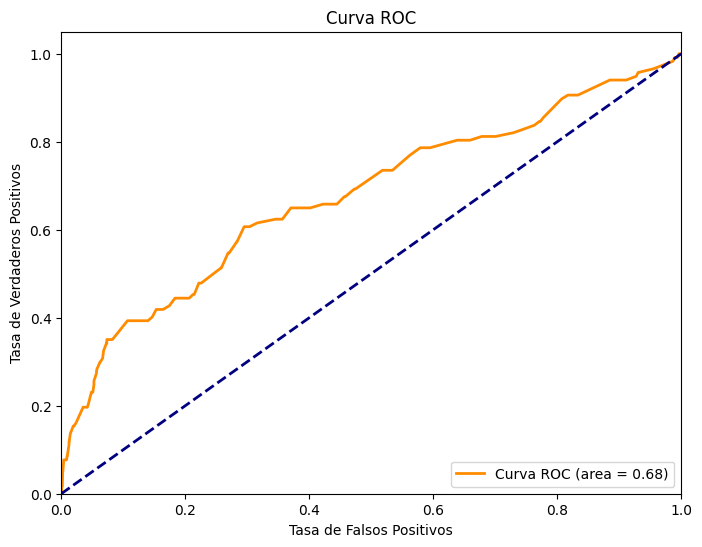

In [85]:
best_model = grid_search.best_estimator_

# Predicciones en el conjunto de prueba (test)
test_predictions = best_model.predict_proba(X_val)[:, 1]

# Curva ROC
fpr, tpr, _ = roc_curve(y_val, test_predictions)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.show()



Vemos que la curva ROC representa una evaluación del modelo algo pobre todavía, también normal pues estamos con datos tabulares.

Podemos ver las métricas que tiene este modelo en sus predicciones.

In [86]:


# Calcular las métricas de evaluación
y_pred = best_model.predict(X_val)
accuracy = accuracy_score(y_val, y_pred)
precision = precision_score(y_val, y_pred)
recall = recall_score(y_val, y_pred)
f1 = f1_score(y_val, y_pred)
conf_matrix = confusion_matrix(y_val, y_pred)

# Crear un DataFrame con las métricas
metrics_df = pd.DataFrame({
    'Metrica': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Valor': [accuracy, precision, recall, f1]
})

# Imprimir las métricas
metrics_df.head()


,Metrica,Valor
0,Accuracy,0.98204
1,Precision,0.00000
2,Recall,0.00000
3,F1 Score,0.00000


Y el informe de clasificación con la matriz de confunsión es:

In [87]:
# Calcular las métricas de evaluación
y_pred = best_model.predict(X_val)
conf_matrix = confusion_matrix(y_val, y_pred)

# Crear un informe de clasificación
classification_rep = classification_report(y_val, y_pred, target_names=['No Melanoma', 'Melanoma'], output_dict=True)

# Crear un DataFrame a partir del informe de clasificación
classification_df = pd.DataFrame(classification_rep).transpose()

# Imprimir el informe de clasificación formateado
print("Informe de Clasificación:")
print(classification_df.to_markdown())

# Imprimir la matriz de confusión formateada
print('\nMatriz de Confusión:')
confusion_df = pd.DataFrame(conf_matrix, columns=['Predicción No Melanoma', 'Predicción Melanoma'], index=['Real No Melanoma', 'Real Melanoma'])
print(confusion_df.to_markdown())

Informe de Clasificación:
|              |   precision |   recall |   f1-score |    support |
|:-------------|------------:|---------:|-----------:|-----------:|
| No Melanoma  |    0.982337 | 0.999693 |   0.990939 | 6509       |
| Melanoma     |    0        | 0        |   0        |  117       |
| accuracy     |    0.98204  | 0.98204  |   0.98204  |    0.98204 |
| macro avg    |    0.491168 | 0.499846 |   0.495469 | 6626       |
| weighted avg |    0.964991 | 0.98204  |   0.973441 | 6626       |

Matriz de Confusión:
|                  |   Predicción No Melanoma |   Predicción Melanoma |
|:-----------------|-------------------------:|----------------------:|
| Real No Melanoma |                     6507 |                     2 |
| Real Melanoma    |                      117 |                     0 |


Vemos que el modelo es pobre a la hora de predecir el melanoma, pues no predice ninguno de los registros que tenemos. Tendremos que mejorarlo.

Ahora entrenamos el modelo con todo el conjunto con dicha mejor combinación, realizamos predicciones sobre el conjunto test de kaggle.

In [ ]:

# Entrena un modelo final con los mejores hiperparámetros en todos los datos de entrenamiento
final_model = xgb.XGBClassifier(random_state=42, n_jobs=-1, **best_params)
final_model.fit(X_train, y_train)

# Realiza predicciones en el conjunto de prueba (test)
test_predictions = final_model.predict_proba(test1)[:, 1]

# Puedes guardar las predicciones en un archivo CSV
submission_df = pd.DataFrame({'image_name': test['image_name'], 'target': test_predictions})
submission_df.to_csv('submission.csv', index=False)

Obtenemos un accuracy en Kaggle de 69.35%, en cierta manera igual que la validación cruzada repetida.


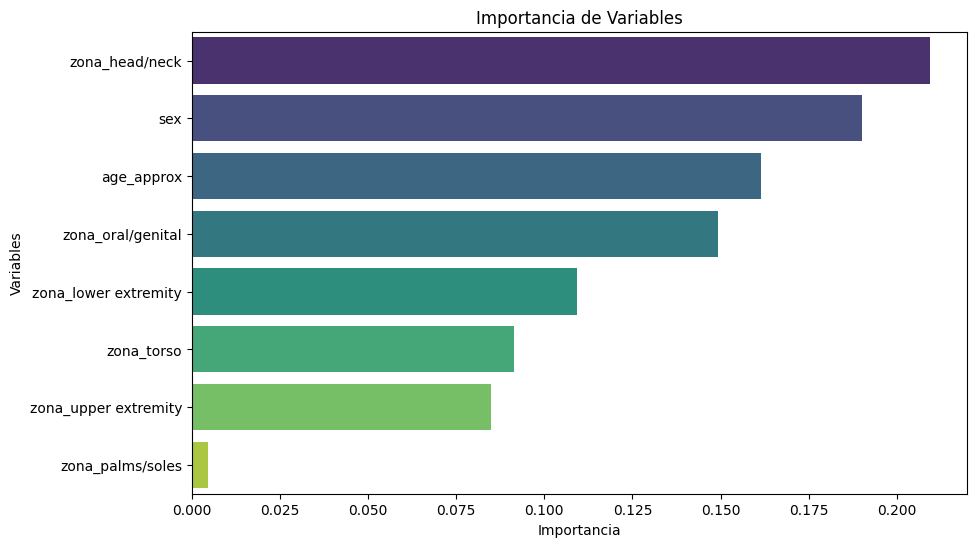

In [88]:
# Importancia de las variables POR HACER
feature_importance = pd.Series(best_model.feature_importances_, index=X_train.columns)
feature_importance = feature_importance.sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance, y=feature_importance.index, palette='viridis')
plt.xlabel('Importancia')
plt.ylabel('Variables')
plt.title('Importancia de Variables')
plt.show()

Tenemos que la localización de la cabeza y cuello con el sexo son las más importantes. La peor resulta ser la zona de las manos y plantas del pie, no aportando mucha información a la hora de predecir en el modelo de machine learning.

# 5.- Predicción Imágenes

En esta sección vamos a realizar la sobre las imágenes. Antes de nada, vamos a obtener dos listas llamadas TRAINING_FILENAMES y TEST_FILENAMES. Con ellas, obtenemos todas las rutas de los archivos que tenemos en Google Storage.

In [90]:
# Ruta de la carpeta en el bucket de Google Storage
gcs_pattern='gs://manu-ucmbucket/DatasetKaggleTFM_resized'
# Configura tus credenciales de Google Cloud (asegúrate de haber descargado el JSON de credenciales)
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = "/content/plucky-bulwark-387218-f84be5255719.json"

# Crea una instancia del cliente de Google Cloud Storage
client = storage.Client()

TRAINING_FILENAMES = tf.io.gfile.glob(gcs_pattern + '/train*.tfrec')
TEST_FILENAMES = tf.io.gfile.glob(gcs_pattern + '/test*.tfrec')

Comprobamos dicha lista de archivos para apreciar como son:

In [91]:
TRAINING_FILENAMES

['gs://manu-ucmbucket/DatasetKaggleTFM_resized/train00-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train01-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train02-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train03-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train04-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train05-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train06-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train07-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train08-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train09-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train10-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train11-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train12-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train13-2071.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/t

In [92]:
TEST_FILENAMES

['gs://manu-ucmbucket/DatasetKaggleTFM_resized/test00-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test01-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test02-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test03-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test04-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test05-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test06-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test07-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test08-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test09-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test10-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test11-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test12-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test13-687.tfrec',
 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/test14-687.tfrec',
 'gs://man

Ahora, como bien hicimos en la sección dos, haremos uso de la variable AUTO que es para tomar decisiones automáticas durante la ejecución del código para mejorar el rendimiento. Seguidamente, vamos a definir la dimesión que tenemos en los .tfrec, 256 x 256 px, y lo guardamos en una lista.

Por último, definimos el BATCH_SIZE que será lotes de 128 imágenes. Esto se obtiene gracias a REPLICAS, ya que definimos un valor inicial, en nuestro caso 16 y lo multiplicamos por el número de réplicas que nos da la TPU de Google Colab que son 8 máquinas.


In [93]:
IMAGE_SIZE = [256, 256]
BATCH_SIZE = 16 * REPLICAS

Ahora vamos a realizar una división de nuestro conjunto de entrenamiento, en otro conjunto de entrenamiento con validación, realizando esta división en un porcentaje del 0.19. Guardamos en nuevas variables las nuevas listas pertenecientes al train y validation de nuestros tfrec. Por otro lado, definimos la lista para el test.

In [94]:
validation_split = 0.19
filenames = tf.io.gfile.glob(TRAINING_FILENAMES)
split = len(filenames) - int(len(filenames) * validation_split)
train_fns = filenames[:split]
validation_fns = filenames[split:]
test_filenames = tf.io.gfile.glob(TEST_FILENAMES)


Definimos una función llamada count_data_itemts(filenames), para contar el número de registros que tenemos en los archivos tfrec, y así pues ver el número de imágenes totales que tenemos para conjunto.

In [95]:
# Se define la función para contar el número de registros que tiene archivos tfrec.
def count_data_items(filenames):
    n = [int(re.compile(r"-([0-9]*)\.").search(filename).group(1)) for filename in filenames]
    return np.sum(n)

# Hacemos uso de la función para contar el número de imágenes que hay
NUM_TRAINING_IMAGES = count_data_items(train_fns)
NUM_TEST_IMAGES = count_data_items(test_filenames)
NUM_VALID_IMAGES = count_data_items(validation_fns)

print('En todos los archivos tfrec hay: {} imágenes de entrenamiento, {} imágenes para validación, {} imágenes para test'
      .format(NUM_TRAINING_IMAGES, NUM_VALID_IMAGES, NUM_TEST_IMAGES))

En todos los archivos tfrec hay: 26923 imágenes de entrenamiento, 6203 imágenes para validación, 10982 imágenes para test


Primeramente tendremos que definir una función llamada load_dataset donde realizaremos la carga de los tfrec en un dataset propio de tensorflow.

Justo en la misma función de load_dataset, tendremos que definir dos nuevas funciones, que realizarán la lectura de los archivos tfrec y donde devolverá un conjunto de datos con las imágenes. Estas dos funciones son read_labeled_tfrecord y read_unlabeled_tfrecord. La diferencia entre ambos es que uno es para los conjuntos de entrenamiento y validación ya que tiene la variable objetivo, target. La otra es para el conjunto de test, al no tener dicha variable.

También introducimos la función de data augment para poder mejorar algo más el modelo.

Luego definimos las funciones para poder pasarlo a un modelo de aprendizaje profundo. Definimos las funciones de obtención de los conjuntos de entrenamiento, validación y test, siendo éstos get_training_dataset, get_validation_dataset y get_test_dataset, respectivamente.


In [96]:
@tf.function
def load_dataset(filenames, labeled=True):
    ignore_order = tf.data.Options()

    dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO)
    dataset = dataset.with_options(ignore_order)
    dataset = dataset.map(read_labeled_tfrecord if labeled else read_unlabeled_tfrecord, num_parallel_calls=AUTO)

    return dataset

def read_labeled_tfrecord(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.int64),
    }
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    image = tf.image.resize(image, IMAGE_SIZE)
    label = tf.cast(example['target'], tf.int32)

    return image, label

def read_unlabeled_tfrecord(example):
    u_features = {
        "image": tf.io.FixedLenFeature([], tf.string),
        "image_name": tf.io.FixedLenFeature([], tf.string),
    }
    example = tf.io.parse_single_example(example, u_features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    image = tf.image.resize(image, IMAGE_SIZE)
    idnum = example['image_name']
    return image, idnum

def data_augment(image, label):
    image = tf.image.random_flip_left_right(image)
    image = tf.image.random_hue(image, 0.01)
    image = tf.image.random_saturation(image, 0.7, 1.3)
    image = tf.image.random_contrast(image, 0.8, 1.2)
    image = tf.image.random_brightness(image, 0.2)
    return image, label

def get_training_dataset(train_fns):
    dataset = load_dataset(train_fns, labeled=True)
    dataset = dataset.map(data_augment, num_parallel_calls=AUTO)
    dataset = dataset.repeat()
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO)
    return dataset

def get_test_dataset(test_filenames):
    dataset = load_dataset(test_filenames, labeled=False)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO)
    return dataset

def get_validation_dataset(filenames, train=False):
    dataset = load_dataset(filenames, labeled=True)
    dataset = dataset.cache()

    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO)
    return dataset



Obtenemos los conjuntos de datos aplicando las funciones anteriores.

In [97]:
# # Dataset de entrenamiento
training_dataset = get_training_dataset(train_fns)
# Dataset de validación
validation_dataset = load_dataset(validation_fns).batch(BATCH_SIZE).prefetch(AUTO)
# Dataset de test
test_dataset = get_test_dataset(test_filenames)

También antes de nada vamos a definir una función llamada focal_loss, es una función de pérdida utilizada en problemas de clasificación binaria, especialmente en situaciones en las que los datos están desequilibrados, es decir, justamente nuestro caso ya que tenemos 584 imágenes malignas frente a 32542 benignas.

In [98]:
def focal_loss(y_true, y_pred):
    gamma = 2.0
    alpha = 4.0
    pt = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
    return -alpha * tf.pow(1.0 - pt, gamma) * tf.math.log(pt + 1e-7)

Ahora vamos a definir el número de pasos que vamos a tomar tanto para el entrenamiento como el test en el modelo de aprendizaje profundo. Los pasos de validación (validation_steps) son cuántas veces verificamos el aprendizaje del modelo y los pasos por época (steps_per_epoch) son cuántas veces repetimos el proceso de enseñar las imágenes en cada ciclo de entrenamiento. También definimos el número de épocas (epochs) para el modelo, que es el número de veces que pasan las fotos por el modelo.

In [99]:
epochs = 15
validation_steps = NUM_VALID_IMAGES // BATCH_SIZE
steps_per_epoch = NUM_TRAINING_IMAGES // BATCH_SIZE

Vamos a definir ahora un modelo de deep learning sencillo, para ver sobre que métrica empezamos.

In [ ]:
with strategy.scope():
    model = models.Sequential([
        layers.Input(shape=(256, 256, 3)),
        layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01)),
        layers.BatchNormalization(),
        layers.Flatten(),
        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss=focal_loss, metrics=['accuracy'])

# Resumen del modelo
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256, 256, 128)     512       
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 128)    512       
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 256, 256, 64)      8256      
                                                                 
 batch_normalization_1 (Batc  (None, 256, 256, 64)     256       
 hNormalization)                                                 
                                                                 
 flatten (Flatten)           (None, 4194304)           0         
                                                                 
 dense_2 (Dense)             (None, 1)                 4

In [ ]:
history = model.fit(training_dataset,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=validation_dataset,
                    validation_steps=validation_steps
                    )


Epoch 1/15
210/210 [==============================] - 67s 206ms/step - loss: 25.1973 - accuracy: 0.6168 - val_loss: 1.8202 - val_accuracy: 0.9814
Epoch 2/15
210/210 [==============================] - 43s 204ms/step - loss: 16.9995 - accuracy: 0.7459 - val_loss: 3.9853 - val_accuracy: 0.9476
Epoch 3/15
210/210 [==============================] - 31s 146ms/step - loss: 5.8455 - accuracy: 0.9191 - val_loss: 2.5304 - val_accuracy: 0.9705
Epoch 4/15
210/210 [==============================] - 29s 137ms/step - loss: 6.1911 - accuracy: 0.9138 - val_loss: 1.9070 - val_accuracy: 0.9805
Epoch 5/15
210/210 [==============================] - 29s 138ms/step - loss: 2.2988 - accuracy: 0.9743 - val_loss: 10.8994 - val_accuracy: 0.8403
Epoch 6/15
210/210 [==============================] - 27s 131ms/step - loss: 4.2640 - accuracy: 0.9438 - val_loss: 1.8933 - val_accuracy: 0.9806
Epoch 7/15
210/210 [==============================] - 47s 227ms/step - loss: 1.7988 - accuracy: 0.9820 - val_loss: 1.8960 - val

Veamos ahora los resultados de la validación del modelo anterior

In [ ]:
results = model.evaluate(validation_dataset, verbose=1)
print('Validation Loss: {}'.format(results[0]))
print('Validation Accuracy: {}'.format(results[1]))

49/49 [==============================] - 7s 61ms/step - loss: 1.7303 - accuracy: 0.9811
Validation Loss: 1.7303205728530884
Validation Accuracy: 0.9811381697654724


Definimos ahora una función para ver como progresa la función de pérdida, focal loss, y el accuracy conforme se va entrenando el modelo.

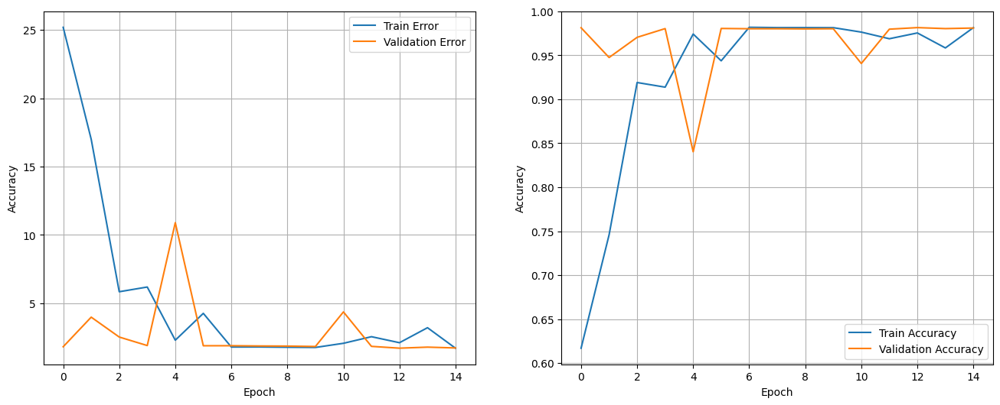

In [ ]:
def show_loss_accuracy_evolution(history):

    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

    ax1.set_xlabel('Epoch')
    ax1.set_ylabel('Loss')
    ax1.plot(hist['epoch'], hist['loss'], label='Train Error')
    ax1.plot(hist['epoch'], hist['val_loss'], label = 'Validation Error')
    ax1.grid()
    ax1.legend()

    ax2.set_xlabel('Epoch')
    ax2.set_ylabel('Accuracy')
    ax2.plot(hist['epoch'], hist['accuracy'], label='Train Accuracy')
    ax2.plot(hist['epoch'], hist['val_accuracy'], label = 'Validation Accuracy')
    ax2.grid()
    ax2.legend()

    plt.show()

show_loss_accuracy_evolution(history)

Donde podemos ver que la evolución del ACCURACY Y FOCAL LOSS no es del todo estable a la hora que pasan las épocas.

In [ ]:
print('Computing predictions...')
test_images_ds = test_dataset.map(lambda image, idnum: image)
probabilities = model.predict(test_images_ds).flatten()
print(probabilities)

print('Generating submission.csv file...')
test_ids_ds = test_dataset.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U') # all in one batch
np.savetxt('colab1.csv', np.rec.fromarrays([test_ids, probabilities]), fmt=['%s', '%f'],
           delimiter=',', header='image_name,target', comments='')

Computing predictions...
86/86 [==============================] - 18s 55ms/step
[0. 0. 0. ... 0. 0. 0.]
Generating submission.csv file...


Ahora vamos a introducir más capas neuronares y otros tipos de capas de redes neuronales para poder mejorar más el modelo de aprendizaje profundo a la hora de predecir el cancer de piel, melanoma.

Vamos aplicar las siguientes capas: Conv2D, MaxPooling2D y Dropout. Un poco de que tratan cada una de ellas:

- Capa Conv2D: Esta es una capa convolucional que procesa la imagen de entrada (256x256) para detectar patrones en los datos. Utiliza una ventana deslizante (kernel) para escanear la imagen y extraer características. El número 512, 256 representa la cantidad de filtros o características diferentes que la capa buscará en la imagen.

- Capa MaxPooling2D: Esta capa se utiliza después de las capas Conv2D para reducir el tamaño de las características extraídas. Ayuda a mantener solo las características más importantes al tomar el valor máximo en pequeñas regiones de la imagen.

- Capa de Dropout: La capa de dropout es una técnica de regularización que ayuda a prevenir el sobreajuste. Durante el entrenamiento, aleatoriamente "apaga" un porcentaje de neuronas, lo que ayuda a que el modelo generalice mejor.

In [ ]:
with strategy.scope():
    input_shape = (256, 256, 3)

    model = models.Sequential([
        layers.Conv2D(512, (3, 3), activation='relu', input_shape=input_shape),
        layers.MaxPooling2D((2, 2)),

        layers.Conv2D(256, (3, 3), activation='relu'),
        layers.MaxPooling2D((2, 2)),

        layers.Dense(128, activation='relu'),
        layers.MaxPooling2D((2, 2)),

        layers.Dense(64, activation='relu'),

        layers.Flatten(),
        layers.Dropout(0.3),
        layers.Dense(128, activation='relu'),
        layers.Dense(256, activation='relu'),

        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss=focal_loss, metrics=['accuracy'])

# Resumen del modelo
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 512)     14336     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 512)    0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 256)     1179904   
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 256)      0         
 2D)                                                             
                                                                 
 dense_3 (Dense)             (None, 62, 62, 128)       32896     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 31, 31, 128)     

Vamos a entrenar dicho modelo


In [ ]:
history = model.fit(training_dataset,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=validation_dataset,
                    validation_steps=validation_steps
                    )

Epoch 1/15
210/210 [==============================] - 82s 301ms/step - loss: 0.1219 - accuracy: 0.9782 - val_loss: 0.1100 - val_accuracy: 0.9814
Epoch 2/15
210/210 [==============================] - 58s 276ms/step - loss: 0.1086 - accuracy: 0.9826 - val_loss: 0.1052 - val_accuracy: 0.9814
Epoch 3/15
210/210 [==============================] - 57s 269ms/step - loss: 0.1027 - accuracy: 0.9827 - val_loss: 0.1067 - val_accuracy: 0.9814
Epoch 4/15
210/210 [==============================] - 56s 268ms/step - loss: 0.1042 - accuracy: 0.9824 - val_loss: 0.1083 - val_accuracy: 0.9814
Epoch 5/15
210/210 [==============================] - 55s 264ms/step - loss: 0.1048 - accuracy: 0.9824 - val_loss: 0.1130 - val_accuracy: 0.9814
Epoch 6/15
210/210 [==============================] - 54s 256ms/step - loss: 0.1020 - accuracy: 0.9827 - val_loss: 0.1085 - val_accuracy: 0.9814
Epoch 7/15
210/210 [==============================] - 53s 252ms/step - loss: 0.1045 - accuracy: 0.9824 - val_loss: 0.1046 - val_ac

Ahora veamos los resultados del anterior modelo

In [ ]:
results = model.evaluate(validation_dataset, verbose=1)
print('Validation Loss: {}'.format(results[0]))
print('Validation Accuracy: {}'.format(results[1]))

49/49 [==============================] - 9s 108ms/step - loss: 0.0992 - accuracy: 0.9815
Validation Loss: 0.0992184728384018
Validation Accuracy: 0.9814605712890625


Y también las gráficas de progreso del ACCURACY y Focal Loss

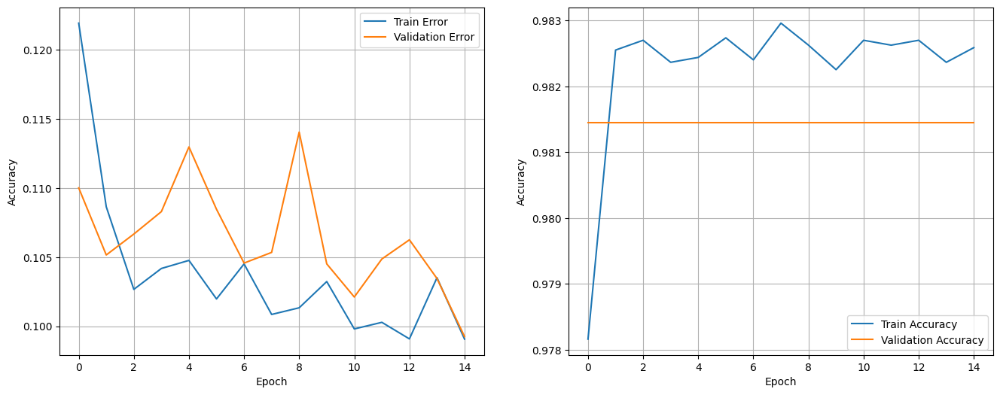

In [ ]:
show_loss_accuracy_evolution(history)

El modelo con el error sigue siendo bastante malo, pues la pérdida focal es oscilante en cada paso del entrenamiento.

In [ ]:
print('Computing predictions...')
test_images_ds = test_dataset.map(lambda image, idnum: image)
probabilities = model.predict(test_images_ds).flatten()
print(probabilities)

print('Generating submission.csv file...')
test_ids_ds = test_dataset.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U') # all in one batch
np.savetxt('colab2.csv', np.rec.fromarrays([test_ids, probabilities]), fmt=['%s', '%f'],
           delimiter=',', header='image_name,target', comments='')

Computing predictions...
86/86 [==============================] - 27s 147ms/step
[0.2290515  0.20080164 0.1283536  ... 0.29053408 0.19058737 0.15374511]
Generating submission.csv file...


Ahora vamos aplicar el mismo proceso pero aplicado la capa de AvgPooling2D en lugar de MaxPooling2D.

La diferencia principal es que AveragePooling2D toma el promedio de los valores en lugar de tomar el valor máximo en cada región.

In [ ]:
with strategy.scope():
    input_shape = (256, 256, 3)

    model = models.Sequential([
        layers.Conv2D(512, (3, 3), activation='relu', input_shape=input_shape),
        layers.AveragePooling2D((2, 2)),

        layers.Conv2D(256, (3, 3), activation='relu'),
        layers.AveragePooling2D((2, 2)),

        layers.Dense(128, activation='relu'),
        layers.AveragePooling2D((2, 2)),

        layers.Dense(64, activation='relu'),

        layers.Flatten(),
        layers.Dropout(0.3),
        layers.Dense(128, activation='relu'),
        layers.Dense(256, activation='relu'),

        layers.Dense(1, activation='sigmoid')
    ])

    model.compile(optimizer='adam', loss=focal_loss, metrics=['accuracy'])

# Resumen del modelo
model.summary()


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 254, 254, 512)     14336     
                                                                 
 average_pooling2d (AverageP  (None, 127, 127, 512)    0         
 ooling2D)                                                       
                                                                 
 conv2d_4 (Conv2D)           (None, 125, 125, 256)     1179904   
                                                                 
 average_pooling2d_1 (Averag  (None, 62, 62, 256)      0         
 ePooling2D)                                                     
                                                                 
 dense_8 (Dense)             (None, 62, 62, 128)       32896     
                                                                 
 average_pooling2d_2 (Averag  (None, 31, 31, 128)     

In [ ]:
history = model.fit(training_dataset,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=validation_dataset,
                    validation_steps=validation_steps
                    )

Epoch 1/15
210/210 [==============================] - 82s 278ms/step - loss: 0.1222 - accuracy: 0.9745 - val_loss: 0.1043 - val_accuracy: 0.9814
Epoch 2/15
210/210 [==============================] - 53s 251ms/step - loss: 0.1067 - accuracy: 0.9827 - val_loss: 0.1047 - val_accuracy: 0.9814
Epoch 3/15
210/210 [==============================] - 50s 241ms/step - loss: 0.1046 - accuracy: 0.9828 - val_loss: 0.1049 - val_accuracy: 0.9814
Epoch 4/15
210/210 [==============================] - 52s 247ms/step - loss: 0.1045 - accuracy: 0.9826 - val_loss: 0.1056 - val_accuracy: 0.9814
Epoch 5/15
210/210 [==============================] - 47s 226ms/step - loss: 0.1046 - accuracy: 0.9821 - val_loss: 0.1093 - val_accuracy: 0.9814
Epoch 6/15
210/210 [==============================] - 49s 234ms/step - loss: 0.1048 - accuracy: 0.9827 - val_loss: 0.1061 - val_accuracy: 0.9814
Epoch 7/15
210/210 [==============================] - 48s 228ms/step - loss: 0.1002 - accuracy: 0.9827 - val_loss: 0.1112 - val_ac

In [ ]:
results = model.evaluate(validation_dataset, verbose=1)
print('Validation Loss: {}'.format(results[0]))
print('Validation Accuracy: {}'.format(results[1]))

49/49 [==============================] - 9s 110ms/step - loss: 0.0990 - accuracy: 0.9815
Validation Loss: 0.09902442991733551
Validation Accuracy: 0.9814605712890625


Veamos ahora las gráficas del accuracy y focal loss.

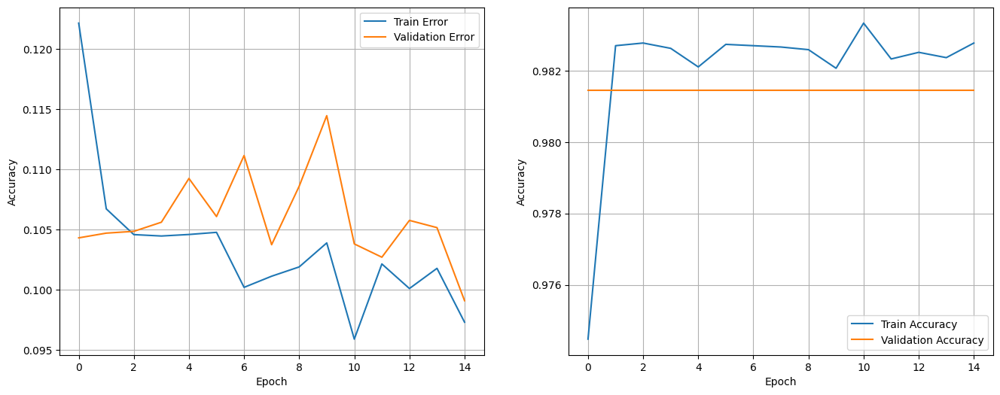

In [ ]:
show_loss_accuracy_evolution(history)

Obtenemos que el error focal es mucho menor que el modelo anterior pero sigue dando oscilaciones.

In [ ]:
print('Computing predictions...')
test_images_ds = test_dataset.map(lambda image, idnum: image)
probabilities = model.predict(test_images_ds).flatten()
print(probabilities)

print('Generating submission.csv file...')
test_ids_ds = test_dataset.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U') # all in one batch
np.savetxt('colab3.csv', np.rec.fromarrays([test_ids, probabilities]), fmt=['%s', '%f'],
           delimiter=',', header='image_name,target', comments='')

Computing predictions...
86/86 [==============================] - 27s 145ms/step
[0.20874605 0.2019803  0.13014093 ... 0.27586958 0.17582312 0.14736113]
Generating submission.csv file...


# 6.- Mejora del Modelo

En esta sección vamos a mejorar tanto el modelo de datos tabulares como el modelo de red convolucional, CNN.

## 6.1 Modelo Datos Tabulares

En esta sección, podemos primeramente realizar dos mejoras para que el modelo de machine learning.

Para la variable edad, age_approx, observamos que los datos se mueven en el rango entre 0 y 100 años, como podemos ver:

In [55]:
train['age_approx']

0        45.0
1        45.0
2        50.0
3        45.0
4        55.0
         ... 
33121    50.0
33122    65.0
33123    20.0
33124    50.0
33125    45.0
Name: age_approx, Length: 33126, dtype: float64

Aquí, vamos a normalizar los datos para tenerlos en un rango de [0, 1], y como todas las variables son valores enteros, también dentro del mismo, con unicamente valores de 0 o 1, el modelo de machine learning le será mucho más óptimo tratar con estos valores por igual. Si mostramos el máximo:

In [56]:
max = max(train['age_approx'])
print(f'El máximo de edad es: {max}')

El máximo de edad es: 90.0


Obtenemos como valor de 90 años, es decir, si dividimos todos los valores por dicho valor, obtenemos un rango de valores entre 0 y 1. Realizamos lo mismo para el dataframe de test.

In [57]:
train['age_approx'] /= max
test['age_approx'] /= max

In [58]:
train.head()

,image_name,patient_id,sex,age_approx,diagnosis,benign_malignant,target,zona_head/neck,zona_lower extremity,zona_oral/genital,zona_palms/soles,zona_torso,zona_upper extremity,zona_nan
0,ISIC_2637011,IP_7279968,0,0.500000,unknown,benign,0,1,0,0,0,0,0,0
1,ISIC_0015719,IP_3075186,1,0.500000,unknown,benign,0,0,0,0,0,0,1,0
2,ISIC_0052212,IP_2842074,1,0.555556,nevus,benign,0,0,1,0,0,0,0,0
3,ISIC_0068279,IP_6890425,1,0.500000,unknown,benign,0,1,0,0,0,0,0,0
4,ISIC_0074268,IP_8723313,1,0.611111,unknown,benign,0,0,0,0,0,0,1,0


In [59]:
test.head()

,image_name,patient_id,sex,age_approx,zona_head/neck,zona_lower extremity,zona_oral/genital,zona_palms/soles,zona_torso,zona_upper extremity,zona_nan
0,ISIC_0052060,IP_3579794,0,0.777778,0,0,0,0,1,0,0
1,ISIC_0052349,IP_7782715,0,0.444444,0,1,0,0,0,0,0
2,ISIC_0058510,IP_7960270,1,0.611111,0,0,0,0,1,0,0
3,ISIC_0073313,IP_6375035,1,0.555556,0,0,0,0,1,0,0
4,ISIC_0073502,IP_0589375,1,0.500000,0,1,0,0,0,0,0


Por otra parte, nos surge la duda si para cada paciente puede haber varias imágenes diferentes, donde vemos que:

In [60]:
# Agrupa los datos por 'patient_id' y cuenta las ocurrencias de 'image_name' en cada grupo
train.groupby('patient_id')['image_name'].count()

patient_id
IP_0001230     6
IP_0019713    13
IP_0036322     5
IP_0038436     3
IP_0038545    28
              ..
IP_9989332    10
IP_9992027    39
IP_9995095    14
IP_9996429     3
IP_9997715    11
Name: image_name, Length: 2056, dtype: int64

Donde vemos que efectivamente sí que hay varias imágenes por paciente, por tanto, vamos a introducir esta nueva variable llamada **n_images** para el modelo de machine learning para ver si podemos ganas algo más de accuracy para dicho modelo.

Guardamos esta nueva variable tanto para train y test.

In [61]:
# Para el DataFrame de entrenamiento 'train'
train['n_images'] = train.groupby('patient_id')['image_name'].transform('count')

# Para el DataFrame de prueba 'test'
test['n_images'] = test.groupby('patient_id')['image_name'].transform('count')


Además, a esta nueva variable, vemos que si le aplicamos la funcion de **np.log1p()**, que es una función de numpy, que devuelve el logaritmo natural de 1+x.

Por tanto, vemos en las gráfica de train y test:

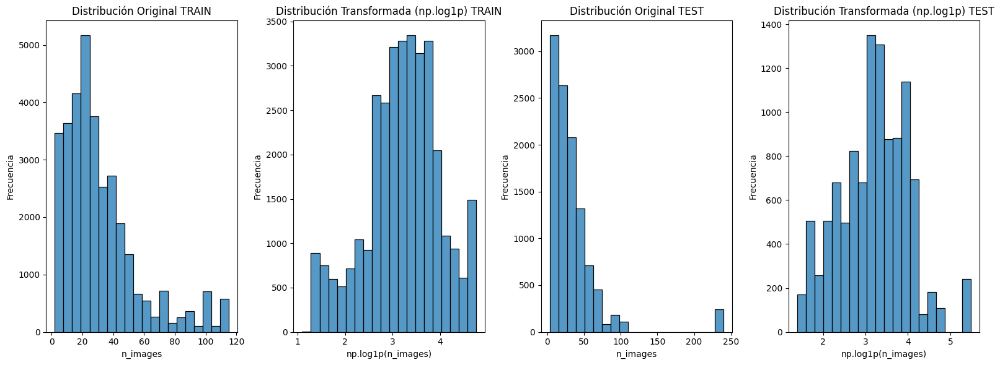

In [62]:
plt.figure(figsize=(16, 6))

# Gráfico de la variable original en TRAIN
plt.subplot(1, 4, 1)
sns.histplot(data=train, x='n_images', bins=20)
plt.title('Distribución Original TRAIN')
plt.xlabel('n_images')
plt.ylabel('Frecuencia')

# Gráfico de la variable transformada por np.log1p() en TRAIN
plt.subplot(1, 4, 2)
sns.histplot(data=train, x=np.log1p(train['n_images']), bins=20)
plt.title('Distribución Transformada (np.log1p) TRAIN')
plt.xlabel('np.log1p(n_images)')
plt.ylabel('Frecuencia')

# Gráfico de la variable original en TEST
plt.subplot(1, 4, 3)
sns.histplot(data=test, x='n_images', bins=20)
plt.title('Distribución Original TEST')
plt.xlabel('n_images')
plt.ylabel('Frecuencia')

# Gráfico de la variable transformada por np.log1p() en TEST
plt.subplot(1, 4, 4)
sns.histplot(data=test, x=np.log1p(test['n_images']), bins=20)
plt.title('Distribución Transformada (np.log1p) TEST')
plt.xlabel('np.log1p(n_images)')
plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()


Vemos que las gráficas de los histogramas del número de imágenes se normalizan más al centro de los gráficos, mucho mejor para el modelo.

Por tanto, procedemos aplicar la función log1p.

In [63]:
train['n_images'] = np.log1p(train['n_images'].values)
test['n_images'] = np.log1p(test['n_images'].values)

In [ ]:
# Verificar si la variable sigue una distribución normal
stat, p = normaltest(train['n_images'])
if p < 0.05:
    print("La variable no sigue una distribución normal.")
else:
    print("La variable sigue una distribución normal.")
print(f'\n Tiene un estadístico {stat} y un p valor de {p}')



La variable no sigue una distribución normal.

 Tiene un estadístico 531.4007416073638 y un p valor de 4.053172807315845e-116


Veamos los dataframes resultantes de train y test

In [64]:
train.head()

,image_name,patient_id,sex,age_approx,diagnosis,benign_malignant,target,zona_head/neck,zona_lower extremity,zona_oral/genital,zona_palms/soles,zona_torso,zona_upper extremity,zona_nan,n_images
0,ISIC_2637011,IP_7279968,0,0.500000,unknown,benign,0,1,0,0,0,0,0,0,4.753590
1,ISIC_0015719,IP_3075186,1,0.500000,unknown,benign,0,0,0,0,0,0,1,0,3.218876
2,ISIC_0052212,IP_2842074,1,0.555556,nevus,benign,0,0,1,0,0,0,0,0,1.791759
3,ISIC_0068279,IP_6890425,1,0.500000,unknown,benign,0,1,0,0,0,0,0,0,3.135494
4,ISIC_0074268,IP_8723313,1,0.611111,unknown,benign,0,0,0,0,0,0,1,0,3.044522


In [65]:
test.head()

,image_name,patient_id,sex,age_approx,zona_head/neck,zona_lower extremity,zona_oral/genital,zona_palms/soles,zona_torso,zona_upper extremity,zona_nan,n_images
0,ISIC_0052060,IP_3579794,0,0.777778,0,0,0,0,1,0,0,5.484797
1,ISIC_0052349,IP_7782715,0,0.444444,0,1,0,0,0,0,0,3.850148
2,ISIC_0058510,IP_7960270,1,0.611111,0,0,0,0,1,0,0,3.367296
3,ISIC_0073313,IP_6375035,1,0.555556,0,0,0,0,1,0,0,3.663562
4,ISIC_0073502,IP_0589375,1,0.500000,0,1,0,0,0,0,0,3.401197


Vamos ajustar nuevamente el dataframe train1 y test1 que serán los que vamos a utilizar para realizar la predicción de modelo de machine learning.

In [87]:
train1 = train.drop(['image_name', 'patient_id', 'zona_nan', 'diagnosis', 'benign_malignant' ], axis = 1)
train1['age_approx'] = train1['age_approx'].astype('uint8')
train1['sex'] = train1['sex'].astype('uint8')


test1 = test.drop(['image_name', 'patient_id', 'zona_nan'], axis = 1)
test1['sex'] = test1['sex'].astype('uint8')


In [88]:
test1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10982 entries, 0 to 10981
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   sex                   10982 non-null  uint8  
 1   age_approx            10982 non-null  float64
 2   zona_head/neck        10982 non-null  uint8  
 3   zona_lower extremity  10982 non-null  uint8  
 4   zona_oral/genital     10982 non-null  uint8  
 5   zona_palms/soles      10982 non-null  uint8  
 6   zona_torso            10982 non-null  uint8  
 7   zona_upper extremity  10982 non-null  uint8  
 8   n_images              10982 non-null  float64
dtypes: float64(2), uint8(7)
memory usage: 246.8 KB


In [89]:
y = train1['target']
train1 = train1.drop('target', axis = 1)

# Dividir el conjunto de entrenamiento en entrenamiento y validación (80% entrenamiento, 20% validación)
X_train, X_val, y_train, y_val = train_test_split(train1,
                                                  y,
                                                  test_size=0.2,
                                                  stratify = y,
                                                  random_state=42)

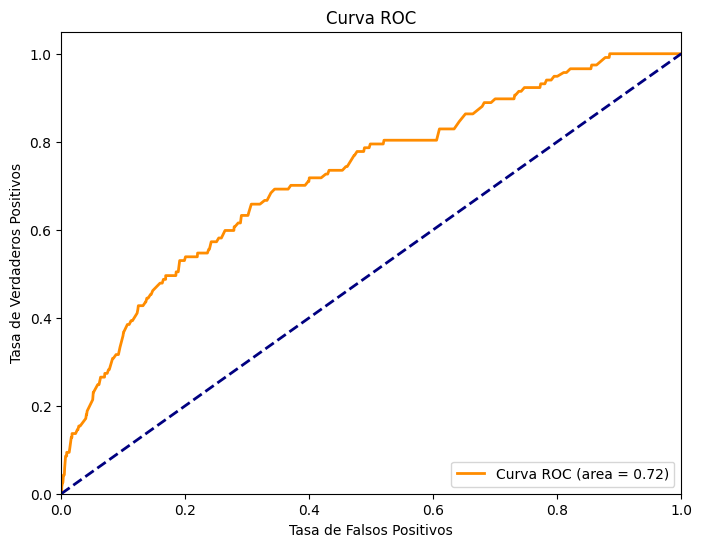

In [102]:
best_model = xgb.XGBClassifier(
    n_estimators=850,
    learning_rate=0.1,
    max_depth=2,
    random_state=42,
    n_jobs=-1,
)

best_model.fit(X_train, y_train)

# Predicciones en el conjunto de prueba (test)
test_predictions = best_model.predict_proba(X_val)[:, 1]

# Curva ROC
fpr, tpr, _ = roc_curve(y_val, test_predictions)
roc_auc = auc(fpr, tpr)

plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Curva ROC (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')
plt.show()



Vemos que la curva ROC representa una evaluación del modelo algo pobre todavía, también normal pues estamos con datos tabulares.

Podemos ver las métricas que tiene este modelo en sus predicciones.

In [103]:


# Calcular las métricas de evaluación
y_pred = best_model.predict(X_val)
accuracy = accuracy_score(y_val, y_pred)
precision = precision_score(y_val, y_pred)
recall = recall_score(y_val, y_pred)
f1 = f1_score(y_val, y_pred)
conf_matrix = confusion_matrix(y_val, y_pred)

# Crear un DataFrame con las métricas
metrics_df = pd.DataFrame({
    'Metrica': ['Accuracy', 'Precision', 'Recall', 'F1 Score'],
    'Valor': [accuracy, precision, recall, f1]
})

# Imprimir las métricas
metrics_df.head()


,Metrica,Valor
0,Accuracy,0.982342
1,Precision,0.500000
2,Recall,0.008547
3,F1 Score,0.016807


Y el informe de clasificación con la mmatriz de confunsión es:

In [104]:
# Calcular las métricas de evaluación
y_pred = best_model.predict(X_val)
conf_matrix = confusion_matrix(y_val, y_pred)

# Crear un informe de clasificación
classification_rep = classification_report(y_val, y_pred, target_names=['No Melanoma', 'Melanoma'], output_dict=True)

# Crear un DataFrame a partir del informe de clasificación
classification_df = pd.DataFrame(classification_rep).transpose()

# Imprimir el informe de clasificación formateado
print("Informe de Clasificación:")
print(classification_df.to_markdown())

# Imprimir la matriz de confusión formateada
print('\nMatriz de Confusión:')
confusion_df = pd.DataFrame(conf_matrix, columns=['Predicción No Melanoma', 'Predicción Melanoma'], index=['Real No Melanoma', 'Real Melanoma'])
print(confusion_df.to_markdown())

Informe de Clasificación:
|              |   precision |     recall |   f1-score |     support |
|:-------------|------------:|-----------:|-----------:|------------:|
| No Melanoma  |    0.982488 | 0.999846   |  0.991091  | 6509        |
| Melanoma     |    0.5      | 0.00854701 |  0.0168067 |  117        |
| accuracy     |    0.982342 | 0.982342   |  0.982342  |    0.982342 |
| macro avg    |    0.741244 | 0.504197   |  0.503949  | 6626        |
| weighted avg |    0.973968 | 0.982342   |  0.973888  | 6626        |

Matriz de Confusión:
|                  |   Predicción No Melanoma |   Predicción Melanoma |
|:-----------------|-------------------------:|----------------------:|
| Real No Melanoma |                     6508 |                     1 |
| Real Melanoma    |                      116 |                     1 |


Sigue siendo el modelo pobre, pues solamente predice un paciente con melanoma.

Ahora entrenamos el modelo con todo el conjunto con dicha mejor combinación, realizamos predicciones sobre el conjunto test de kaggle.

In [105]:
# Realiza predicciones en el conjunto de prueba (test)
test_predictions = best_model.predict_proba(test1)[:, 1]

# Puedes guardar las predicciones en un archivo CSV
submission_df = pd.DataFrame({'image_name': test['image_name'], 'target': test_predictions})
submission_df.to_csv('submission.csv', index=False)

Obtenemos un accuracy en Kaggle de 69.35%, en cierta manera igual que la validación cruzada repetida.


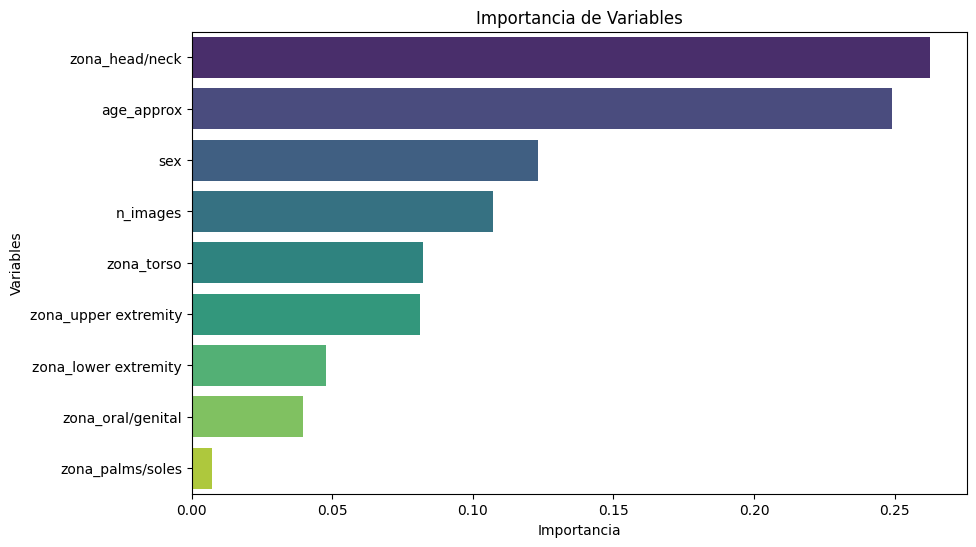

In [106]:
# Importancia de las variables POR HACER
feature_importance = pd.Series(best_model.feature_importances_, index=X_train.columns)
feature_importance = feature_importance.sort_values(ascending=False)
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importance, y=feature_importance.index, palette='viridis')
plt.xlabel('Importancia')
plt.ylabel('Variables')
plt.title('Importancia de Variables')
plt.show()

Tenemos que la localización de la cabeza y cuello con el sexo son las más importantes. La peor resulta ser la zona de las manos y plantas del pie, no aportando mucha información a la hora de predecir en el modelo de machine learning.

Vamos a guardar el modelo que hemos generado anteriormente, para poder productivizarlo más adelante en una aplicacion web.

In [101]:
# Guardar el modelo
joblib.dump(best_model, 'modelo_xgboost.pkl')


['modelo_xgboost.pkl']

Además, procederemos a descargar dicho archivo de forma local.

## 6.2.- Modelo Red Convolucional

Ahora para mejorar el modelo de aprendizaje profundo vamos a introducir una progresión sobre el ratio de aprendizaje, el conocido learning rate.

La elección de una tasa de aprendizaje adecuada es importante en el entrenamiento de modelos de aprendizaje automático por las siguientes razones:

- Convergencia eficiente: Una tasa de aprendizaje adecuada permite que el modelo converja hacia una solución óptima de manera eficiente.

- Generalización efectiva: Una tasa de aprendizaje equilibrada ayuda al modelo a aprender patrones relevantes en los datos y a generalizar bien a nuevos datos. Si la tasa de aprendizaje es demasiado alta, el modelo podría aprender el ruido en los datos (sobreajuste) en lugar de los patrones genuinos. Si es demasiado baja, el modelo podría subajustarse y no capturar todos los patrones relevantes en los datos.

- Evitar oscilaciones y divergencia: Una tasa de aprendizaje incorrecta puede causar oscilaciones en el proceso de entrenamiento, donde los valores de los pesos se vuelven erráticos, o incluso la divergencia, donde los valores de los pesos se vuelven extremadamente grandes y el modelo se vuelve inestable.

- Eficiencia computacional: El uso de una tasa de aprendizaje adecuada puede ahorrar tiempo y recursos computacionales.



Es por ello que vamos a definir la siguiente función para la progresión del learning rate para los modelo CNN, llamada **get_lr_callback**

In [116]:
def lrfn(epoch, BATCH_SIZE, REPLICAS):
    lr_start   = 0.000005
    lr_max     = 0.00000125 * REPLICAS * BATCH_SIZE
    lr_min     = 0.000001
    lr_ramp_ep = 5
    lr_sus_ep  = 0
    lr_decay   = 0.8

    if epoch < lr_ramp_ep:
        lr = (lr_max - lr_start) / lr_ramp_ep * epoch + lr_start
    elif epoch < lr_ramp_ep + lr_sus_ep:
        lr = lr_max
    else:
        lr = (lr_max - lr_min) * lr_decay**(epoch - lr_ramp_ep - lr_sus_ep) + lr_min

    return lr

def get_lr_callback(BATCH_SIZE, REPLICAS):
    lr_callback = tf.keras.callbacks.LearningRateScheduler(lambda epoch: lrfn(epoch, BATCH_SIZE, REPLICAS), verbose=False)
    return lr_callback

Con la función anterior controlamos cómo cambia la tasa de aprendizaje a lo largo del proceso de entrenamiento.

Con ello podemos optimizar del entrenamiento y tendremos una mejor convergencia.

Podemos apreciar que utilizamos REPLICAS y BATCH_SIZE.

En la siguiente gráfica vemos como progresa el learning rate conforme a las épocas.

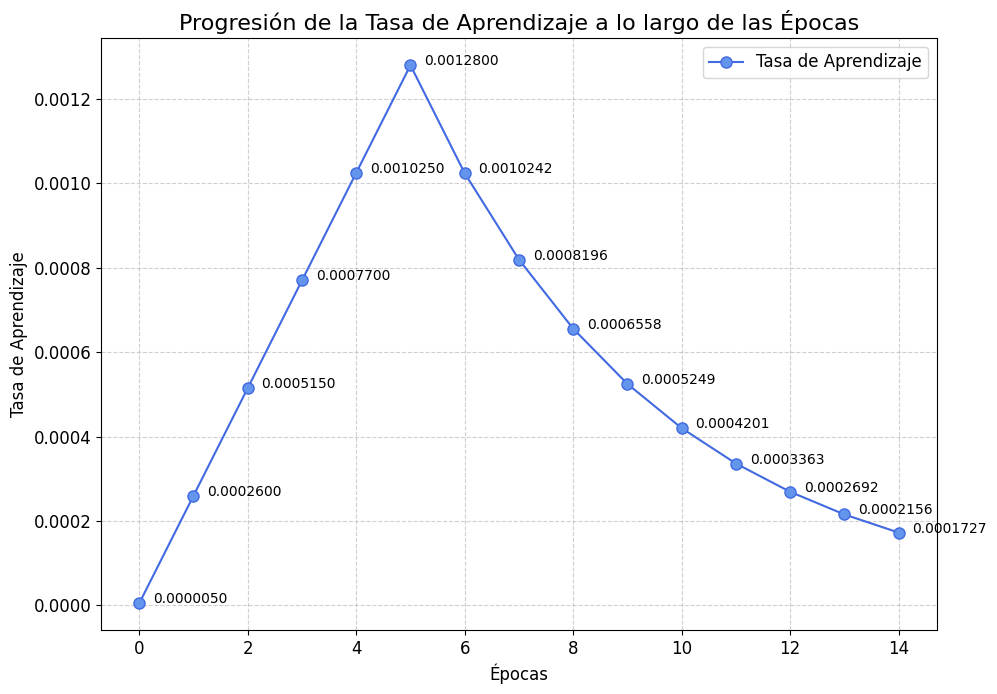

In [24]:
epochs = 15
# Calcular las tasas de aprendizaje para cada época
lr_rates = [lrfn(epoch, BATCH_SIZE, REPLICAS) for epoch in range(epochs)]
# Gráfico para Learning Rate
plt.figure(figsize=(10, 7))
plt.plot(range(epochs), lr_rates, marker='o', linestyle='-', color='royalblue', markersize=8, markerfacecolor='cornflowerblue', label='Tasa de Aprendizaje')
plt.title('Progresión de la Tasa de Aprendizaje a lo largo de las Épocas', fontsize=16)
plt.xlabel('Épocas', fontsize=12)
plt.ylabel('Tasa de Aprendizaje', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=12)

# Agregar etiquetas con los valores de tasa de aprendizaje a la derecha de los marcadores
for i, lr in enumerate(lr_rates):
    plt.annotate(f'{lr:.7f}', (i, lr), textcoords="offset points", xytext=(10, 0), ha='left', fontsize=10, color='black')

plt.tight_layout()
plt.tick_params(axis='both', labelsize=12)
plt.show()


Como podemos observar, la gráfica del Learning Rate que hemos ajustado es una técnica muy útil ya que:

- Arranque suave.

- Exploración eficaz.

- Convergencia rápida.

- Estabilidad.

- Escapar de problemas.

Por tanto, hacemos que la tasa de aprendizaje vaya creciendo en las primeras épocas y luego vaya disminuyendo poco a poco para poder llegar al mejor resultado.

Por otra parte, vamos a introducir unas mejoras para los modelos de aprendizaje profundo en la parte de aumento de datos, data augment, donde vamos a introducir las siguientes técnicas:

- Función para aplicar a la imagen rotación, corte, zoom y desplazamiento, cuya función se llama **transform**.
- Función de DROPOUT
- Función de GridMask.


#### Función Rotación, Corte, Zoom y Desplazamiento

Definimos dos funciones, una llamada **get_mat** que genera una matriz de transformación 3x3 que representa una combinación de transformaciones geométricas (rotación, corte, zoom y desplazamiento) que se aplicarán a una imagen. Esta matriz se utiliza posteriormente para transformar una imagen dada.

Luego se define la función **transformALL** que toma una imagen de entrada y aplica de manera aleatoria una serie de transformaciones geométricas y de píxeles utilizando la matriz de transformación generada por get_mat. Por último, devuelve la imagen transformada.

In [100]:
ROT_ = 180.0
SHR_ = 2.0
HZOOM_ = 8.0
WZOOM_ = 8.0
HSHIFT_ = 8.0
WSHIFT_ = 8.0

def get_mat(rotation, shear, height_zoom, width_zoom, height_shift, width_shift):

    # Convierte grados en radianes
    rotation = math.pi * rotation / 180.
    shear    = math.pi * shear    / 180.

    def get_3x3_mat(lst):
        return tf.reshape(tf.concat([lst],axis=0), [3,3])

    # Matriz de Rotación
    c1   = tf.math.cos(rotation)
    s1   = tf.math.sin(rotation)
    one  = tf.constant([1],dtype='float32')
    zero = tf.constant([0],dtype='float32')

    rotation_matrix = get_3x3_mat([c1,   s1,   zero,
                                   -s1,  c1,   zero,
                                   zero, zero, one])
    # Matriz de Corte
    c2 = tf.math.cos(shear)
    s2 = tf.math.sin(shear)

    shear_matrix = get_3x3_mat([one,  s2,   zero,
                                zero, c2,   zero,
                                zero, zero, one])
    # Matriz de Zoom
    zoom_matrix = get_3x3_mat([one/height_zoom, zero,           zero,
                               zero,            one/width_zoom, zero,
                               zero,            zero,           one])
    # Matriz de Desplazamiento
    shift_matrix = get_3x3_mat([one,  zero, height_shift,
                                zero, one,  width_shift,
                                zero, zero, one])

    return K.dot(K.dot(rotation_matrix, shear_matrix),
                 K.dot(zoom_matrix,     shift_matrix))


def transformALL(image, DIM=256):

    XDIM = DIM%2

    rot = ROT_ * tf.random.normal([1], dtype='float32')
    shr = SHR_ * tf.random.normal([1], dtype='float32')
    h_zoom = 1.0 + tf.random.normal([1], dtype='float32') / HZOOM_
    w_zoom = 1.0 + tf.random.normal([1], dtype='float32') / WZOOM_
    h_shift = HSHIFT_ * tf.random.normal([1], dtype='float32')
    w_shift = WSHIFT_ * tf.random.normal([1], dtype='float32')

    # Obtiene la matriz de transformación a partir de los valores anteriores
    m = get_mat(rot,shr,h_zoom,w_zoom,h_shift,w_shift)

    # Lista de índices de píxeles de destino
    x   = tf.repeat(tf.range(DIM//2, -DIM//2,-1), DIM)
    y   = tf.tile(tf.range(-DIM//2, DIM//2), [DIM])
    z   = tf.ones([DIM*DIM], dtype='int32')
    idx = tf.stack( [x,y,z] )

    # Giro de píxeledes de destino a píxeles de origen
    idx2 = K.dot(m, tf.cast(idx, dtype='float32'))
    idx2 = K.cast(idx2, dtype='int32')
    idx2 = K.clip(idx2, -DIM//2+XDIM+1, DIM//2)

    # Encontrar valores de píxeles de origen
    idx3 = tf.stack([DIM//2-idx2[0,], DIM//2-1+idx2[1,]])
    d    = tf.gather_nd(image, tf.transpose(idx3))

    return tf.reshape(d,[DIM, DIM,3])

Y con el siguiente código podemos ver como se aplica esta función a las imágenes del cáncer del melanoma. A la derecha se encuentra la imagen original y a la izquierda la transformada.

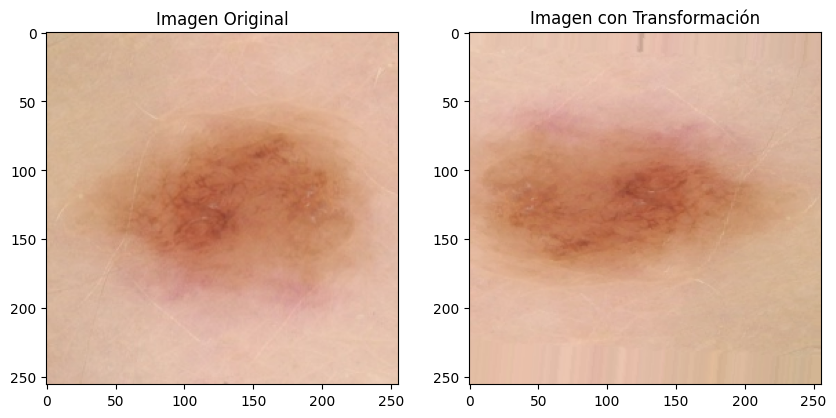

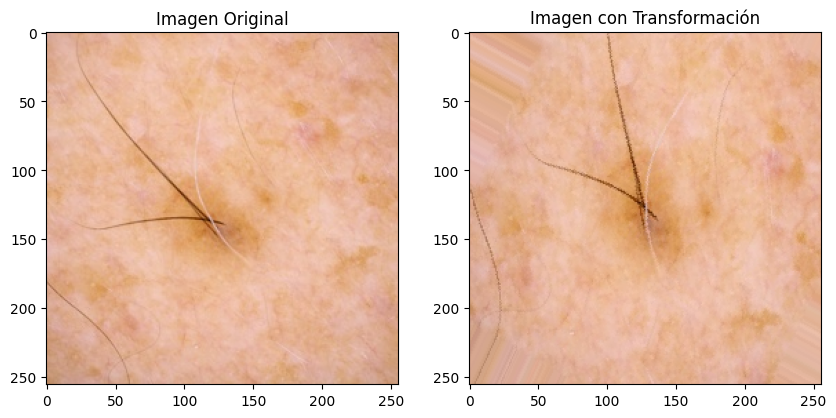

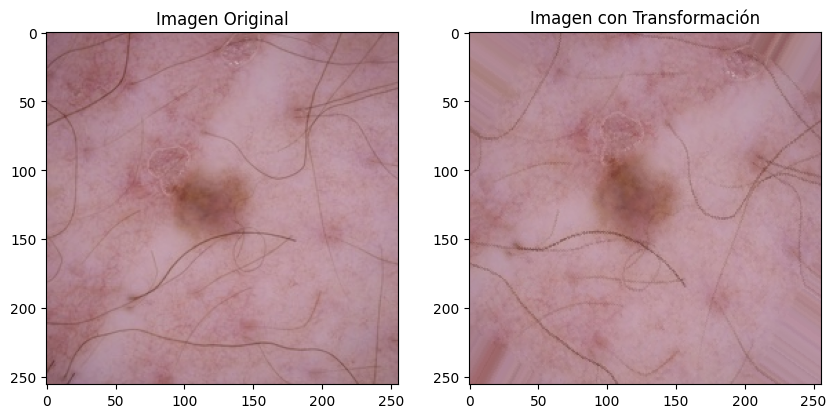

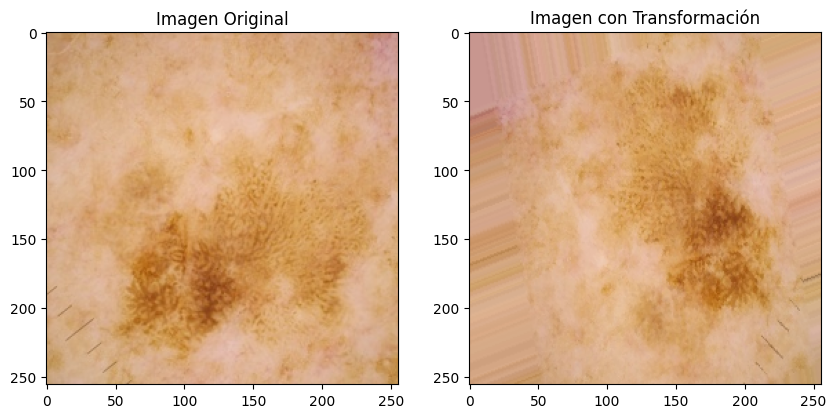

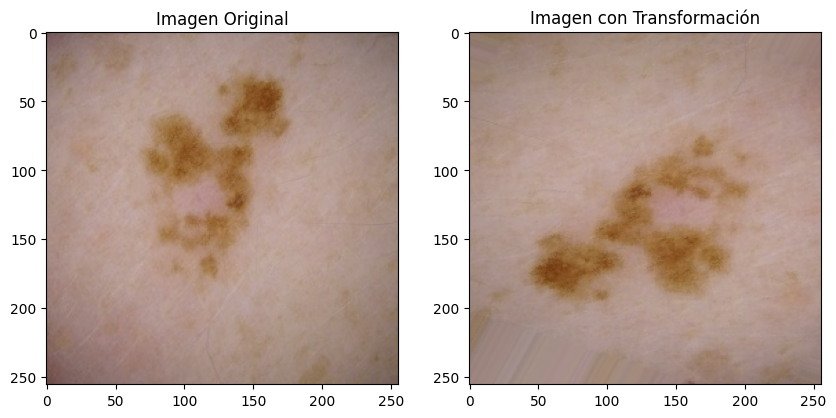

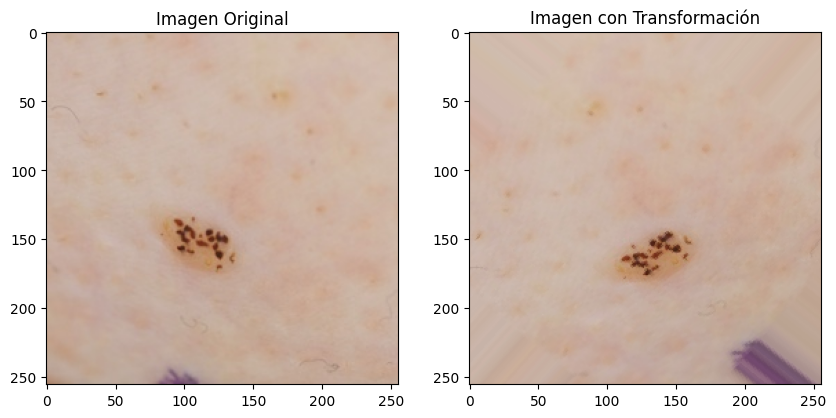

Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence


In [101]:
# Función para decodificar un archivo .tfrec
def decode_example(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.int64),
    }
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, [256, 256])  # Ajusta el tamaño según tus necesidades
    label = tf.cast(example['target'], tf.int32)
    return image, label

# Ruta al archivo .tfrec en Google Cloud Storage
tfrec_file = "gs://manu-ucmbucket/DatasetKaggleTFM_resized/train09-2071.tfrec"

# Configuración para leer el archivo .tfrec
options = tf.data.Options()
options.experimental_deterministic = False
ignore_order = tf.data.Options()
ignore_order.experimental_deterministic = False

# Función para decodificar y procesar un ejemplo de un archivo .tfrec
def read_and_process_tfrecord(example):
    image, label = decode_example(example)

    # Aplica la función de dropout a la imagen
    image_transform = transformALL(image, 256)

    return image, image_transform, label

# Lee el archivo .tfrec y aplica la función de dropout a 6 imágenes
num_images_to_read = 6
dataset = tf.data.TFRecordDataset([tfrec_file], num_parallel_reads=AUTO)
dataset = dataset.with_options(options)
dataset = dataset.with_options(ignore_order)

# Aplica la función de decodificación y dropout
dataset = dataset.map(read_and_process_tfrecord, num_parallel_calls=AUTO)

# Muestra las imágenes originales y las imágenes con dropout
for i, (original_image, image_transform, label) in enumerate(dataset.take(num_images_to_read)):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f"Imagen Original")
    plt.imshow(original_image.numpy())

    plt.subplot(1, 2, 2)
    plt.title(f"Imagen con Transformación")
    plt.imshow(image_transform.numpy())

    plt.show()


Como podemos ver como la función de transformALL aplica a la imáganes una rotación, desplazamiento, etc.. para poder obtener "diferentes" imágenes interpretadas por el modelo de aprendizaje profundo y así poder obtener mejor resultados.

#### DROPOUT

Esta es otra técnica que puede ser útil para los modelos de aprendizaje profundo y aumenta la robustez de un modelo. Toma una imagen de entrada y aplica una operación de "dropout" con cierta probabilidad PROBABILITY, eliminando CT cuadrados de la imagen de tamaño SZ * DIM. La función devuelve la imagen con estas regiones eliminadas.

In [102]:
droprate = 0.5  # Entre 0 y 1
dropct = 4      # Puede ralentizar el entrenamiento si CT>16
dropsize = 0.2  # Entre 0 y 1


def dropout(image, DIM=256, PROBABILIDAD=0.75, CT=8, SZ=0.2):

    # APLICAR DROPOUT CON LA PROBABILIDAD DEFINIDA ANTERIORMENTE
    P = tf.cast(tf.random.uniform([], 0, 1) < PROBABILIDAD, tf.int32)
    if (P == 0) | (CT == 0) | (SZ == 0):
        return image

    for k in range(CT):
        # ELEGIR UBICACIÓN ALEATORIA
        x = tf.cast(tf.random.uniform([], 0, DIM), tf.int32)
        y = tf.cast(tf.random.uniform([], 0, DIM), tf.int32)

        # CALCULAR EL CUADRADO
        WIDTH = tf.cast(SZ * DIM, tf.int32) * P
        ya = tf.math.maximum(0, y - WIDTH // 2)
        yb = tf.math.minimum(DIM, y + WIDTH // 2)
        xa = tf.math.maximum(0, x - WIDTH // 2)
        xb = tf.math.minimum(DIM, x + WIDTH // 2)

        # ELIMINAR LA IMAGEN
        one = image[ya:yb, 0:xa, :]
        two = tf.zeros([yb - ya, xb - xa, 3])
        three = image[ya:yb, xb:DIM, :]
        middle = tf.concat([one, two, three], axis=1)
        image = tf.concat([image[0:ya, :, :], middle, image[yb:DIM, :, :]], axis=0)

    # TRUCO DE REFORMA PARA QUE EL COMPILADOR DE TPU CONOZCA LA FORMA DEL TENSOR DE SALIDA
    image = tf.reshape(image, [DIM, DIM, 3])
    return image


Con la siguiente función vemos como se aplica esta técnica a las imágenes que tenemos.

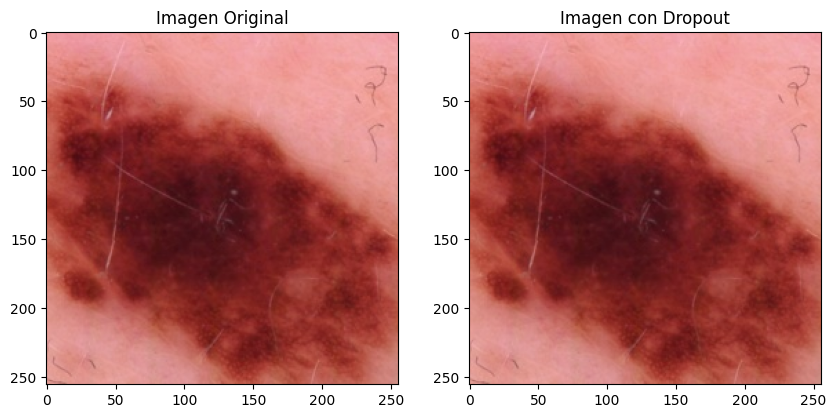

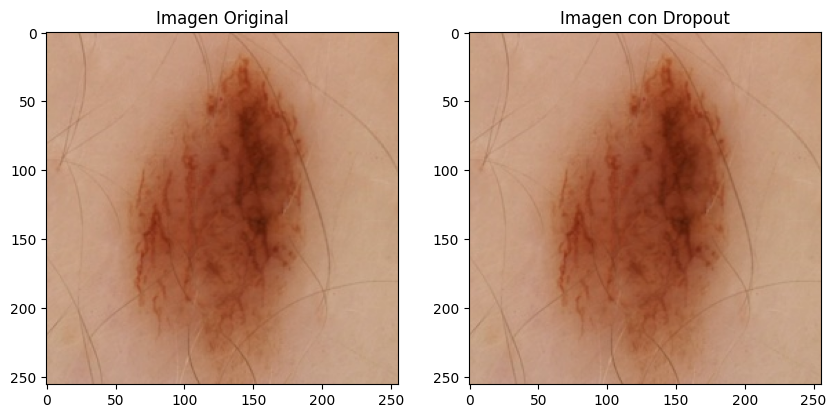

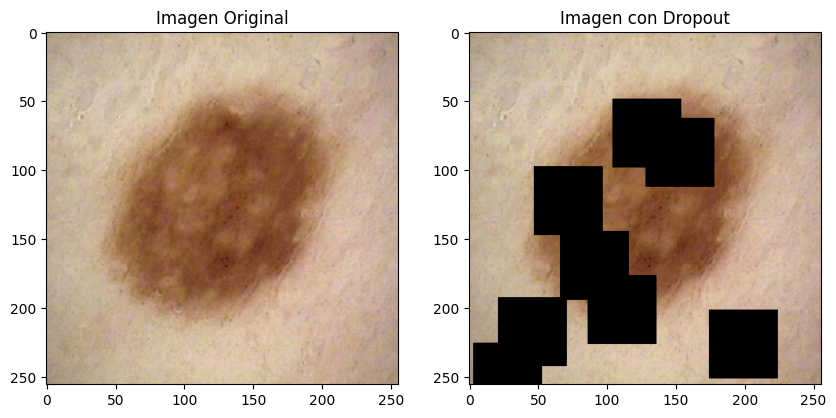

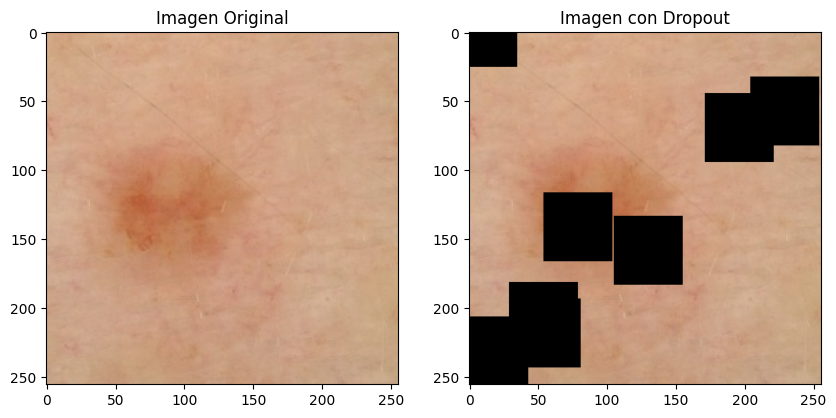

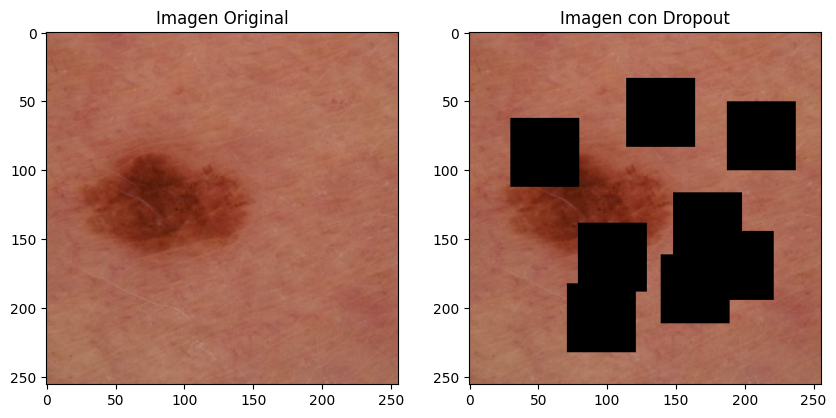

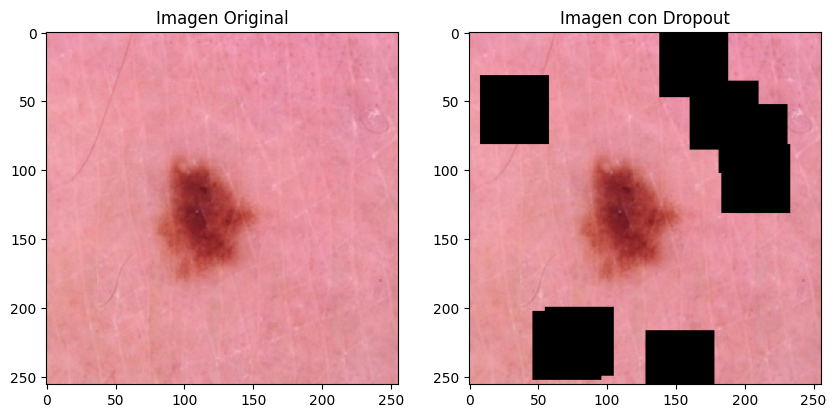

Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence


In [104]:

# Función para decodificar un archivo .tfrec
def decode_example(example):
    features = {
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.int64),
    }
    example = tf.io.parse_single_example(example, features)
    image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.cast(image, tf.float32) / 255.0
    image = tf.image.resize(image, [256, 256])  # Ajusta el tamaño según tus necesidades
    label = tf.cast(example['target'], tf.int32)
    return image, label

# Ruta al archivo .tfrec en Google Cloud Storage
tfrec_file = "gs://manu-ucmbucket/DatasetKaggleTFM_resized/train14-2071.tfrec"

# Configuración para leer el archivo .tfrec
options = tf.data.Options()
options.experimental_deterministic = False
ignore_order = tf.data.Options()
ignore_order.experimental_deterministic = False

# Función para decodificar y procesar un ejemplo de un archivo .tfrec
def read_and_process_tfrecord(example):
    image, label = decode_example(example)

    # Aplica la función de dropout a la imagen
    image_with_dropout = dropout(image)

    return image, image_with_dropout, label

# Lee el archivo .tfrec y aplica la función de dropout a 6 imágenes
num_images_to_read = 6
dataset = tf.data.TFRecordDataset([tfrec_file], num_parallel_reads=AUTO)
dataset = dataset.with_options(options)
dataset = dataset.with_options(ignore_order)

# Aplica la función de decodificación y dropout
dataset = dataset.map(read_and_process_tfrecord, num_parallel_calls=AUTO)

# Muestra las imágenes originales y las imágenes con dropout
for i, (original_image, image_with_dropout, label) in enumerate(dataset.take(num_images_to_read)):
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f"Imagen Original")
    plt.imshow(original_image.numpy())

    plt.subplot(1, 2, 2)
    plt.title(f"Imagen con Dropout")
    plt.imshow(image_with_dropout.numpy())

    plt.show()


Observamos como se van generando cuadrados negros en la imagen de una forma aleatoria tanto a la propia imagen como el conjunto de imágenes en sí.

#### GridMask

Esta función es algo similair a DROPOUT. También elimina cuadrados de la imagen, pero no lo hace de forma aleatoria sino que genera una cuadrícula de cuadrados eliminados de la imagen para representarla. Estos cuadrados pueden estar rotados o no conforme a toda la imagen.

Vamos a definir un diccionario de argumentos que utilizaremos en la función de **GridMask**

In [105]:
AugParams = {
    'd1' : 50,
    'd2': 80,
    'rotate' : 45,
    'ratio' : 0.5
}

Definimos todas la funciones necesarias.

In [107]:
# Función para aplicar una transformación de coordenadas a una imagen
def transform1(image, inv_mat, image_shape):
    # image: imagen de entrada
    # inv_mat: matriz de transformación inversa
    # image_shape: dimensiones de la imagen (alto, ancho, canales)

    # Extraer dimensiones de la imagen
    h, w, c = image_shape

    # Calcular el centro de la imagen
    cx, cy = w // 2, h // 2

    # Generar coordenadas nuevas para el muestreo
    new_xs = tf.repeat(tf.range(-cx, cx, 1), h)
    new_ys = tf.tile(tf.range(-cy, cy, 1), [w])
    new_zs = tf.ones([h * w], dtype=tf.int32)

    # Aplicar la matriz de transformación inversa a las coordenadas nuevas
    old_coords = tf.matmul(inv_mat, tf.cast(tf.stack([new_xs, new_ys, new_zs]), tf.float32))

    # Redondear las coordenadas mapeadas a las coordenadas de píxeles en la imagen original
    old_coords_x, old_coords_y = tf.round(old_coords[0, :] + w // 2), tf.round(old_coords[1, :] + h // 2)

    # Crear máscaras para coordenadas fuera de los límites de la imagen
    clip_mask_x = tf.logical_or(old_coords_x < 0, old_coords_x > w - 1)
    clip_mask_y = tf.logical_or(old_coords_y < 0, old_coords_y > h - 1)
    clip_mask = tf.logical_or(clip_mask_x, clip_mask_y)

    # Filtrar las coordenadas fuera de los límites
    old_coords_x = tf.boolean_mask(old_coords_x, tf.logical_not(clip_mask))
    old_coords_y = tf.boolean_mask(old_coords_y, tf.logical_not(clip_mask))
    new_coords_x = tf.boolean_mask(new_xs + cx, tf.logical_not(clip_mask))
    new_coords_y = tf.boolean_mask(new_ys + cy, tf.logical_not(clip_mask))

    # Preparar las coordenadas en el formato adecuado
    old_coords = tf.cast(tf.stack([old_coords_y, old_coords_x]), tf.int32)
    new_coords = tf.cast(tf.stack([new_coords_y, new_coords_x]), tf.int64)

    # Muestrear los valores de píxeles en la imagen original
    rotated_image_values = tf.gather_nd(image, tf.transpose(old_coords))

    # Inicializar una lista para los canales transformados
    rotated_image_channel = list()

    # Procesar cada canal por separado
    for i in range(c):
        vals = rotated_image_values[:, i]

        # Crear una representación dispersa (sparse) de los valores muestreados
        sparse_channel = tf.SparseTensor(tf.transpose(new_coords), vals, [h, w])

        # Convertir la representación dispersa en una matriz densa y apilarla en la lista
        rotated_image_channel.append(tf.sparse.to_dense(sparse_channel, default_value=0, validate_indices=False))

    # Apilar los canales transformados y transponerlos para obtener la imagen final
    return tf.transpose(tf.stack(rotated_image_channel), [1, 2, 0])

# Función para realizar una rotación aleatoria de la imagen
def random_rotate(image, angle, image_shape):
    # image: imagen de entrada
    # angle: ángulo de rotación aleatorio
    # image_shape: dimensiones de la imagen (alto, ancho, canales)

    # Función para calcular la matriz de transformación inversa para la rotación
    def get_rotation_mat_inv(angle):
        # Convertir el ángulo a radianes
        angle = math.pi * angle / 180

        cos_val = tf.math.cos(angle)
        sin_val = tf.math.sin(angle)
        one = tf.constant([1], tf.float32)
        zero = tf.constant([0], tf.float32)

        # Crear la matriz de transformación inversa
        rot_mat_inv = tf.concat([cos_val, sin_val, zero,
                                -sin_val, cos_val, zero,
                                zero, zero, one], axis=0)
        rot_mat_inv = tf.reshape(rot_mat_inv, [3, 3])

        return rot_mat_inv

    # Generar un ángulo de rotación aleatorio
    angle = float(angle) * tf.random.normal([1], dtype='float32')

    # Calcular la matriz de transformación inversa
    rot_mat_inv = get_rotation_mat_inv(angle)

    # Aplicar la transformación a la imagen y devolver la imagen rotada
    return transform1(image, rot_mat_inv, image_shape)

# Función para generar una máscara de cuadrícula (Grid Mask)
def GridMask(image_height, image_width, d1, d2, rotate_angle=1, ratio=0.5):
    # image_height: alto de la imagen
    # image_width: ancho de la imagen
    # d1: valor mínimo para el tamaño de la máscara
    # d2: valor máximo para el tamaño de la máscara
    # rotate_angle: ángulo de rotación
    # ratio: relación entre el tamaño de la máscara y el tamaño de la imagen

    # Calcular el tamaño de la máscara y otros parámetros aleatorios
    h, w = image_height, image_width
    hh = int(np.ceil(np.sqrt(h * h + w * w)))
    hh = hh + 1 if hh % 2 == 1 else hh
    d = tf.random.uniform(shape=[], minval=d1, maxval=d2, dtype=tf.int32)
    l = tf.cast(tf.cast(d, tf.float32) * ratio + 0.5, tf.int32)

    st_h = tf.random.uniform(shape=[], minval=0, maxval=d, dtype=tf.int32)
    st_w = tf.random.uniform(shape=[], minval=0, maxval=d, dtype=tf.int32)

    y_ranges = tf.range(-1 * d + st_h, -1 * d + st_h + l)
    x_ranges = tf.range(-1 * d + st_w, -1 * d + st_w + l)

    for i in range(0, hh // d + 1):
        s1 = i * d + st_h
        s2 = i * d + st_w
        y_ranges = tf.concat([y_ranges, tf.range(s1, s1 + l)], axis=0)
        x_ranges = tf.concat([x_ranges, tf.range(s2, s2 + l)], axis=0)

    x_clip_mask = tf.logical_or(x_ranges < 0, x_ranges > hh - 1)
    y_clip_mask = tf.logical_or(y_ranges < 0, y_ranges > hh - 1)
    clip_mask = tf.logical_or(x_clip_mask, y_clip_mask)

    x_ranges = tf.boolean_mask(x_ranges, tf.logical_not(clip_mask))
    y_ranges = tf.boolean_mask(y_ranges, tf.logical_not(clip_mask))

    hh_ranges = tf.tile(tf.range(0, hh), [tf.cast(tf.reduce_sum(tf.ones_like(x_ranges)), tf.int32)])
    x_ranges = tf.repeat(x_ranges, hh)
    y_ranges = tf.repeat(y_ranges, hh)

    y_hh_indices = tf.transpose(tf.stack([y_ranges, hh_ranges]))
    x_hh_indices = tf.transpose(tf.stack([hh_ranges, x_ranges]))

    y_mask_sparse = tf.SparseTensor(tf.cast(y_hh_indices, tf.int64), tf.zeros_like(y_ranges), [hh, hh])
    y_mask = tf.sparse.to_dense(y_mask_sparse, 1, False)

    x_mask_sparse = tf.SparseTensor(tf.cast(x_hh_indices, tf.int64), tf.zeros_like(x_ranges), [hh, hh])
    x_mask = tf.sparse.to_dense(x_mask_sparse, 1, False)

    mask = tf.expand_dims(tf.clip_by_value(x_mask + y_mask, 0, 1), axis=-1)

    mask = random_rotate(mask, rotate_angle, [hh, hh, 1])
    mask = tf.image.crop_to_bounding_box(mask, (hh - h) // 2, (hh - w) // 2, image_height, image_width)

    return mask

# Función para aplicar la máscara de cuadrícula a una imagen
def apply_grid_mask(image, image_shape):
    # image: imagen de entrada
    # image_shape: dimensiones de la imagen (alto, ancho, canales)

    # Generar una máscara de cuadrícula
    mask = GridMask(image_shape[0],
                    image_shape[1],
                    AugParams['d1'],
                    AugParams['d2'],
                    AugParams['rotate'],
                    AugParams['ratio'])

    # Aplicar la máscara a la imagen y devolver la imagen con la máscara
    if image_shape[-1] == 3:
        mask = tf.concat([mask, mask, mask], axis=-1)

    return image * tf.cast(mask, tf.uint8)


Ahora vamos aplicar estas transformaciones a las imágenes para ver que resultados obtenemos.

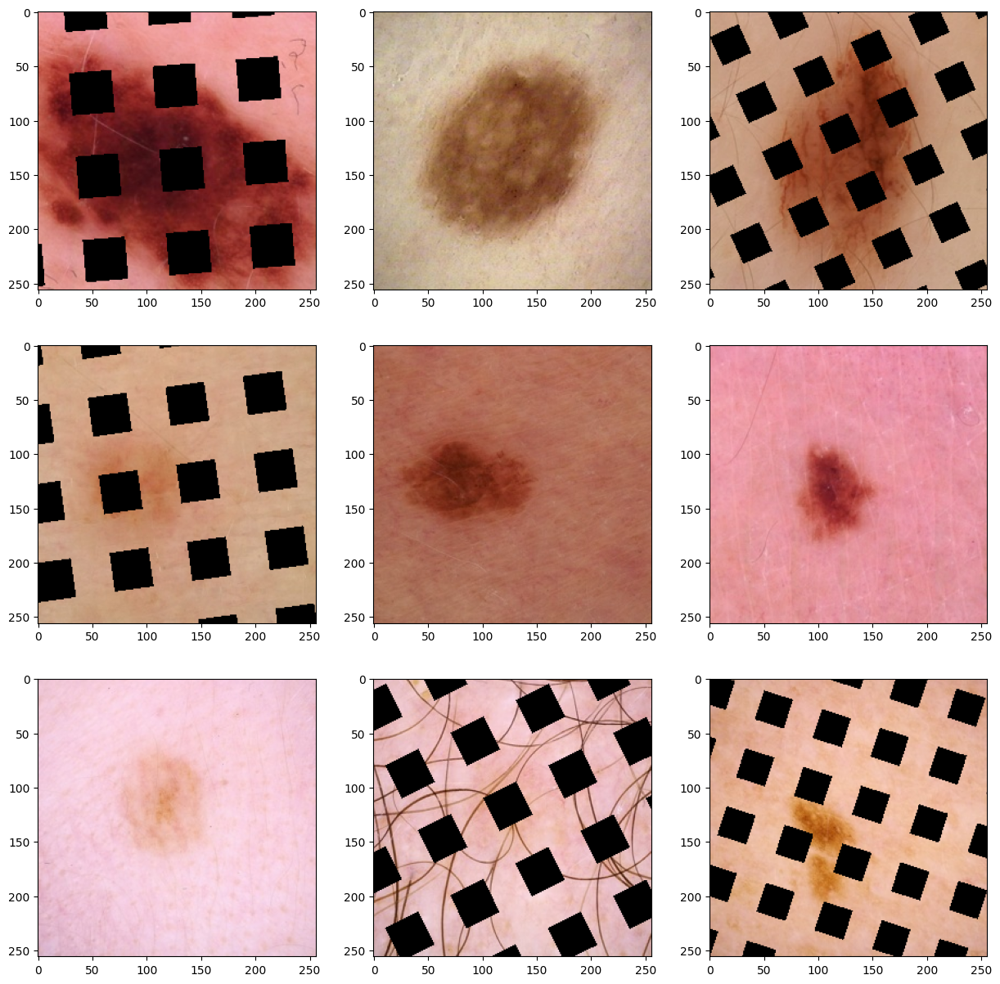

In [31]:
def augmentation(image):

    if tf.random.uniform(shape=[], minval=0.0, maxval=1.0) >=0.5:
        image = apply_grid_mask(image, (256, 256, 3))
    return tf.cast(image, tf.uint8)

def decoded_example(example):
    example = tf.io.parse_single_example(example, { "image" : tf.io.FixedLenFeature([], tf.string) })
    bits = example['image']
    image = tf.image.decode_jpeg(bits)
    return image

ruta_tfrec = 'gs://manu-ucmbucket/DatasetKaggleTFM_resized/train14-2071.tfrec'

ds = tf.data.TFRecordDataset(ruta_tfrec)
ds = ds.map(decoded_example)
ds = ds.map(augmentation)
ds = ds.batch(9)

images = next(iter(ds))
images = images.numpy()
plt.figure(figsize=(15,15))
col = 3
row = 3
for idx, image in enumerate(images):
    plt.subplot(row, col, idx+1)
    plt.imshow(image)
plt.show()

Se puede observar como se aplica de forma aleatoria a las imágenes y a la propia imagen en sí, la máscara de cuadrados negros. Además, pueden estar en cualquier rotación y su número también varía.

# 7.- Transfer Learning

En esta sección vamos a utilizar Transfer Learning para poder mejorar nuestras predicciones, una técnica muy útil en el aprendizaje profundo.

El transfer learning, o aprendizaje por transferencia, es una técnica en el campo del aprendizaje automático que se basa en la idea de reutilizar el conocimiento adquirido en una tarea previa para mejorar el rendimiento en una tarea relacionada. Esto se logra ajustando un modelo de aprendizaje automático pre-entrenado en una tarea inicial, llamada tarea fuente, y luego transfiriendo este conocimiento a una tarea objetivo que podría tener datos y características diferentes, pero que comparte ciertas similitudes conceptuales o estructurales con la tarea fuente.

Vamos a utilizar los siguientes modelos de Transfer Learning:

- DenseNet121
- ResNet50
- Xception
- EfficientNetB5

Vamos a crear un código para que se vaya introduciendo dichos modelos, se vayan entrenando y realizando el **fit** para poder obtener las métricas que queremos, accuracy y focal loss.

Los modelos serán sencillos, usando como capa extra **GlobalAveragePooling2D** que reduce la cantidad de parámetros en la red, lo que puede ayudar a prevenir el sobreajuste y acelerar el entrenamiento de la red.


 Por otro lado, los pesos de "imagenet" que es una gran base de datos de imágenes con millones de imágenes etiquetadas en miles de categorías diferentes.

 Por último, introducimos las métricas de Precision y Recall en nuestros modelos.



In [46]:
def create_model(model_name, input_shape=(256, 256, 3)):
    with strategy.scope():
        base_model = None

        if model_name == 'DenseNet121':
            base_model = DenseNet121(weights='imagenet', include_top=False)
        elif model_name == 'ResNet50':
            base_model = ResNet50(weights='imagenet', include_top=False)
        elif model_name == 'Xception':
            base_model = Xception(weights='imagenet', include_top=False)
        elif model_name == 'EfficientNetB5':
            base_model = EfficientNetB5(weights='imagenet', include_top=False)

        model = tf.keras.Sequential([
            base_model,
            layers.GlobalAveragePooling2D(),
            layers.Dense(1, activation='sigmoid')
        ])

        model.compile(
            optimizer='adam',
            loss=focal_loss,
            metrics=['accuracy', tf.keras.metrics.Precision(name = 'precision'), tf.keras.metrics.Recall(name = 'recall')]
        )

        return model

# Lista de nombres de modelos
model_names = ['DenseNet121', 'ResNet50', 'Xception', 'EfficientNetB5']

# Crear modelos y agregarlos a la lista "models"
models = [(model_name, create_model(model_name)) for model_name in model_names]

115263384/115263384 [==============================] - 1s 0us/step


Ahora vamos a empezar a iterar sobre estos cuatro modelos. Introducimos 15 épocas de entrenamiento, el learning rate definido en la sección anterior y dos métricas más que nos ayudarán, que son importantes para entener también como de bueno son para predecir el cáncer de piel, el melanoma.

In [47]:
# Crear una lista para almacenar historiales, las épocas y el Learning Rate
histories = []
EPOCHS = 15
lr_callback = get_lr_callback(BATCH_SIZE, REPLICAS)

# Crear una lista para almacenar las métricas
metrics_list = []

# Iterar a través de los modelos y entrenarlos
for model_name in model_names:

    print(f"Training {model_name}...")

    # Crear y compilar el modelo
    model = create_model(model_name)

    # Entrenar el modelo y guardar el historial
    history = model.fit(training_dataset, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                    validation_data=validation_dataset,
                    validation_steps = validation_steps,
                    callbacks = [lr_callback]
    )

    # Guardar el historial en la lista de historiales
    histories.append(history)

    # Extraer las métricas y agregarlas a la lista de métricas
    for epoch, metrics in enumerate(history.history['loss']):
        metrics_dict = {
            'Model': model_name,
            'Epoch': epoch + 1,
            'Loss': metrics,
            'Accuracy': history.history['accuracy'][epoch],
            'Precision': history.history['precision'][epoch],
            'Recall': history.history['recall'][epoch],
        }
        metrics_list.append(metrics_dict)


    print('Computing predictions...')
    test_images_ds = test_dataset.map(lambda image, idnum: image)
    probabilities = model.predict(test_images_ds).flatten()
    print(probabilities)

    print('Generating submission.csv file...')
    test_ids_ds = test_dataset.map(lambda image, idnum: idnum).unbatch()
    test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U') # all in one batch

    output_filename = f'{model_name}_predictions.csv'

    np.savetxt(output_filename, np.rec.fromarrays([test_ids, probabilities]), fmt=['%s', '%f'],
           delimiter=',', header='image_name,target', comments='')

    print("\n")

# Convertir la lista de métricas en un DataFrame
metrics_df = pd.DataFrame(metrics_list)


Training DenseNet121...
Epoch 1/15
210/210 [==============================] - 208s 346ms/step - loss: 1.5173 - accuracy: 0.3228 - precision: 0.0196 - recall: 0.7714 - val_loss: 1.7110 - val_accuracy: 0.0946 - val_precision: 0.0186 - val_recall: 0.9211 - lr: 5.0000e-06
Epoch 2/15
210/210 [==============================] - 53s 252ms/step - loss: 0.1036 - accuracy: 0.9809 - precision: 0.1385 - recall: 0.0193 - val_loss: 0.0956 - val_accuracy: 0.9813 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 2.6000e-04
Epoch 3/15
210/210 [==============================] - 52s 248ms/step - loss: 0.0924 - accuracy: 0.9824 - precision: 0.2381 - recall: 0.0108 - val_loss: 0.1047 - val_accuracy: 0.9813 - val_precision: 0.4000 - val_recall: 0.0175 - lr: 5.1500e-04
Epoch 4/15
210/210 [==============================] - 50s 237ms/step - loss: 0.0899 - accuracy: 0.9820 - precision: 0.3529 - recall: 0.0125 - val_loss: 0.1026 - val_accuracy: 0.9798 - val_precision: 0.1429 - val_recall: 0.0175 - lr: 7.

Mostramos la cabecera del dataframe que hemos generado para ver los valores de las métricas que hemos obtenido. Tendremos el nombre de los modelos con las métricas que hemos ido generando en cada paso del entrenamiento.

In [49]:
metrics_df.head()

,Model,Epoch,Loss,Accuracy,Precision,Recall
0,DenseNet121,1,1.517264,0.322805,0.019559,0.771368
1,DenseNet121,2,0.103627,0.980915,0.138462,0.019313
2,DenseNet121,3,0.092373,0.982403,0.238095,0.010823
3,DenseNet121,4,0.089928,0.981994,0.352941,0.012526
4,DenseNet121,5,0.087295,0.982403,0.111111,0.002146




Vamos a mostrar también los gráficos de progreso de los cuatro modelos con respecto el accuracy y focal loss.

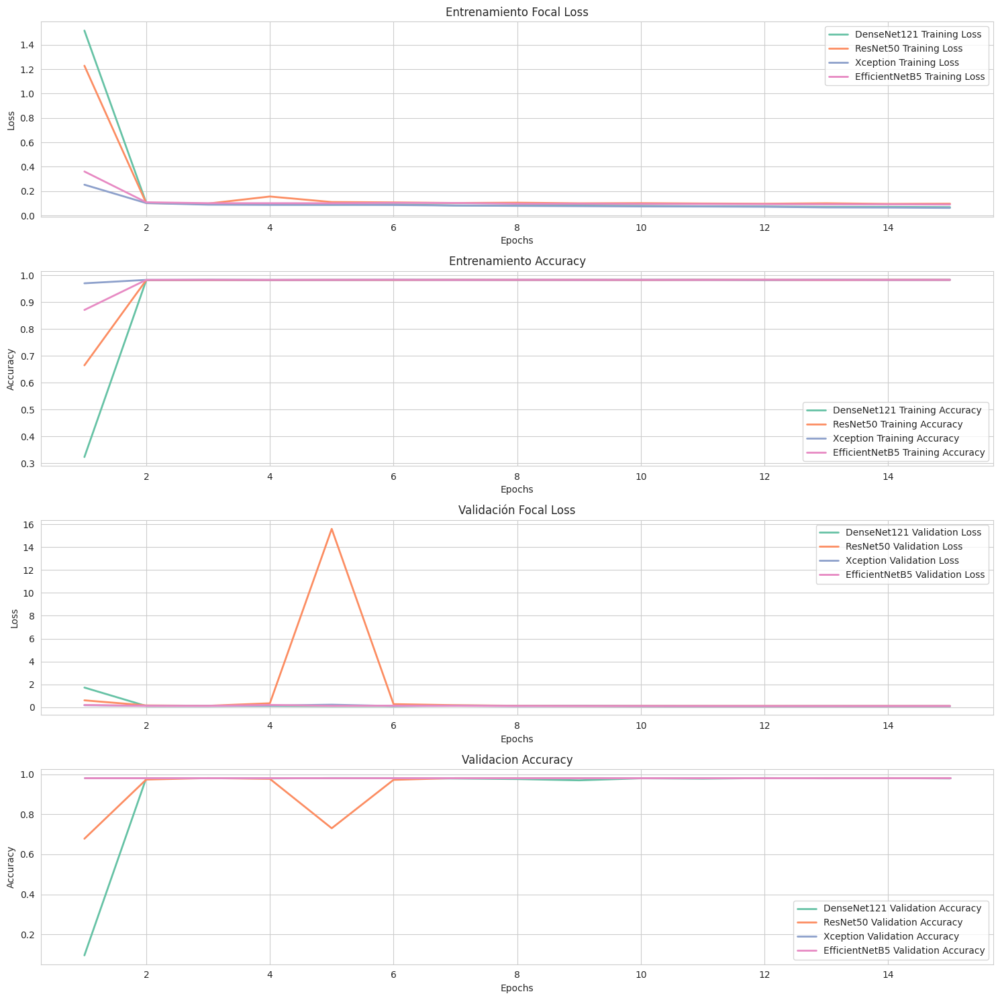

In [48]:
# Estilo de los gráficos (puedes personalizarlo más si lo deseas)
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Crear subgráficos para los gráficos
fig, axs = plt.subplots(4, 1, figsize=(15, 15))

# Iterar a través de los modelos
for model_name, history in zip(model_names, histories):
    # Extraer las métricas de loss y accuracy para training y validation
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    # Crear una lista de epochs
    epochs = range(1, len(loss) + 1)

    # Graficar Focal Loss en el primer subplot (Training)
    axs[0].plot(epochs, loss, label=f'{model_name} Training Loss', linewidth=2)
    axs[0].set_title('Entrenamiento Focal Loss')
    axs[0].set_xlabel('Epochs')
    axs[0].set_ylabel('Loss')
    axs[0].legend()

    # Graficar Accuracy en el segundo subplot (Training)
    axs[1].plot(epochs, accuracy, label=f'{model_name} Training Accuracy', linewidth=2)
    axs[1].set_title('Entrenamiento Accuracy')
    axs[1].set_xlabel('Epochs')
    axs[1].set_ylabel('Accuracy')
    axs[1].legend()

    # Graficar Focal Loss en el tercer subplot (Validation)
    axs[2].plot(epochs, val_loss, label=f'{model_name} Validation Loss', linewidth=2)
    axs[2].set_title('Validación Focal Loss')
    axs[2].set_xlabel('Epochs')
    axs[2].set_ylabel('Loss')
    axs[2].legend()

    # Graficar Validation Accuracy en el cuarto subplot (Validation)
    axs[3].plot(epochs, val_accuracy, label=f'{model_name} Validation Accuracy', linewidth=2)
    axs[3].set_title('Validacion Accuracy')
    axs[3].set_xlabel('Epochs')
    axs[3].set_ylabel('Accuracy')
    axs[3].legend()

# Ajustar el diseño de los gráficos
plt.tight_layout()

# Mostrar los gráficos
plt.show()


Vemos, en la parte de validación, todos los modelos se estabilizan y dan el mismo resultado después de todo el entrenamiento.

Sin embargo, si introducimos las predicciones en Kaggle, vemos que el accuracy que obtenemos es:

-	DenseNet121: 84.52%.
-	ResNet50: 74.84%.
-	Xception: 85.05%
-	EfficientNetB5: 78.91%.

Siendo Xception el mejor para predecir. Ahora utilizando este modelo, usamos las funciones nuevas de data augmentation, realizando el mismo entrenamiento que el código anterior.


Ajustamos la función GridMask, para que pueda ser elida sin problema usando tensorflow y leyendo los archivos desde GCP.

In [32]:
def transform(image, inv_mat, image_shape):

    h, w, c = image_shape
    cx, cy = w//2, h//2

    new_xs = tf.repeat( tf.range(-cx, cx, 1), h)
    new_ys = tf.tile( tf.range(-cy, cy, 1), [w])
    new_zs = tf.ones([h*w], dtype=tf.int32)

    old_coords = tf.matmul(inv_mat, tf.cast(tf.stack([new_xs, new_ys, new_zs]), tf.float32))
    old_coords_x, old_coords_y = tf.round(old_coords[0, :] + w//2), tf.round(old_coords[1, :] + h//2)

    clip_mask_x = tf.logical_or(old_coords_x<0, old_coords_x>w-1)
    clip_mask_y = tf.logical_or(old_coords_y<0, old_coords_y>h-1)
    clip_mask = tf.logical_or(clip_mask_x, clip_mask_y)

    old_coords_x = tf.boolean_mask(old_coords_x, tf.logical_not(clip_mask))
    old_coords_y = tf.boolean_mask(old_coords_y, tf.logical_not(clip_mask))
    new_coords_x = tf.boolean_mask(new_xs+cx, tf.logical_not(clip_mask))
    new_coords_y = tf.boolean_mask(new_ys+cy, tf.logical_not(clip_mask))

    old_coords = tf.cast(tf.stack([old_coords_y, old_coords_x]), tf.int32)
    new_coords = tf.cast(tf.stack([new_coords_y, new_coords_x]), tf.int64)
    rotated_image_values = tf.gather_nd(image, tf.transpose(old_coords))
    rotated_image_channel = list()
    for i in range(c):
        vals = rotated_image_values[:,i]
        sparse_channel = tf.SparseTensor(tf.transpose(new_coords), vals, [h, w])
        rotated_image_channel.append(tf.sparse.to_dense(sparse_channel, default_value=0, validate_indices=False))

    return tf.transpose(tf.stack(rotated_image_channel), [1,2,0])

def random_rotate(image, angle, image_shape):

    def get_rotation_mat_inv(angle):
          #transform to radian
        angle = math.pi * angle / 180

        cos_val = tf.math.cos(angle)
        sin_val = tf.math.sin(angle)
        one = tf.constant([1], tf.float32)
        zero = tf.constant([0], tf.float32)

        rot_mat_inv = tf.concat([cos_val, sin_val, zero,
                                     -sin_val, cos_val, zero,
                                     zero, zero, one], axis=0)
        rot_mat_inv = tf.reshape(rot_mat_inv, [3,3])

        return rot_mat_inv
    angle = float(angle) * tf.random.normal([1],dtype='float32')
    rot_mat_inv = get_rotation_mat_inv(angle)
    return transform(image, rot_mat_inv, image_shape)


def GridMask(image_height, image_width, d1, d2, rotate_angle=1, ratio=0.5):

    h, w = image_height, image_width
    hh = int(np.ceil(np.sqrt(h*h+w*w)))
    hh = hh+1 if hh%2==1 else hh
    d = tf.random.uniform(shape=[], minval=d1, maxval=d2, dtype=tf.int32)
    l = tf.cast(tf.cast(d,tf.float32)*ratio+0.5, tf.int32)

    st_h = tf.random.uniform(shape=[], minval=0, maxval=d, dtype=tf.int32)
    st_w = tf.random.uniform(shape=[], minval=0, maxval=d, dtype=tf.int32)

    y_ranges = tf.range(-1 * d + st_h, -1 * d + st_h + l)
    x_ranges = tf.range(-1 * d + st_w, -1 * d + st_w + l)

    for i in range(0, hh//d+1):
        s1 = i * d + st_h
        s2 = i * d + st_w
        y_ranges = tf.concat([y_ranges, tf.range(s1,s1+l)], axis=0)
        x_ranges = tf.concat([x_ranges, tf.range(s2,s2+l)], axis=0)

    x_clip_mask = tf.logical_or(x_ranges <0 , x_ranges > hh-1)
    y_clip_mask = tf.logical_or(y_ranges <0 , y_ranges > hh-1)
    clip_mask = tf.logical_or(x_clip_mask, y_clip_mask)

    x_ranges = tf.boolean_mask(x_ranges, tf.logical_not(clip_mask))
    y_ranges = tf.boolean_mask(y_ranges, tf.logical_not(clip_mask))

    hh_ranges = tf.tile(tf.range(0,hh), [tf.cast(tf.reduce_sum(tf.ones_like(x_ranges)), tf.int32)])
    x_ranges = tf.repeat(x_ranges, hh)
    y_ranges = tf.repeat(y_ranges, hh)

    y_hh_indices = tf.transpose(tf.stack([y_ranges, hh_ranges]))
    x_hh_indices = tf.transpose(tf.stack([hh_ranges, x_ranges]))

    y_mask_sparse = tf.SparseTensor(tf.cast(y_hh_indices, tf.int64),  tf.zeros_like(y_ranges), [hh, hh])
    y_mask = tf.sparse.to_dense(y_mask_sparse, 1, False)

    x_mask_sparse = tf.SparseTensor(tf.cast(x_hh_indices, tf.int64), tf.zeros_like(x_ranges), [hh, hh])
    x_mask = tf.sparse.to_dense(x_mask_sparse, 1, False)

    mask = tf.expand_dims( tf.clip_by_value(x_mask + y_mask, 0, 1), axis=-1)

    mask = random_rotate(mask, rotate_angle, [hh, hh, 1])
    mask = tf.image.crop_to_bounding_box(mask, (hh-h)//2, (hh-w)//2, image_height, image_width)

    return mask

def apply_grid_mask(image, image_shape):
    AugParams = {
        'd1': 50,
        'd2': 80,
        'rotate': 45,
        'ratio': 0.3
    }
    mask = GridMask(image_shape[0], image_shape[1], AugParams['d1'], AugParams['d2'], AugParams['rotate'], AugParams['ratio'])
    if image_shape[-1] == 3:
        mask = tf.concat([mask, mask, mask], axis=-1)
    return tf.cast(image, tf.float32) * tf.cast(mask, tf.float32)


Definimos las funciones que hemos modificado, siendo data_augment, para poder entrenar los modelos sin tener que definir funciones extras. Se definie condicionales lógicos dependiendo de que tipo de transformación sera.

De la misma forma, modificamos la función get_training_dataset para poder pasarle el tipo de transformación que queramos.

In [33]:
imSize = 256

# Control de aumento de datos
def data_augment(image, label, transformations):

    if "transformALL" in transformations:
        image = transformALL(image, imSize)

    if "dropout" in transformations:
        image = dropout(image)

    if "apply_grid_mask" in transformations:
        image = apply_grid_mask(image, IMAGE_SIZE)

    image = tf.image.random_hue(image, 0.01)
    image = tf.image.random_saturation(image, 0.7, 1.3)
    image = tf.image.random_contrast(image, 0.8, 1.2)
    image = tf.image.random_brightness(image, 0.2)

    return image, label

# Función para obtener el conjunto de datos de entrenamiento
def get_training_dataset(train_fns, transformations):
    dataset = load_dataset(train_fns, labeled=True)

    # Aplicar la función de aumento de datos con las transformaciones correspondientes
    dataset = dataset.map(lambda image, label: data_augment(image, label, transformations), num_parallel_calls=AUTO)

    dataset = dataset.repeat()  # El conjunto de entrenamiento debe repetirse para múltiples épocas
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO)  # Prefetch para cargar datos en paralelo (autotune prefetch buffer size)

    return dataset

Definimos los 5 tipos de transformaciones que vamos aplicar al modelo de Xception. La combinación de apply_grid_mask y dropout no la hacemos debido a que es lo mismo pero donde los cuadrados negros se generan de una forma diferente.

In [43]:

# Definir combinaciones de aumentos de datos
data_augmentations = [
    ["transformALL"],
    ["dropout"],
    ["apply_grid_mask"],
    ["transformALL", "dropout"],
    ["transformALL", "apply_grid_mask"]
]

# Se crea una lista para almacenar las métricas
metrics_list_xception = []
histories=[]
lr_callback = get_lr_callback(BATCH_SIZE, REPLICAS)

# Loop para entrenar modelos con diferentes aumentos de datos
for augmentation_combination in data_augmentations:
    with strategy.scope():
        model = tf.keras.Sequential([
            Xception(
                input_shape=(256, 256, 3),
                weights='imagenet',
                include_top=False
            ),
            layers.GlobalAveragePooling2D(),
            layers.Dense(1, activation='sigmoid')
        ])

        model.compile(
            optimizer='adam',
            loss=focal_loss,
            metrics=['accuracy', tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')]
        )

        print(f"Entrenando el modelo con {augmentation_combination} de augmentation...")

        # Obtener el conjunto de datos de entrenamiento con las transformaciones correspondientes
        training_dataset = get_training_dataset(train_fns, augmentation_combination)

        # Entrenar el modelo y guardar el historial
        history = model.fit(training_dataset, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                            validation_data=validation_dataset,
                            validation_steps=validation_steps,
                            callbacks=[lr_callback]
                            )
        # Guardar el historial en la lista de historiales
        histories.append(history)

        # Extraer las métricas y agregarlas a la lista de métricas
        for epoch, metrics in enumerate(history.history['loss']):
            metrics_dict_xception = {
                'Tipo de Augmentation': augmentation_combination,
                'Epoch': epoch + 1,
                'Loss': metrics,
                'Accuracy': history.history['accuracy'][epoch],
                'Precision': history.history['precision'][epoch],
                'Recall': history.history['recall'][epoch],
            }
            metrics_list_xception.append(metrics_dict_xception)

        print('Computing predictions...')
        test_images_ds = test_dataset.map(lambda image, idnum: image)
        probabilities = model.predict(test_images_ds).flatten()
        print(probabilities)

        print('Generating submission.csv file...')
        test_ids_ds = test_dataset.map(lambda image, idnum: idnum).unbatch()
        test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U') # all in one batch

        output_filename = f'Xception con {augmentation_combination}_predictions.csv'

        np.savetxt(output_filename, np.rec.fromarrays([test_ids, probabilities]), fmt=['%s', '%f'],
              delimiter=',', header='image_name,target', comments='')


        print("\n")

# Convertir la lista de métricas en un DataFrame
metrics_xception = pd.DataFrame(metrics_list_xception)



Entrenando el modelo con ['transformALL'] de augmentation...
Epoch 1/15
210/210 [==============================] - 128s 264ms/step - loss: 0.3972 - accuracy: 0.8728 - precision: 0.0148 - recall: 0.0978 - val_loss: 0.1219 - val_accuracy: 0.9814 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 5.0000e-06
Epoch 2/15
210/210 [==============================] - 43s 203ms/step - loss: 0.0966 - accuracy: 0.9824 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.0898 - val_accuracy: 0.9814 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 2.6000e-04
Epoch 3/15
210/210 [==============================] - 42s 200ms/step - loss: 0.0883 - accuracy: 0.9825 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.0830 - val_accuracy: 0.9814 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 5.1500e-04
Epoch 4/15
210/210 [==============================] - 41s 198ms/step - loss: 0.0854 - accuracy: 0.9827 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.0832

Mostramos el dataframe que hemos ido generando durante el entrenamienot de todos los modelos.

In [44]:
metrics_xception.head()

,Tipo de Augmentation,Epoch,Loss,Accuracy,Precision,Recall
0,[transformALL],1,0.397225,0.872768,0.014754,0.097826
1,[transformALL],2,0.096618,0.982403,0.000000,0.000000
2,[transformALL],3,0.088310,0.982515,0.000000,0.000000
3,[transformALL],4,0.085363,0.982664,0.000000,0.000000
4,[transformALL],5,0.084926,0.982515,0.000000,0.000000


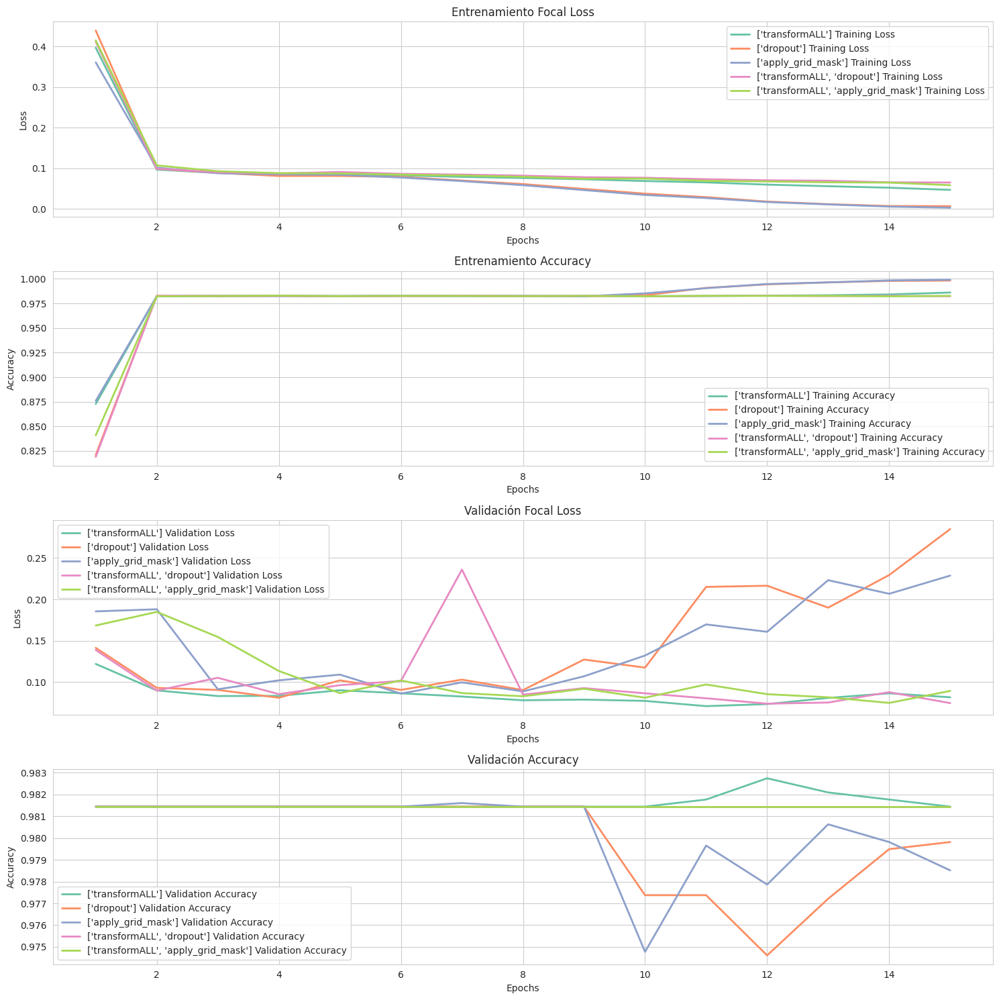

In [45]:
# Estilo de los gráficos (puedes personalizarlo más si lo deseas)
sns.set_style("whitegrid")
sns.set_palette("Set2")

# Crear subgráficos para los gráficos
fig, axs = plt.subplots(4, 1, figsize=(15, 15))

# Iterar a través de las data augmentations
for augmentation_combination, history in zip(data_augmentations, histories):
    # Extraer las métricas de loss y accuracy para training y validation
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    # Crear una lista de epochs
    epochs = range(1, len(loss) + 1)

    # Graficar Focal Loss en el primer subplot (Training)
    axs[0].plot(epochs, loss, label=f'{augmentation_combination} Training Loss', linewidth=2)
    axs[0].set_title('Entrenamiento Focal Loss')
    axs[0].set_xlabel('Epochs')
    axs[0].set_ylabel('Loss')
    axs[0].legend()

    # Graficar Accuracy en el segundo subplot (Training)
    axs[1].plot(epochs, accuracy, label=f'{augmentation_combination} Training Accuracy', linewidth=2)
    axs[1].set_title('Entrenamiento Accuracy')
    axs[1].set_xlabel('Epochs')
    axs[1].set_ylabel('Accuracy')
    axs[1].legend()

    # Graficar Focal Loss en el tercer subplot (Validation)
    axs[2].plot(epochs, val_loss, label=f'{augmentation_combination} Validation Loss', linewidth=2)
    axs[2].set_title('Validación Focal Loss')
    axs[2].set_xlabel('Epochs')
    axs[2].set_ylabel('Loss')
    axs[2].legend()

    # Graficar Validation Accuracy en el cuarto subplot (Validation)
    axs[3].plot(epochs, val_accuracy, label=f'{augmentation_combination} Validation Accuracy', linewidth=2)
    axs[3].set_title('Validación Accuracy')
    axs[3].set_xlabel('Epochs')
    axs[3].set_ylabel('Accuracy')
    axs[3].legend()

# Ajustar el diseño de los gráficos
plt.tight_layout()

# Mostrar los gráficos
plt.show()


Donde podemos observar que la mejor combinación es la que resulta de aplicar transformALL con apply_grid_mask. Además, en la predicción del test en Kaggle obtenemos:

-	transformALL: 89.81%
-	Dropout: 82.15%
-	Apply_grid_mask: 75.65%
-	transformALL y dropout: 90%
-	transformALL y apply_grid_mask: 89.73%

Siendo el mejor modelo el que aplica transformALL y dropout. Además, a partir de la época 9, los modelos con dropout y apply_grid_mask empiezan a tener sobreajuste de parámetros, por eso la predicción es mala cuando se entrenan las 15 épocas. Se puede ajustar para que solo entrene las épocas requeridas.





Por tanto, definimos nuestro mejor modelo con el mejor aumento de datos que hemos obtenido. Así pues, obtenemos el conjunto de entrenamiento.

In [130]:
imSize = 256

# Función para aplicar la máscara de cuadrícula a una imagen
def apply_grid_mask(image, image_shape):
    # image: imagen de entrada
    # image_shape: dimensiones de la imagen (alto, ancho, canales)

    # Generar una máscara de cuadrícula
    mask = GridMask(image_shape[0],
                    image_shape[1],
                    AugParams['d1'],
                    AugParams['d2'],
                    AugParams['rotate'],
                    AugParams['ratio'])

    # Aplicar la máscara a la imagen y devolver la imagen con la máscara
    if image_shape[-1] == 3:
        mask = tf.concat([mask, mask, mask], axis=-1)

    return image * tf.cast(mask, tf.float32)


# Control de aumento de datos
def data_augment(image, label):

    image = transformALL(image, imSize)
    image = apply_grid_mask(image, IMAGE_SIZE)
    image = tf.image.random_hue(image, 0.01)
    image = tf.image.random_saturation(image, 0.7, 1.3)
    image = tf.image.random_contrast(image, 0.8, 1.2)
    image = tf.image.random_brightness(image, 0.2)

    return image, label

def get_training_dataset(train_fns):
    dataset = load_dataset(train_fns, labeled=True)
    dataset = dataset.map(data_augment, num_parallel_calls=AUTO)
    dataset = dataset.repeat() # the training dataset must repeat for several epochs
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(BATCH_SIZE)
    dataset = dataset.prefetch(AUTO) # prefetch next batch while training (autotune prefetch buffer size)
    return dataset

# Obtener el conjunto de datos de entrenamiento con las transformaciones correspondientes
training_dataset = get_training_dataset(train_fns)

Definimos el modelo y procedemos a entrenarlo. Por la gráfica de validacion, definimos 13 épocas de entrenmiento pues es el menor valor para la pérdida focal.

In [131]:
with strategy.scope():
        model = tf.keras.Sequential([
            Xception(
                input_shape=(256, 256, 3),
                weights='imagenet',
                include_top=False
            ),
            layers.GlobalAveragePooling2D(),
            layers.Dense(1, activation='sigmoid')
        ])

        model.compile(
            optimizer='adam',
            loss=focal_loss,
            metrics=['accuracy', tf.keras.metrics.Precision(name='precision'), tf.keras.metrics.Recall(name='recall')]
        )

EPOCHS = 13
lr_callback = get_lr_callback(BATCH_SIZE, REPLICAS)

# Entrenar el modelo y guardar el historial
history = model.fit(training_dataset, steps_per_epoch=steps_per_epoch, epochs=EPOCHS,
                            validation_data=validation_dataset,
                            validation_steps=validation_steps,
                            callbacks=[lr_callback]
                            )


Epoch 1/13
210/210 [==============================] - 125s 239ms/step - loss: 0.6149 - accuracy: 0.6754 - precision: 0.0180 - recall: 0.3284 - val_loss: 0.2026 - val_accuracy: 0.9813 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 5.0000e-06
Epoch 2/13
210/210 [==============================] - 42s 201ms/step - loss: 0.0970 - accuracy: 0.9824 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.0977 - val_accuracy: 0.9814 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 2.6000e-04
Epoch 3/13
210/210 [==============================] - 42s 200ms/step - loss: 0.0888 - accuracy: 0.9826 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.0800 - val_accuracy: 0.9814 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00 - lr: 5.1500e-04
Epoch 4/13
210/210 [==============================] - 43s 204ms/step - loss: 0.0814 - accuracy: 0.9830 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 0.0809 - val_accuracy: 0.9814 - val_precision: 0.0000e+00 - val_rec

In [132]:
results = model.evaluate(validation_dataset, verbose=1)
print('Validation Loss: {}'.format(results[0]))
print('Validation Accuracy: {}'.format(results[1]))

49/49 [==============================] - 6s 72ms/step - loss: 0.0796 - accuracy: 0.9790 - precision: 0.3636 - recall: 0.1739
Validation Loss: 0.07955168932676315
Validation Accuracy: 0.9790424108505249


Veamos ahora las gráficas del accuracy y focal loss.

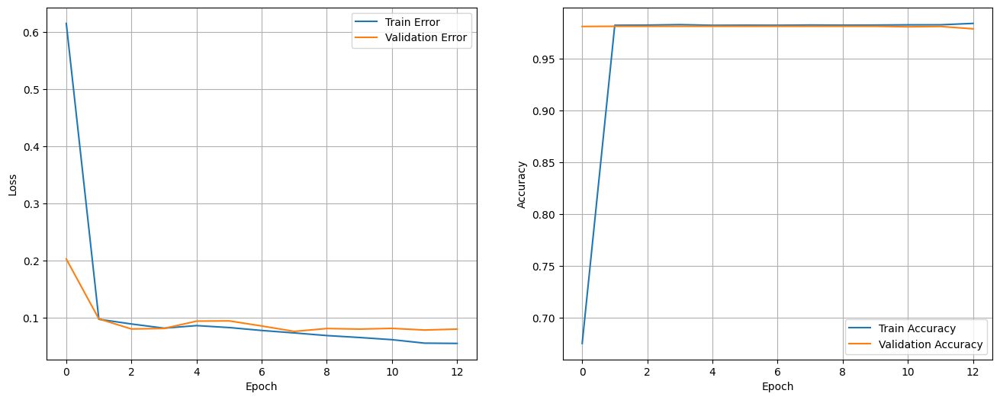

In [133]:
show_loss_accuracy_evolution(history)



Vemos que ya se estabiliza la pérdida focal conforme va avanzando las épocas en nuestro entrenamienot, algo que buscabamos desde el principio.

Guardamos las predicciones del conjunto test para realizar la predicción en kaggle, obteniendo un 90.48%.

In [134]:
print('Computing predictions...')
test_images_ds = test_dataset.map(lambda image, idnum: image)
probabilities = model.predict(test_images_ds).flatten()
print(probabilities)

print('Generating submission.csv file...')
test_ids_ds = test_dataset.map(lambda image, idnum: idnum).unbatch()
test_ids = next(iter(test_ids_ds.batch(NUM_TEST_IMAGES))).numpy().astype('U') # all in one batch
np.savetxt('colab3.csv', np.rec.fromarrays([test_ids, probabilities]), fmt=['%s', '%f'],
           delimiter=',', header='image_name,target', comments='')

Computing predictions...
86/86 [==============================] - 31s 156ms/step
[0.21883693 0.07608271 0.01784739 ... 0.15922341 0.03259021 0.07377854]
Generating submission.csv file...


Guardamos el modelo para poder utilizarlo en la aplicación

In [135]:
# Guardar el modelo en formato JSON
model_json = model.to_json()
with open("modelo.json", "w") as json_file:
    json_file.write(model_json)

# Guardar los pesos del modelo en formato HDF5
model.save_weights("pesos_modeloWithFocalLoss.h5")


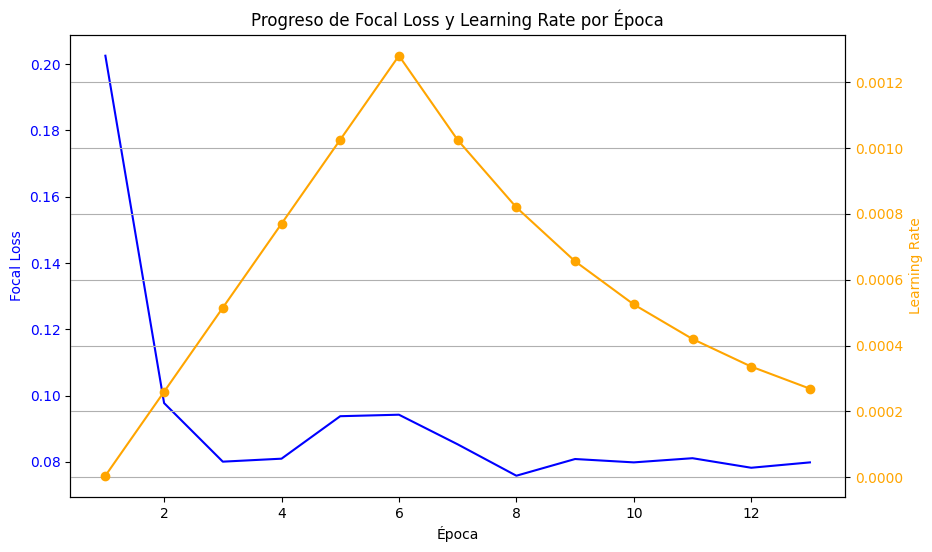

In [136]:
# Suponiendo que 'focal_loss' es la métrica de pérdida focal en el historial
focal_loss_values = history.history['val_loss']

# Suponiendo que 'lr' es la métrica de learning rate en el historial
lr_values = history.history['lr']


# Crear la gráfica
fig, ax1 = plt.subplots(figsize=(10, 6))

# Graficar el focal loss en el primer eje y (eje izquierdo)
ax1.plot(range(1, 13+1), focal_loss_values, label='Focal Loss', color='blue')
ax1.set_xlabel('Época')
ax1.set_ylabel('Focal Loss', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

# Crear un segundo eje y (eje derecho) para el learning rate
ax2 = ax1.twinx()
ax2.plot(range(1, 13+1), lr_values, label='Learning Rate', marker='o', color='orange')
ax2.set_ylabel('Learning Rate', color='orange')
ax2.tick_params(axis='y', labelcolor='orange')

# Título y leyendas
plt.title('Progreso de Focal Loss y Learning Rate por Época')
plt.grid(True)
plt.show()


Aqui vemos la progresión de la pérdida focal con respecto al leraning rate, valores que se estabilizan a lo largo de las épocas.

Ahora vamos a obtener el punto de corte óptimo que genera sobre el conjunto de validación. Primero realizamos toda la predicción.

In [137]:
# Obtener las etiquetas verdaderas y las predicciones del conjunto de validación
validation_true_labels = []
validation_predictions = []

for inputs, labels in validation_dataset:
    validation_true_labels.extend(labels.numpy())
    validation_predictions.extend(model.predict(inputs).flatten())

# Convertir a arreglos numpy
validation_true_labels = np.array(validation_true_labels)
validation_predictions = np.array(validation_predictions)

2/2 [==============================] - 1s 57ms/step


Exception ignored in: <function Executor.__del__ at 0x7fd8deb5c160>
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 46, in __del__
    self.wait()
  File "/usr/local/lib/python3.10/dist-packages/tensorflow/python/eager/executor.py", line 65, in wait
    pywrap_tfe.TFE_ExecutorWaitForAllPendingNodes(self._handle)
tensorflow.python.framework.errors_impl.OutOfRangeError: End of sequence


Seguidamente, sacamos el mejor punto de corte óptimo para predecir.

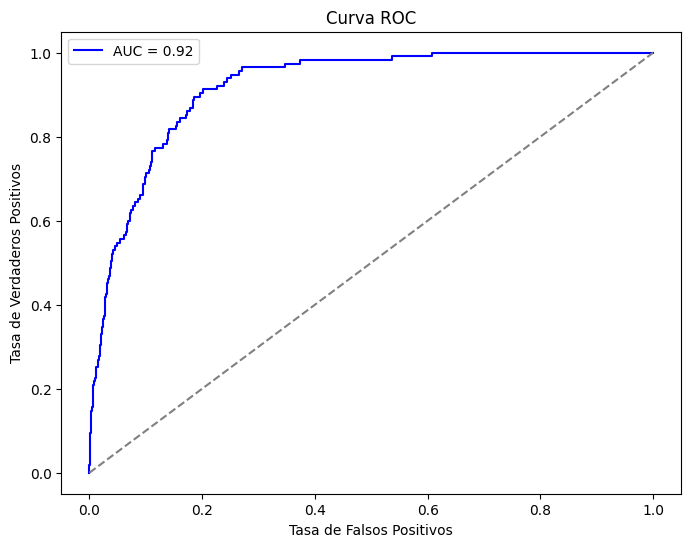

Punto de corte óptimo: 0.13


In [138]:
# Calcula la curva ROC y el AUC
fpr, tpr, thresholds = roc_curve(validation_true_labels, validation_predictions)
auc = roc_auc_score(validation_true_labels, validation_predictions)

# Grafica la curva ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'AUC = {auc:.2f}')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC')
plt.legend()
plt.show()

# Encuentra el índice del punto más cercano al punto (0, 1) en la curva ROC
closest_point_index = np.argmin(np.sqrt((fpr - 0)**2 + (tpr - 1)**2))
optimal_threshold = thresholds[closest_point_index]

print(f'Punto de corte óptimo: {optimal_threshold:.2f}')



Asimismo, obtenemos un AUC de un 0.92, siendo un valor bastante bueno a la hora de predecir el cáncer de piel

Por otro lado, nos da el punto de corte óptimo para la separación de las clases, lo introducimos en el siguiente código y vemos un reportivo de los datos.

              precision    recall  f1-score   support

           0       1.00      0.81      0.89      6088
           1       0.08      0.90      0.15       115

    accuracy                           0.81      6203
   macro avg       0.54      0.85      0.52      6203
weighted avg       0.98      0.81      0.88      6203



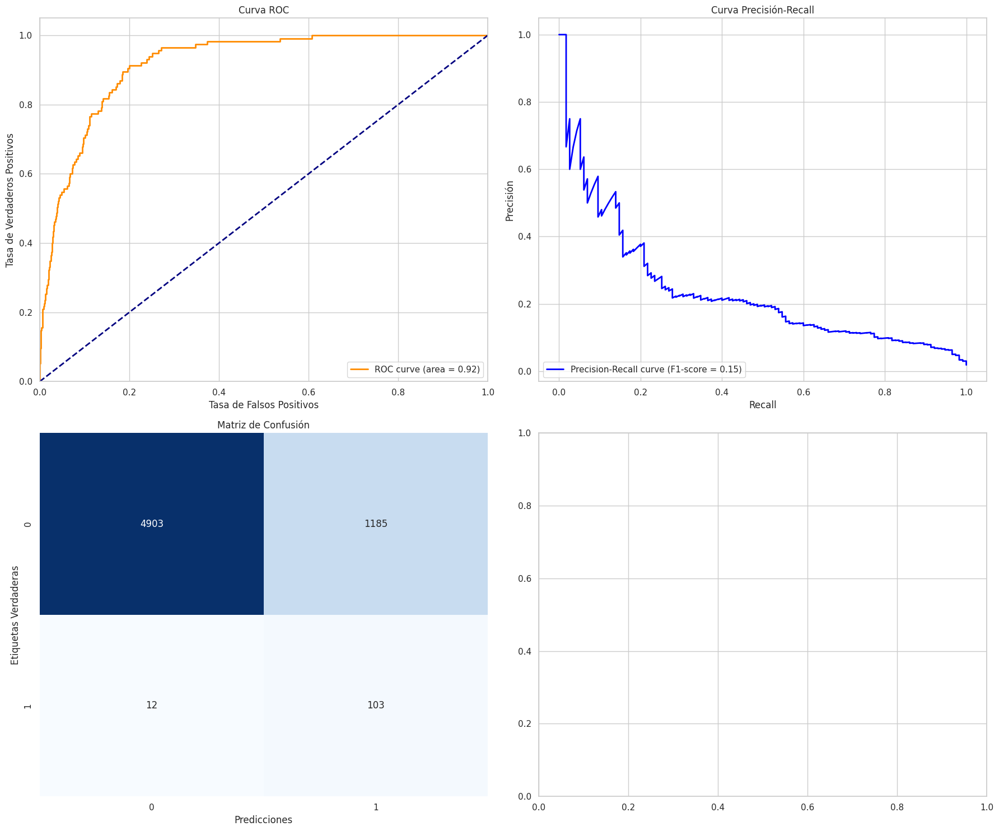

In [139]:
from sklearn.metrics import f1_score, auc
# Redondear las predicciones a clases binarias (0 o 1)
validation_binary_predictions = (validation_predictions > 0.13).astype(int)

# Calcular métricas adicionales
fpr, tpr, _ = roc_curve(validation_true_labels, validation_predictions)
roc_auc = auc(fpr, tpr)

precision, recall, _ = precision_recall_curve(validation_true_labels, validation_predictions)
f1 = f1_score(validation_true_labels, validation_binary_predictions)

# Calcular la matriz de confusión
confusion = confusion_matrix(validation_true_labels, validation_binary_predictions)

# Configurar el estilo de las gráficas
sns.set(style='whitegrid')
plt.figure(figsize=(18, 15))

# Curva ROC
plt.subplot(2, 2, 1)
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Tasa de Falsos Positivos')
plt.ylabel('Tasa de Verdaderos Positivos')
plt.title('Curva ROC')
plt.legend(loc='lower right')

# Curva Precisión-Recall
plt.subplot(2, 2, 2)
plt.plot(recall, precision, color='blue', lw=2, label=f'Precision-Recall curve (F1-score = {f1:.2f})')
plt.xlabel('Recall')
plt.ylabel('Precisión')
plt.title('Curva Precisión-Recall')
plt.legend(loc='lower left')

# Matriz de Confusión
plt.subplot(2, 2, 3)
sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicciones')
plt.ylabel('Etiquetas Verdaderas')
plt.title('Matriz de Confusión')

# Reporte de Clasificación
plt.subplot(2, 2, 4)
classification_rep = classification_report(validation_true_labels, validation_binary_predictions)
print(classification_rep)

plt.tight_layout()
plt.show()




El modelo muestra un buen rendimiento en términos de precisión para la clase benigna, pero su precisión en la clase maligna es baja. No obstante, logra un alto recall del 90% para la clase maligna. El F1-score refleja las dificultades del modelo para equilibrar precisión y recall en ambas clases, debido al desequilibrio en el tamaño de estas. Para la clase benigna, el F1-score es de 0.89, mientras que para la clase maligna es de 0.15.
